# EEG Analysis Completo: Todos os Arquivos

Este notebook realiza análise de sinais de EEG **para todos os sujeitos do dataset**,  
comparando os sinais **antes** e **durante** a tarefa de aritmética mental.  

Para cada arquivo:
- Estatísticas descritivas
- Gráficos dos primeiros 4 canais
- FFT do canal Fp1  

Todos os gráficos são salvos em arquivos `.png` para uso no GitHub ou portfólio.

In [1]:
# === 1. Importação de bibliotecas ===
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline

## 2. Caminho dos dados

In [2]:
dataset_path = "EEG"  # pasta com os CSVs
csv_files = [f for f in os.listdir(dataset_path) if f.endswith(".csv")]
print(f"{len(csv_files)} arquivos encontrados. Exemplos:", csv_files[:5])

36 arquivos encontrados. Exemplos: ['s00.csv', 's01.csv', 's02.csv', 's03.csv', 's04.csv']


## 3. Canais

In [3]:
channels = ['Fp1', 'Fp2', 'F3', 'F4', 'F7', 'F8', 'T3','T4', 'C3', 'C4', 
            'T5', 'T6', 'P3', 'P4', 'O1', 'O2', 'Fz', 'Cz', 'Pz']

# Lê CSVs em dicionário
eeg_data = {}
for file in csv_files:
    path_file = os.path.join(dataset_path, file)
    eeg_data[file] = pd.read_csv(path_file, header=None, names=channels)

## 4. Funções de análise

In [4]:
def split_before_after(df):
    N = len(df)
    mid = N // 2
    return df.iloc[:mid, :], df.iloc[mid:, :]

def plot_eeg_signals(df, channels=None, title="EEG Signals", save_path=None):
    if channels is None:
        channels = df.columns.tolist()
    plt.figure(figsize=(15,6))
    for ch in channels:
        plt.plot(df[ch], label=ch)
    plt.xlabel("Amostras")
    plt.ylabel("Amplitude")
    plt.title(title)
    plt.legend(loc="upper right")
    if save_path: plt.savefig(save_path)
    plt.show()

def plot_fft(df, channel, save_path=None):
    sig = df[channel].values
    N = len(sig)
    T = 1.0
    freq = np.fft.rfftfreq(N, d=T)
    fft_vals = np.fft.rfft(sig)
    plt.figure(figsize=(12,4))
    plt.plot(freq, np.abs(fft_vals))
    plt.title(f"FFT - {channel}")
    plt.xlabel("Frequência")
    plt.ylabel("Amplitude")
    if save_path: plt.savefig(save_path)
    plt.show()

def compute_stats(df):
    stats = pd.DataFrame(index=df.columns)
    stats['mean'] = df.mean()
    stats['std'] = df.std()
    stats['min'] = df.min()
    stats['max'] = df.max()
    return stats

## 5. Criar pastas para salvar gráficos

In [5]:
os.makedirs("plots/sinais", exist_ok=True)
os.makedirs("plots/fft", exist_ok=True)

## 6. Processar todos os arquivos

### Arquivo: s00.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,-0.180666,15.607368,-72.543,78.811
Fp2,-0.050662,10.987674,-50.117,33.815
F3,-0.053205,11.713444,-47.346,39.464
F4,-0.046863,12.157037,-44.731,40.940
F7,-0.085562,11.974372,-40.572,40.994
F8,-0.020733,11.978755,-43.007,40.517
T3,0.003812,11.300907,-37.507,37.405
T4,0.011163,14.003279,-67.151,62.347
C3,-0.045354,11.218364,-47.018,35.686
C4,-0.052933,11.333372,-43.629,36.298



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,-0.202947,16.637328,-93.347,61.425
Fp2,-0.554861,13.680341,-82.339,47.909
F3,-0.366198,14.061649,-68.406,46.165
F4,-0.228987,12.476414,-58.415,45.455
F7,-0.283268,13.916770,-74.958,48.981
F8,-0.364500,13.274205,-70.010,49.068
T3,-0.132815,11.867672,-56.657,47.981
T4,-0.121567,12.609625,-55.773,49.861
C3,-0.273731,12.094146,-55.330,39.125
C4,-0.248188,11.639525,-49.501,36.773


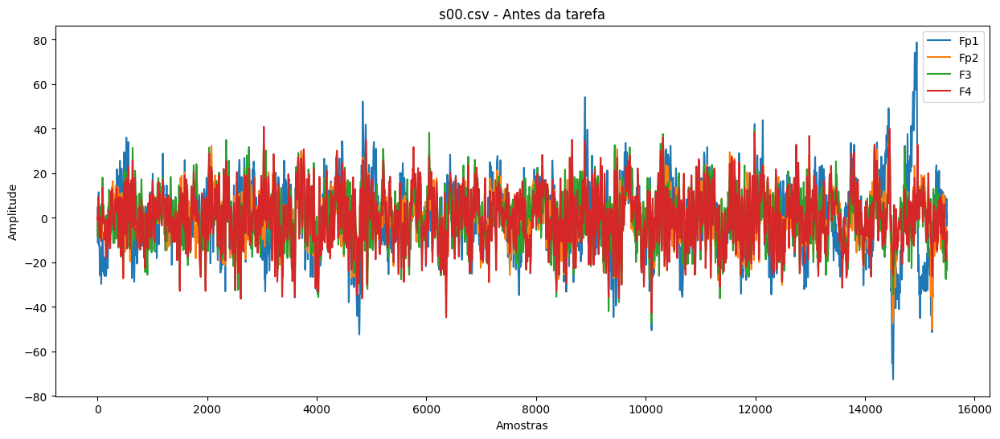

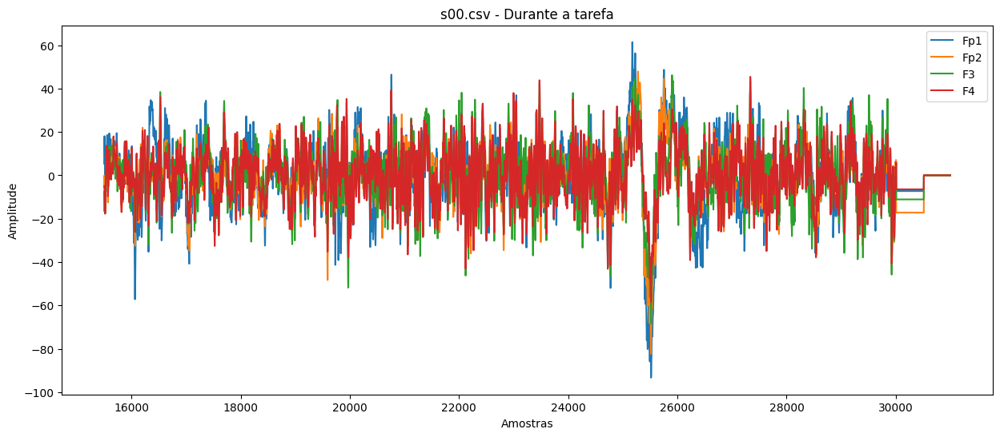

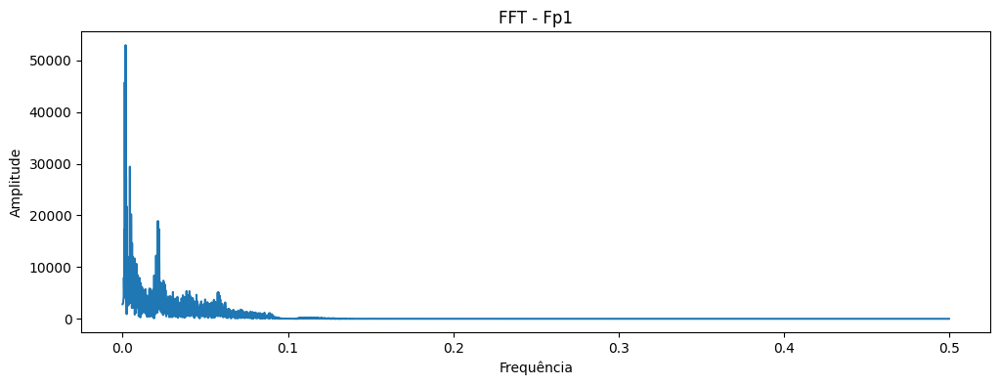

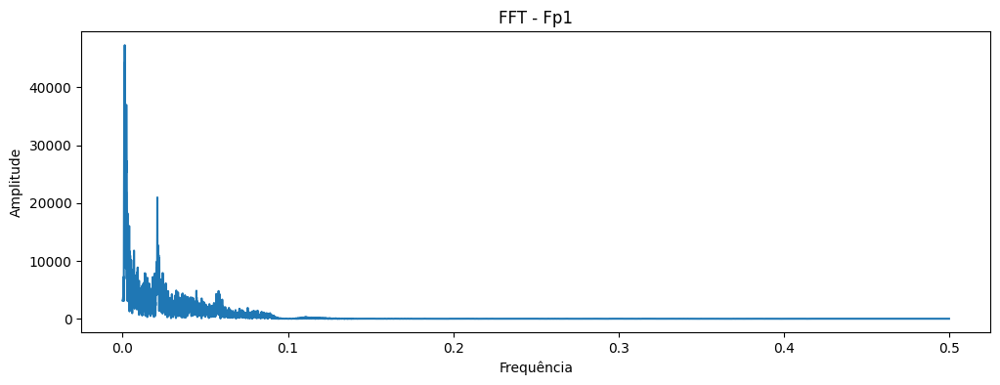

### Arquivo: s01.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,0.145788,13.894508,-53.014,69.610
Fp2,-0.164505,10.283700,-38.620,41.694
F3,0.002698,12.780441,-63.668,52.693
F4,-0.096365,10.750666,-41.983,35.704
F7,0.208391,15.566496,-60.671,54.542
F8,-0.277599,17.156363,-72.483,63.826
T3,0.008938,11.523444,-161.620,70.356
T4,-0.086124,11.430173,-39.294,49.232
C3,-0.040125,10.728049,-62.568,36.516
C4,-0.127687,11.925968,-87.946,33.435



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,0.107720,13.972251,-53.465,47.632
Fp2,0.397690,10.832046,-43.343,58.349
F3,-0.212698,11.208596,-46.685,44.529
F4,0.409119,11.472320,-45.775,65.220
F7,-0.325235,15.014885,-58.628,52.478
F8,0.023824,18.163451,-76.155,65.468
T3,-1.571228,13.338235,-45.633,36.189
T4,0.097117,14.064670,-43.092,55.636
C3,-0.198426,11.167143,-44.185,50.105
C4,-0.661891,11.213255,-38.768,42.217


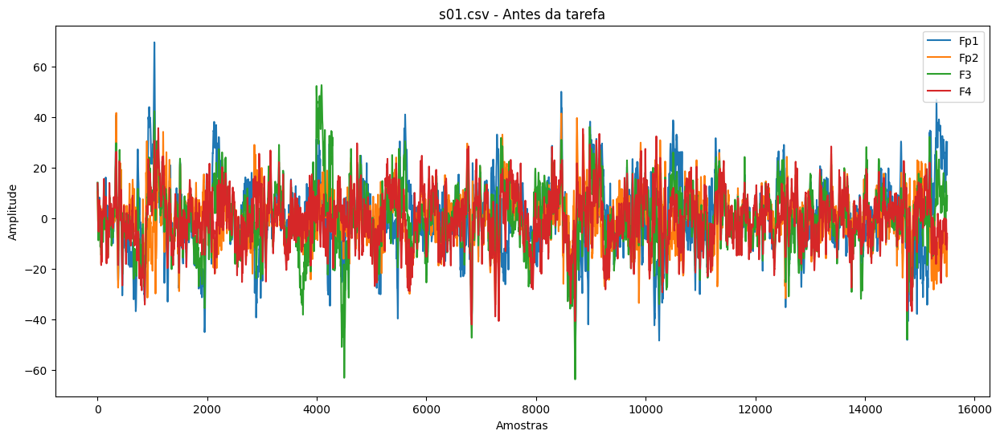

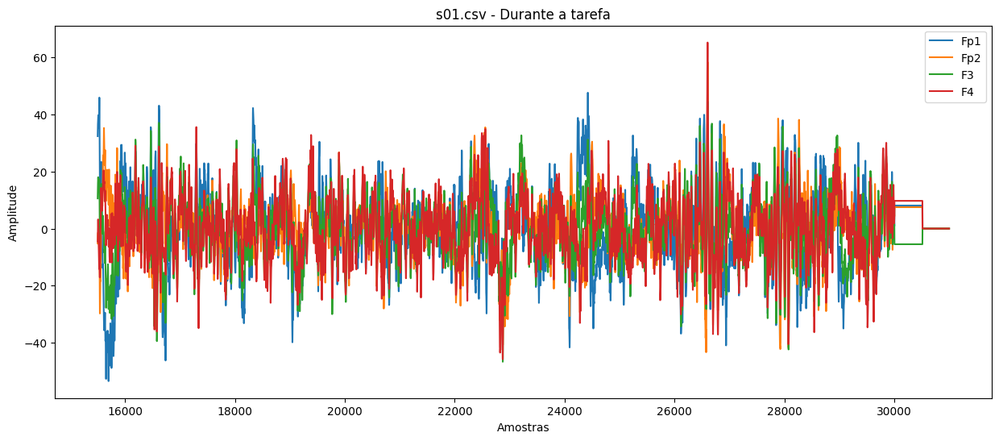

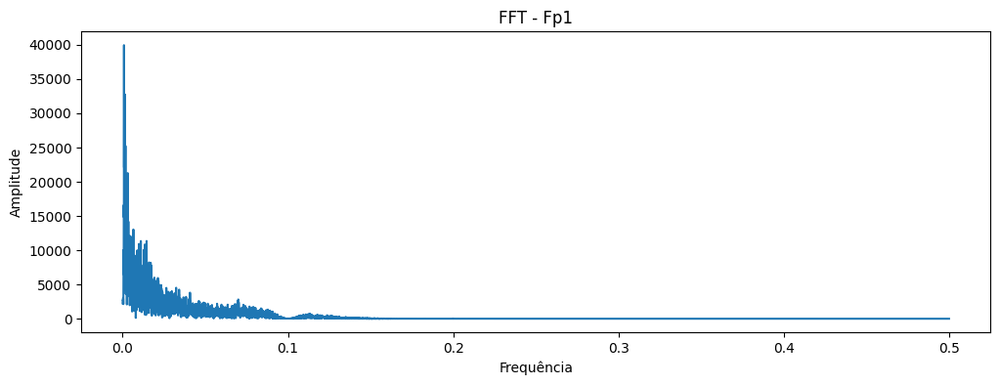

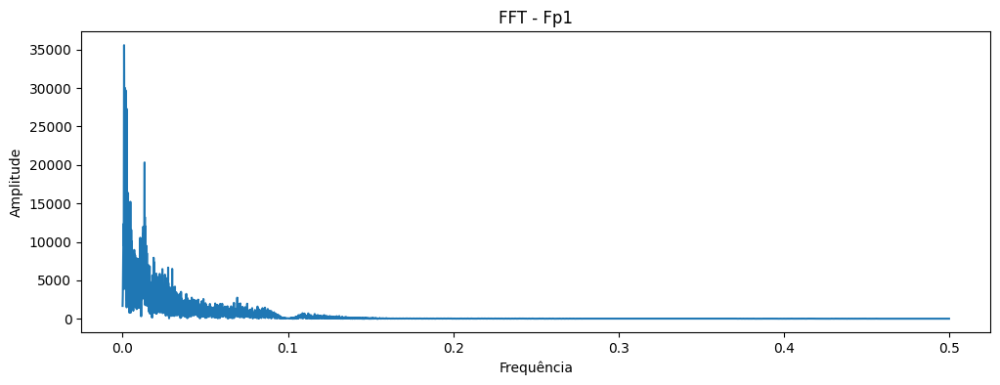

### Arquivo: s02.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,-0.055714,9.923457,-44.784,42.756
Fp2,-0.041929,13.997436,-51.215,57.440
F3,-0.012316,9.179827,-30.847,36.778
F4,0.010972,8.950172,-34.799,35.255
F7,0.006301,9.513987,-38.442,38.632
F8,0.007559,11.565358,-42.452,40.838
T3,0.029846,9.621742,-35.428,30.491
T4,-0.004394,9.905218,-34.171,37.633
C3,0.013901,10.582501,-33.115,37.226
C4,-0.000547,10.645438,-32.949,38.625



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,0.021471,9.111453,-34.542,34.997
Fp2,0.227512,14.029536,-54.443,65.894
F3,0.088557,9.397260,-32.056,36.087
F4,0.045297,9.050502,-31.087,38.304
F7,-0.004276,9.547759,-32.025,33.769
F8,0.276310,10.935542,-48.082,65.543
T3,0.079977,10.814183,-41.084,47.869
T4,0.061180,9.691144,-35.297,38.833
C3,0.267933,11.059807,-33.941,51.242
C4,0.111259,10.902377,-35.637,42.480


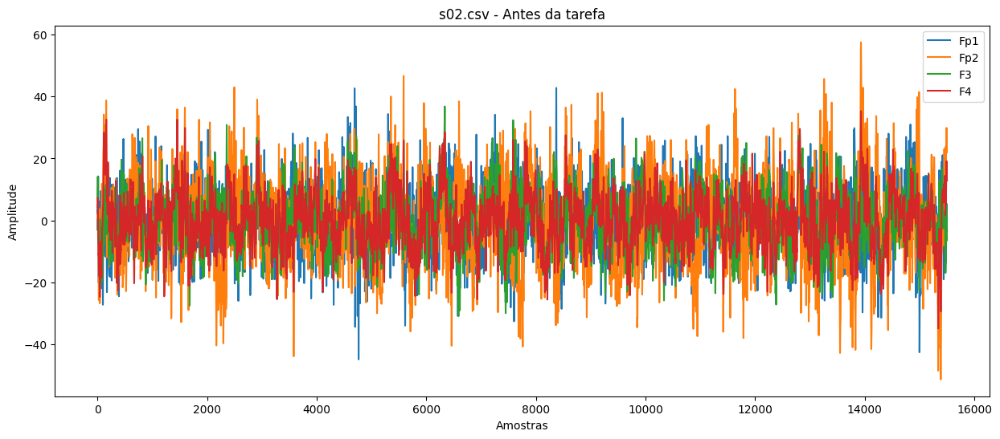

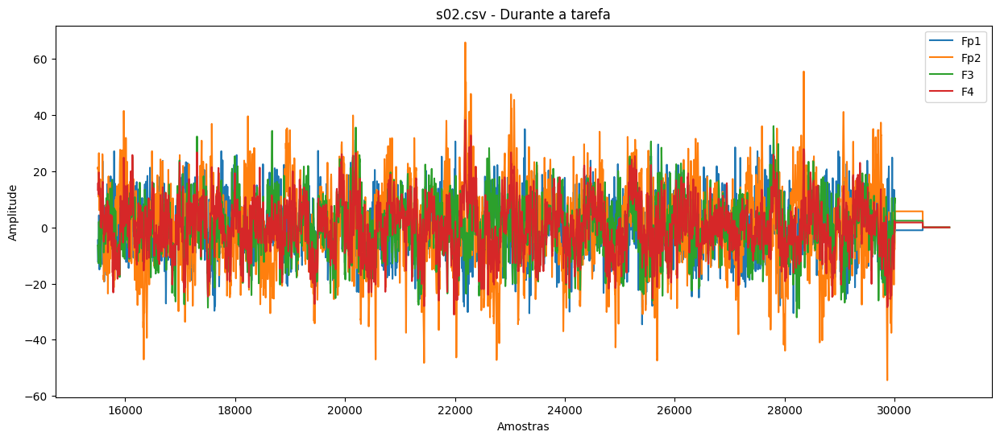

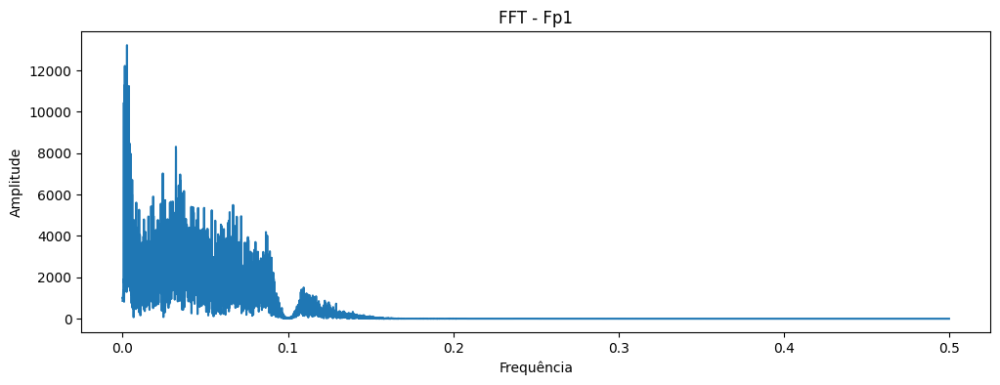

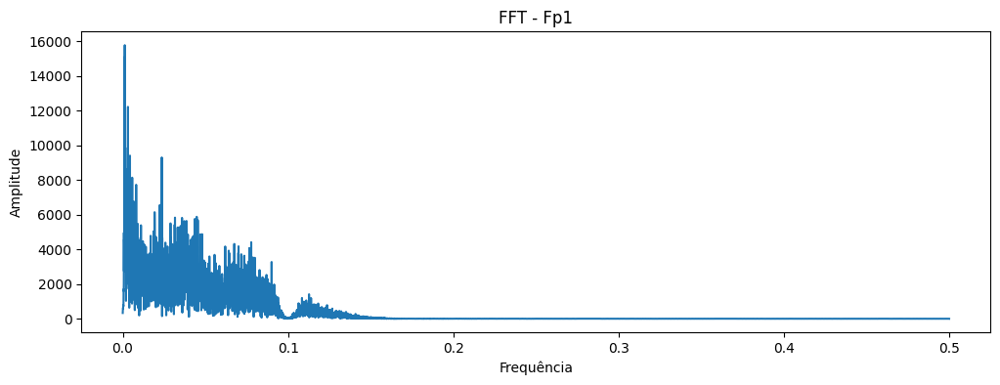

### Arquivo: s03.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,-0.080578,11.049377,-44.063,38.380
Fp2,-0.038624,12.446788,-81.342,76.311
F3,-0.009359,7.705367,-28.352,25.490
F4,0.005715,8.017588,-32.395,27.200
F7,-0.086028,7.878920,-25.874,27.207
F8,-0.035166,5.874388,-22.734,22.318
T3,0.007415,8.091088,-26.203,29.293
T4,0.009228,6.790405,-24.756,25.627
C3,0.017541,7.821606,-29.675,28.428
C4,-0.005378,8.343261,-30.424,37.450



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,-0.109819,9.185440,-28.528,33.926
Fp2,-0.104317,8.363078,-35.664,27.123
F3,0.038258,7.853818,-28.710,31.692
F4,-0.061088,8.689432,-40.246,34.494
F7,-0.147512,7.112834,-33.954,25.923
F8,0.035772,5.999466,-21.820,23.573
T3,0.019470,8.645773,-30.057,35.888
T4,0.024902,7.510978,-28.676,27.414
C3,0.010804,8.767423,-33.950,35.528
C4,0.054038,9.387178,-35.729,36.341


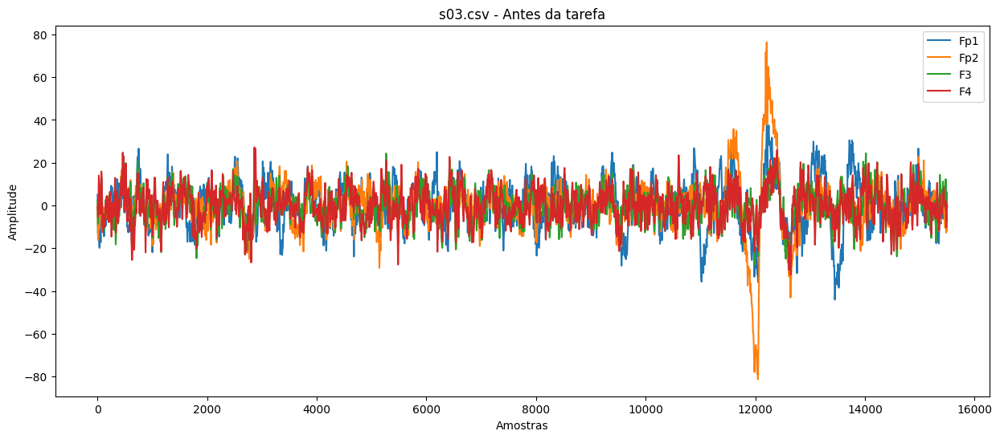

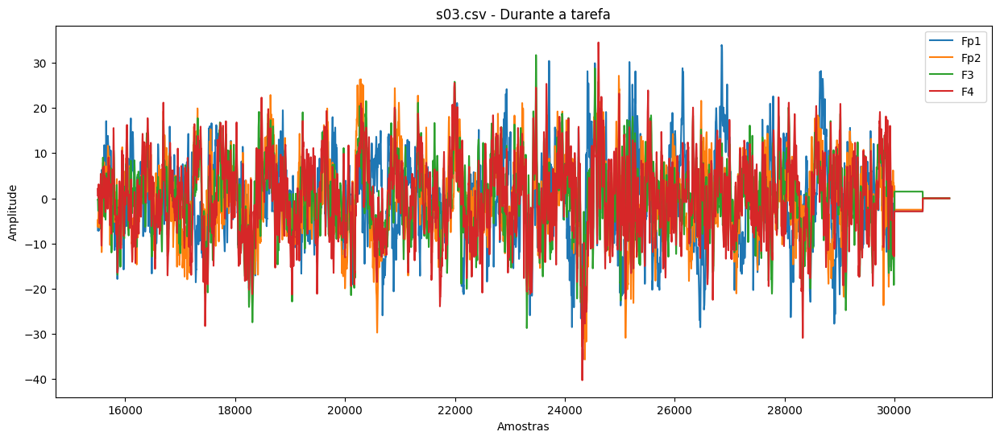

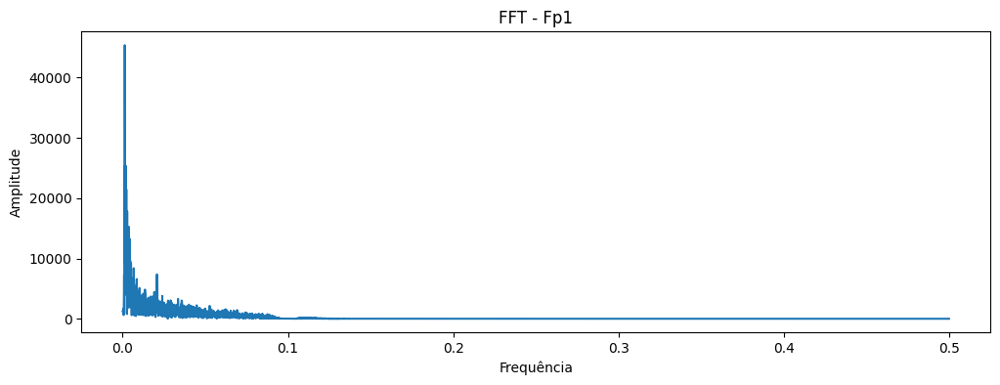

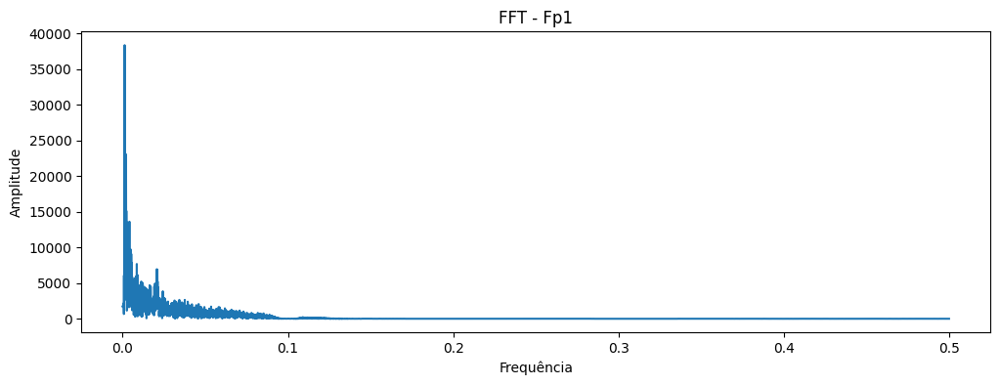

### Arquivo: s04.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,-0.019844,10.558785,-35.803,36.533
Fp2,0.019182,20.818229,-91.738,64.112
F3,0.036175,12.441054,-47.286,41.101
F4,-0.027031,13.860883,-57.581,46.483
F7,-0.026288,12.279094,-44.324,46.779
F8,0.015976,17.995538,-61.603,62.549
T3,0.076222,10.220961,-42.348,38.369
T4,-0.053158,13.557736,-53.048,44.229
C3,0.099867,13.803261,-45.940,52.164
C4,0.087897,13.490340,-61.307,55.992



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,-0.030120,10.541657,-39.549,35.382
Fp2,-0.470501,17.744613,-66.099,61.313
F3,-0.104674,12.682749,-45.447,43.144
F4,-0.154809,12.962427,-53.351,37.224
F7,0.064927,8.288912,-27.022,27.082
F8,-0.059583,15.762519,-65.121,61.020
T3,-0.141764,9.617034,-36.787,34.963
T4,-0.116996,12.408403,-54.609,39.533
C3,-0.116085,13.346918,-58.109,57.218
C4,-0.175947,12.701033,-46.583,36.280


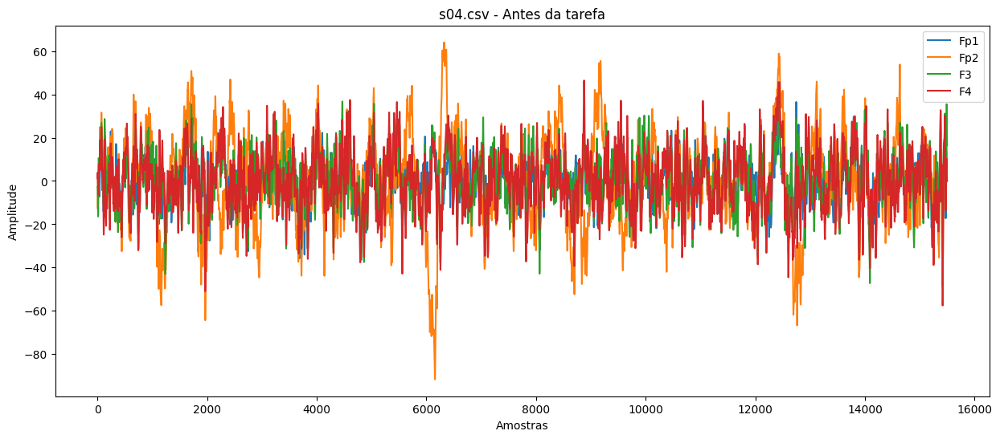

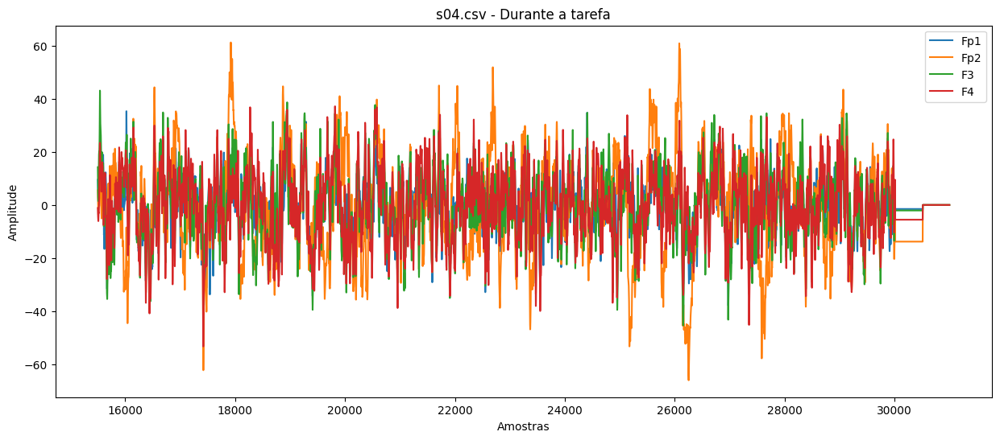

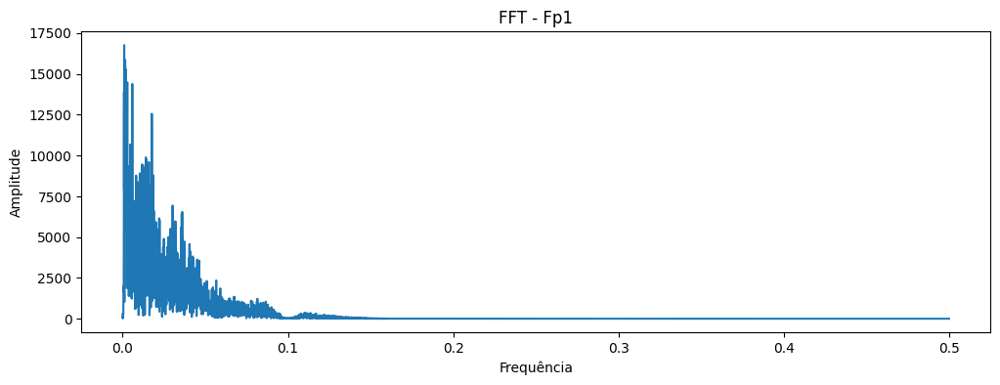

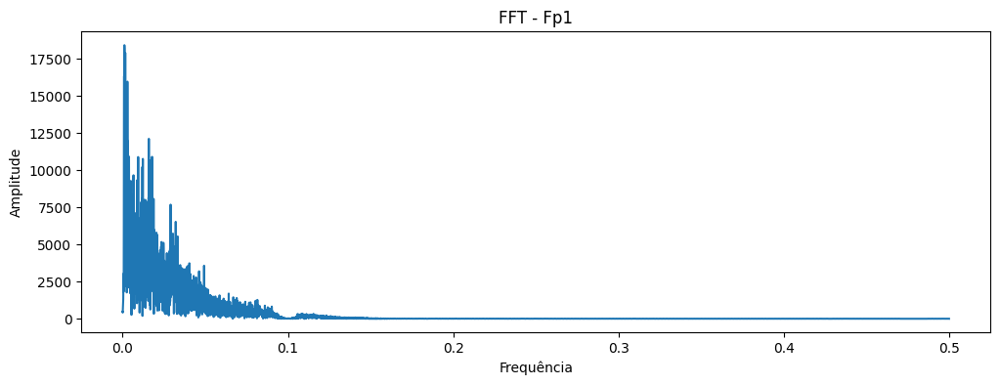

### Arquivo: s05.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,0.027073,18.564498,-76.116,60.803
Fp2,0.051465,15.324122,-53.557,76.063
F3,0.014116,11.093726,-45.042,43.931
F4,0.020872,10.725690,-43.098,33.631
F7,0.081469,14.494591,-55.376,48.034
F8,0.034072,8.967185,-40.122,25.039
T3,-0.035073,9.657135,-42.200,31.744
T4,0.025008,10.459655,-71.430,36.748
C3,0.000982,9.710510,-43.399,37.620
C4,-0.004901,10.301910,-40.955,33.830



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,-0.106529,16.928746,-48.900,63.665
Fp2,0.351096,13.077183,-51.570,51.533
F3,-0.051877,10.024574,-47.331,32.026
F4,-0.240297,9.933736,-48.285,32.770
F7,0.034004,14.008894,-48.674,51.530
F8,-0.099694,8.396717,-37.491,32.371
T3,-0.156266,8.211341,-35.025,30.989
T4,-0.536377,9.060303,-41.907,30.317
C3,-0.082745,8.995806,-39.524,30.370
C4,-0.133473,9.941852,-43.113,34.444


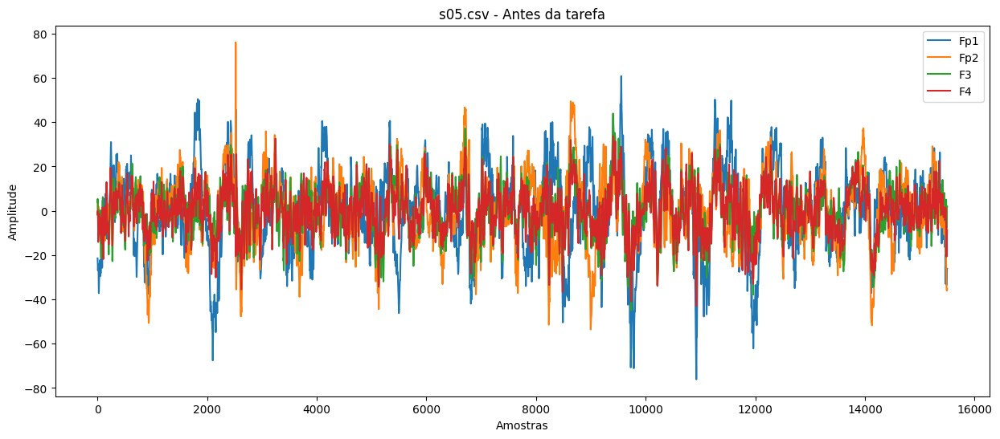

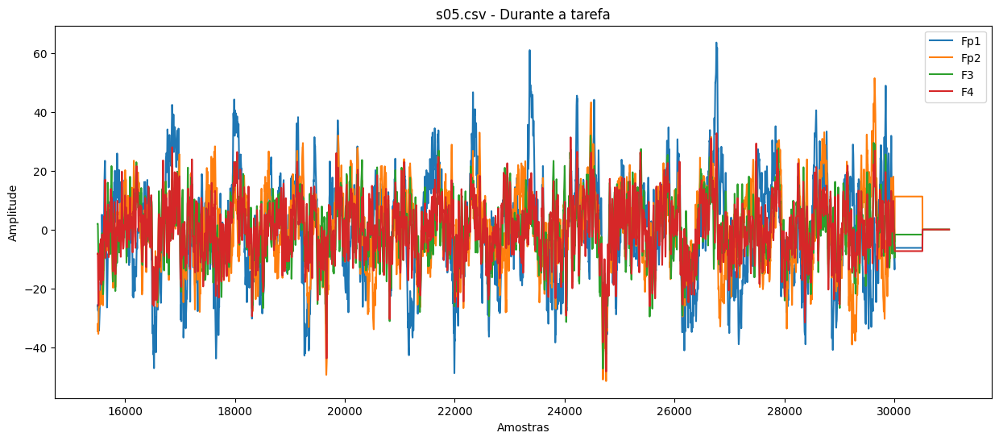

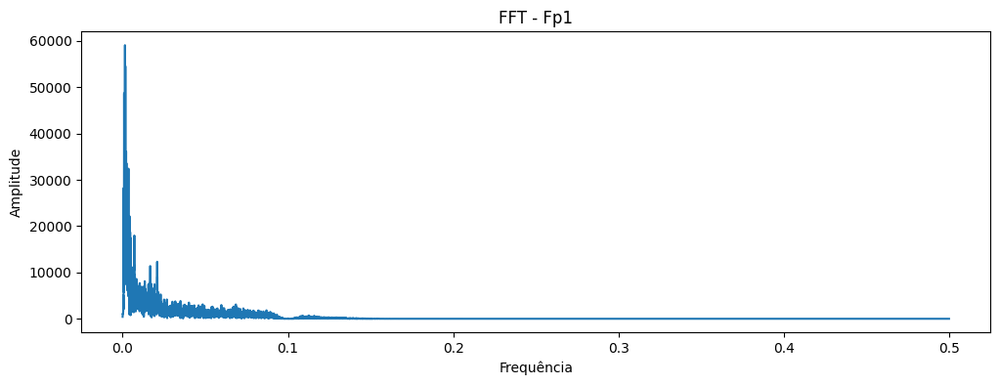

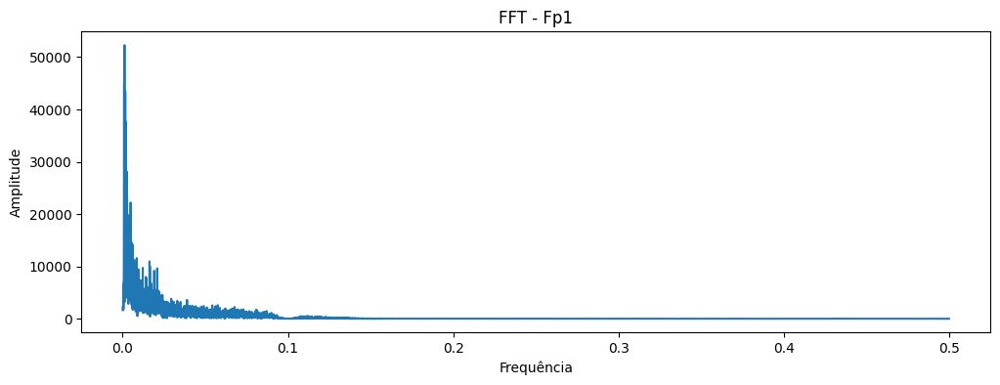

### Arquivo: s06.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,-0.144301,11.249366,-43.402,43.176
Fp2,-0.077763,7.013249,-24.294,24.697
F3,-0.006533,7.507161,-28.794,26.498
F4,0.048153,6.925646,-28.707,24.844
F7,-0.097388,7.237142,-24.606,24.913
F8,0.029448,6.653599,-25.555,26.176
T3,-0.049061,5.133003,-16.539,16.661
T4,0.040791,5.965620,-22.070,18.652
C3,0.011683,6.640657,-26.384,21.625
C4,0.040044,6.293234,-23.845,20.188



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,0.097255,15.790207,-55.001,52.238
Fp2,0.128872,8.604154,-28.237,31.384
F3,0.045125,8.801141,-34.347,36.745
F4,-0.013678,7.464779,-27.651,30.828
F7,0.145014,8.153792,-23.870,27.533
F8,0.091223,7.406600,-26.433,33.770
T3,0.055918,5.797861,-21.934,22.387
T4,-0.158436,5.995933,-28.541,21.459
C3,-0.057039,7.001207,-26.544,23.824
C4,-0.119640,6.582569,-28.399,23.626


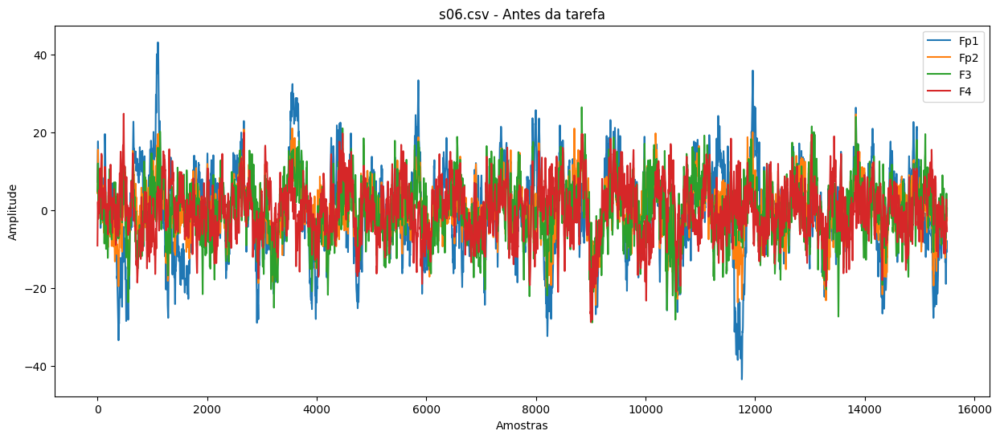

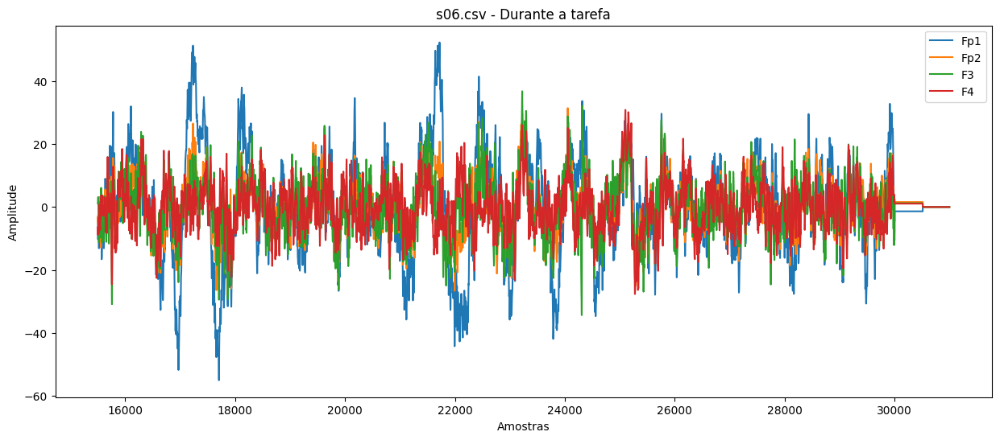

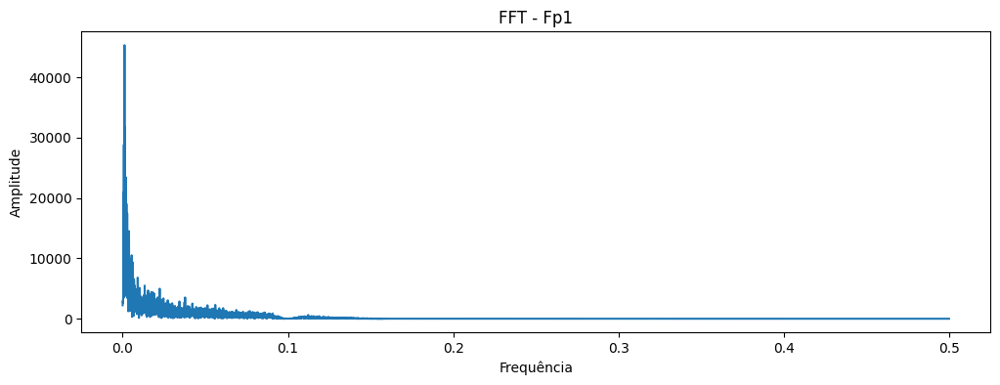

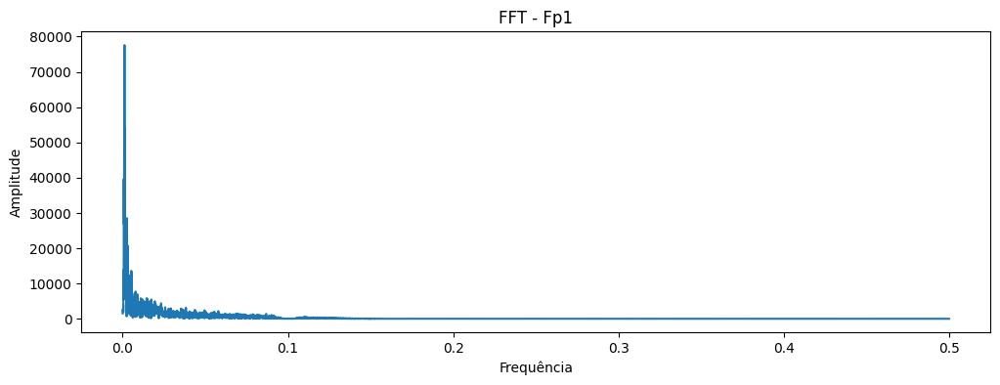

### Arquivo: s07.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,-0.041966,11.144629,-37.617,31.623
Fp2,-0.156603,14.985182,-49.203,48.432
F3,-0.080704,9.234484,-32.606,30.284
F4,-0.087937,9.705562,-34.852,36.058
F7,0.248178,10.874286,-44.615,52.766
F8,-0.053358,9.246218,-33.278,33.555
T3,-0.077716,9.439440,-40.286,51.556
T4,0.030204,9.165526,-39.297,34.534
C3,-0.102453,12.831040,-66.662,57.730
C4,-0.154783,10.181577,-41.134,47.497



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,0.050269,13.306084,-53.892,54.499
Fp2,0.091858,15.477159,-52.330,45.766
F3,-0.051239,9.581118,-38.337,29.227
F4,-0.009768,10.023144,-41.998,35.379
F7,-0.117069,9.648193,-43.862,32.779
F8,0.215690,8.934077,-32.832,43.333
T3,0.259606,8.372445,-26.824,33.507
T4,-0.032622,8.626205,-35.092,39.213
C3,-0.044392,11.755588,-44.059,42.010
C4,0.181175,10.743430,-46.688,48.397


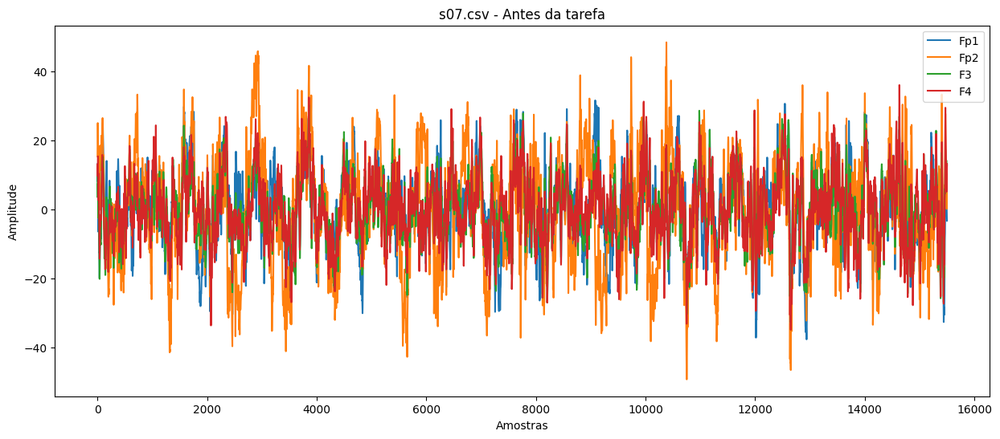

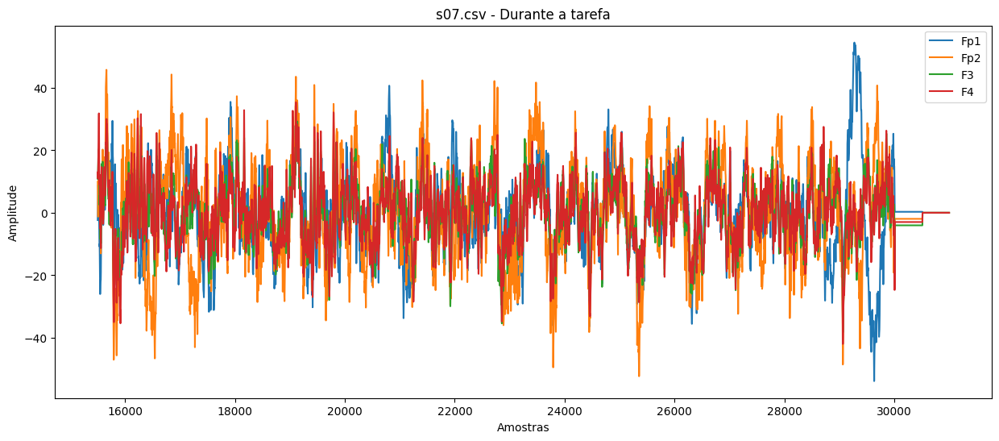

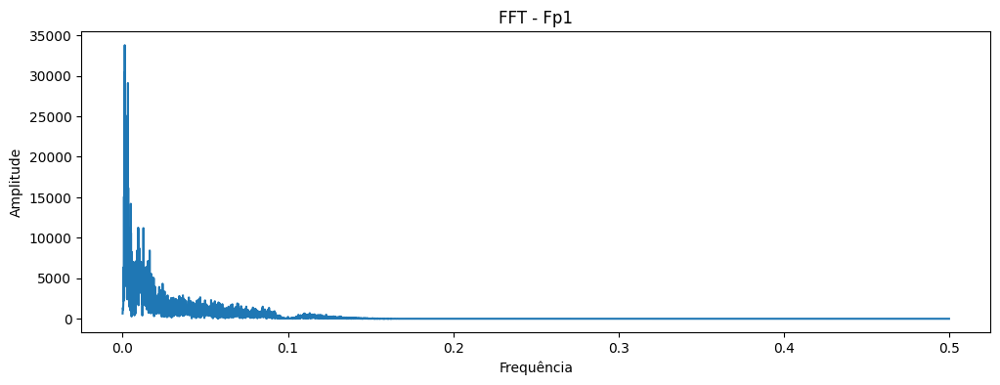

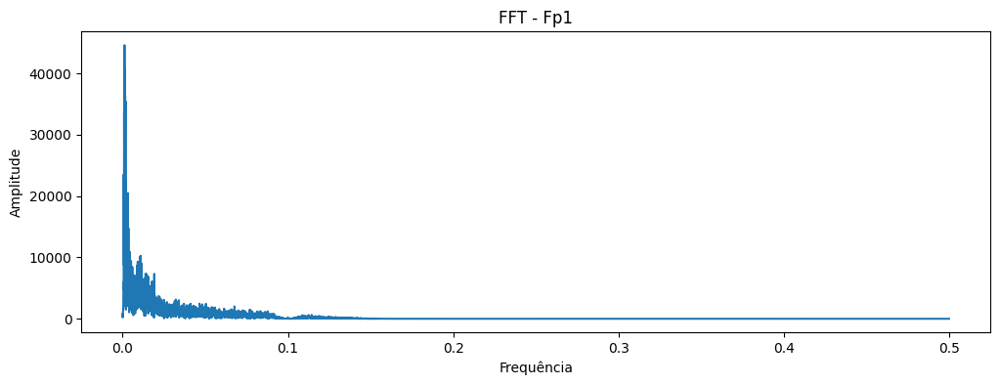

### Arquivo: s08.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,-0.061047,11.087576,-39.534,35.856
Fp2,-0.079253,12.209761,-34.567,42.804
F3,-0.025757,6.873477,-27.192,21.667
F4,0.021142,8.361252,-28.969,25.253
F7,-0.014593,8.589044,-33.914,33.560
F8,-0.015106,7.648774,-25.551,26.052
T3,-0.152269,6.677638,-23.448,24.197
T4,0.049378,5.500075,-22.533,19.571
C3,-0.028620,6.556135,-25.092,20.377
C4,0.002260,6.614733,-29.105,19.957



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,-0.169318,11.754395,-61.202,48.499
Fp2,0.042803,11.798784,-41.721,37.448
F3,-0.082686,6.922568,-27.339,22.352
F4,-0.074031,8.892574,-30.170,30.128
F7,-0.049100,9.396385,-38.375,33.653
F8,0.194627,7.537659,-24.034,34.824
T3,0.075524,6.578694,-26.135,26.692
T4,-0.087741,5.465654,-19.791,20.656
C3,-0.071264,6.811019,-29.504,22.886
C4,-0.071848,6.318786,-27.639,23.983


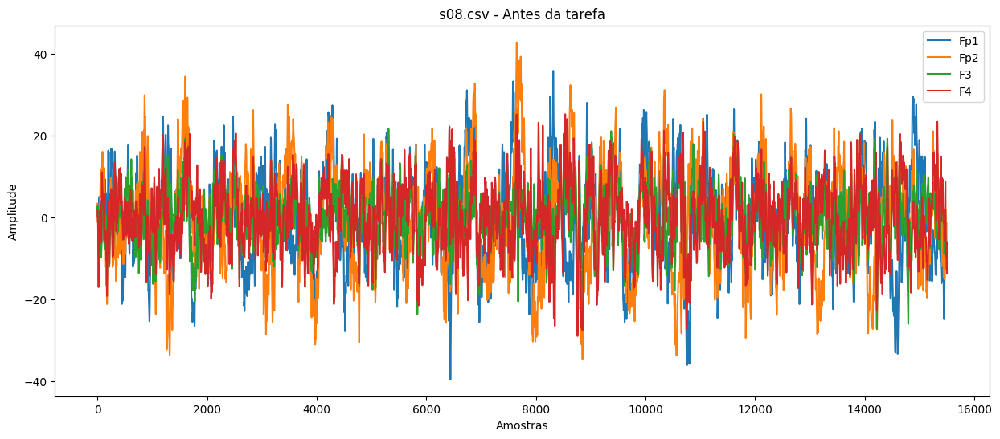

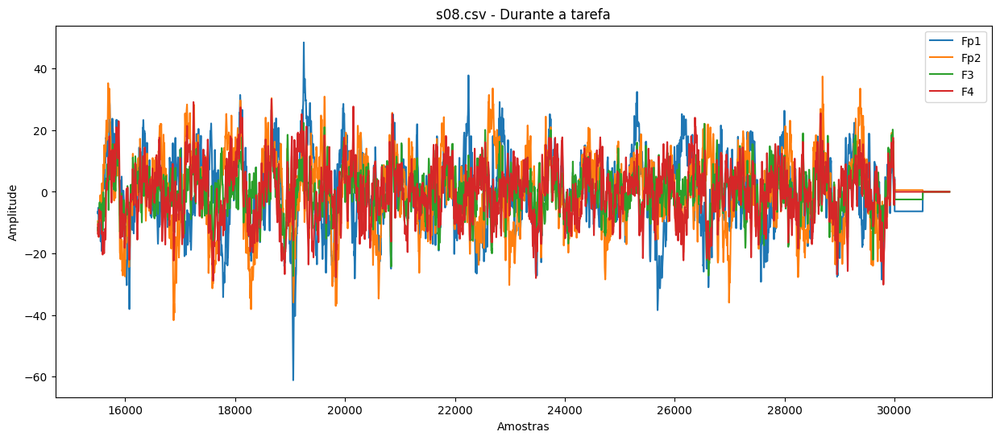

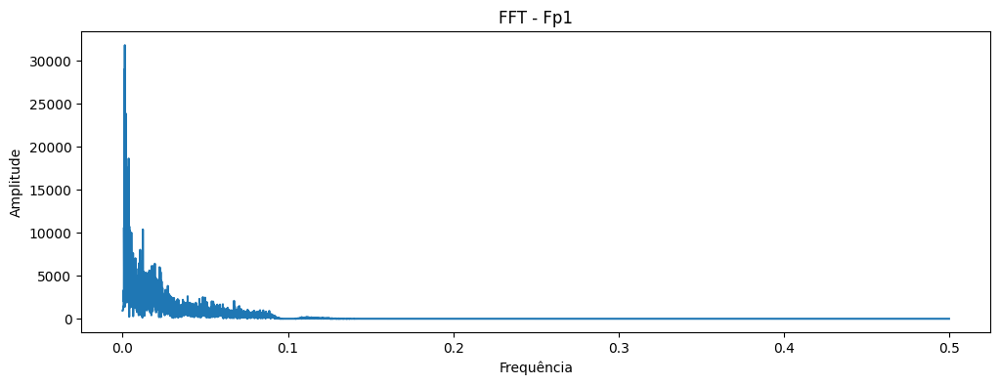

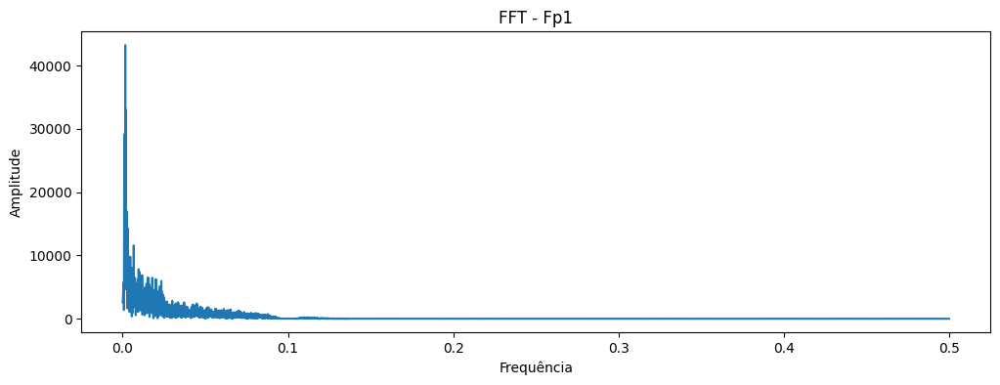

### Arquivo: s09.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,-0.109806,9.018356,-56.258,28.604
Fp2,0.011174,5.484683,-20.785,28.678
F3,-0.043094,9.009693,-35.042,36.035
F4,-0.003870,8.624716,-37.217,32.500
F7,-0.089282,9.195542,-41.327,35.277
F8,0.028478,6.638994,-33.515,26.828
T3,-0.027766,6.601029,-22.393,24.104
T4,-0.004011,7.434480,-26.374,26.612
C3,-0.069589,8.826400,-31.361,32.114
C4,-0.047887,9.227928,-32.303,40.113



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,-0.156023,9.627565,-29.416,39.959
Fp2,0.116452,5.668887,-20.115,22.869
F3,0.114325,9.347629,-30.662,39.496
F4,-0.073556,8.429384,-28.969,28.995
F7,0.325964,10.666362,-39.339,56.002
F8,-0.137886,6.443989,-24.166,25.200
T3,0.083092,7.370798,-28.515,31.975
T4,-0.059789,7.237713,-30.498,26.050
C3,0.043924,8.870670,-33.645,31.783
C4,0.030382,10.788174,-51.061,50.073


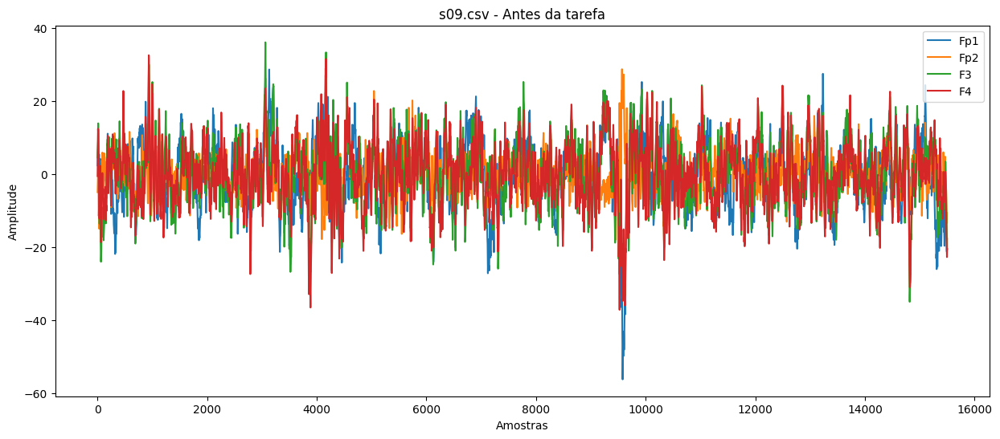

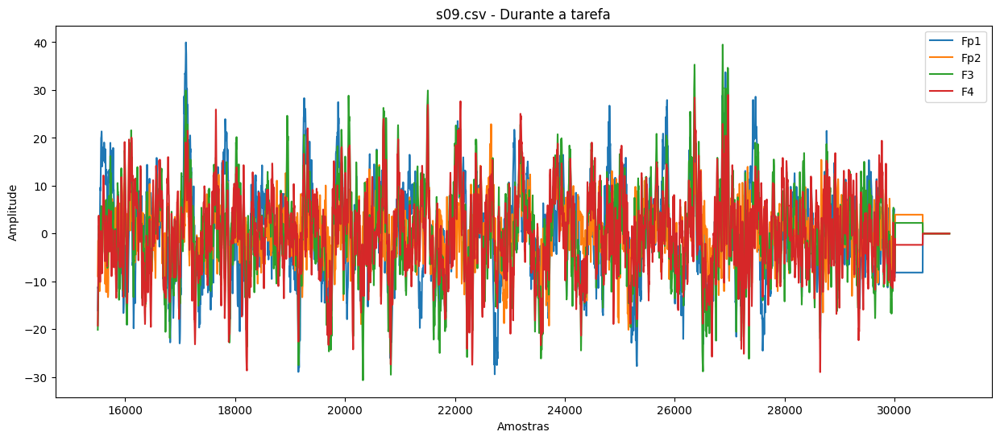

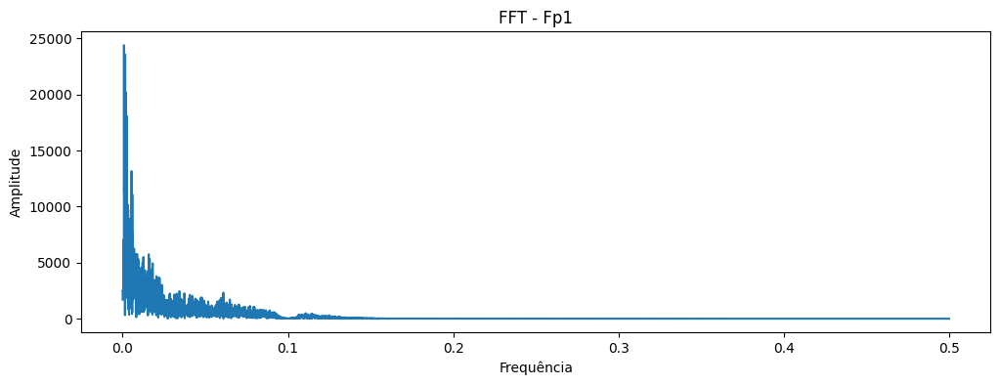

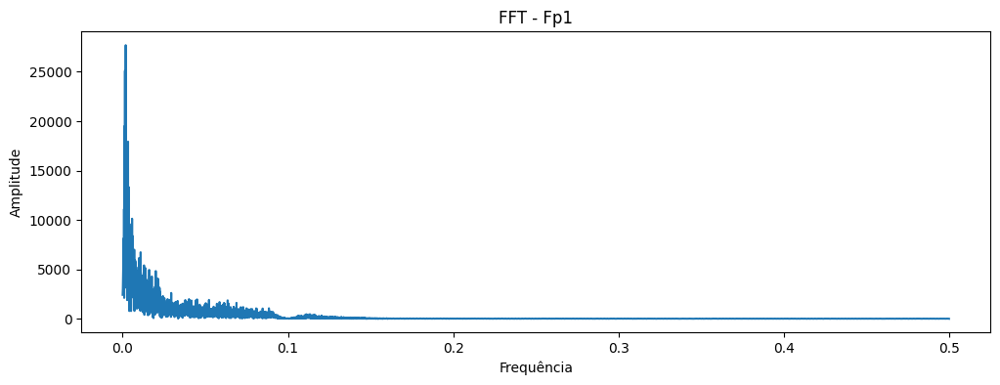

### Arquivo: s10.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,-0.020631,9.214256,-49.306,30.565
Fp2,-0.011889,13.383407,-42.777,43.132
F3,-0.019043,9.378994,-45.231,35.931
F4,-0.049526,8.909158,-32.268,28.417
F7,0.035479,8.359393,-45.286,38.366
F8,-0.034656,8.252976,-27.444,34.174
T3,-0.021666,6.840500,-32.009,28.454
T4,0.004923,7.020046,-38.776,25.905
C3,-0.066118,9.075021,-32.154,31.936
C4,-0.054670,8.712441,-30.007,28.375



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,-0.282716,9.114923,-37.252,33.462
Fp2,-0.062263,13.059562,-44.220,45.689
F3,-0.206703,8.527220,-30.323,27.972
F4,-0.103557,8.646399,-29.950,29.575
F7,-0.173261,7.500714,-27.726,26.636
F8,-0.116669,8.849562,-35.033,31.034
T3,-0.083787,6.275362,-22.674,26.820
T4,-0.242216,6.915261,-22.518,22.798
C3,-0.023596,8.277288,-30.646,32.988
C4,-0.001159,8.028680,-28.706,30.276


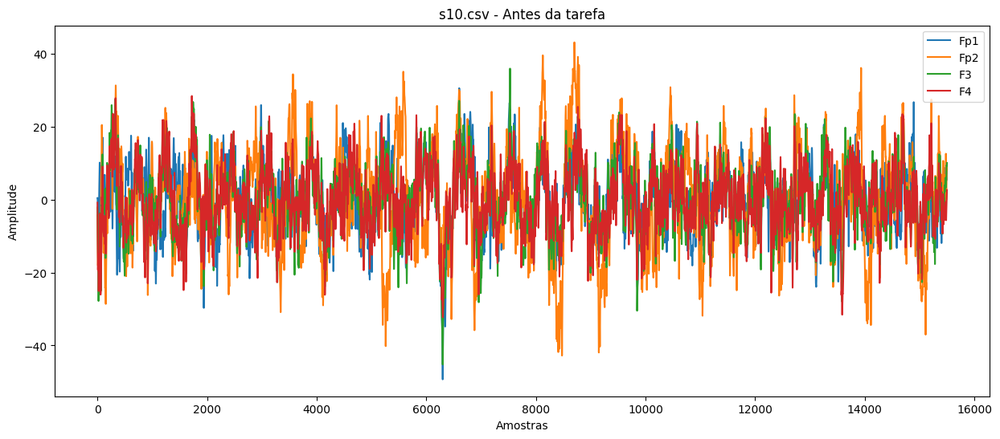

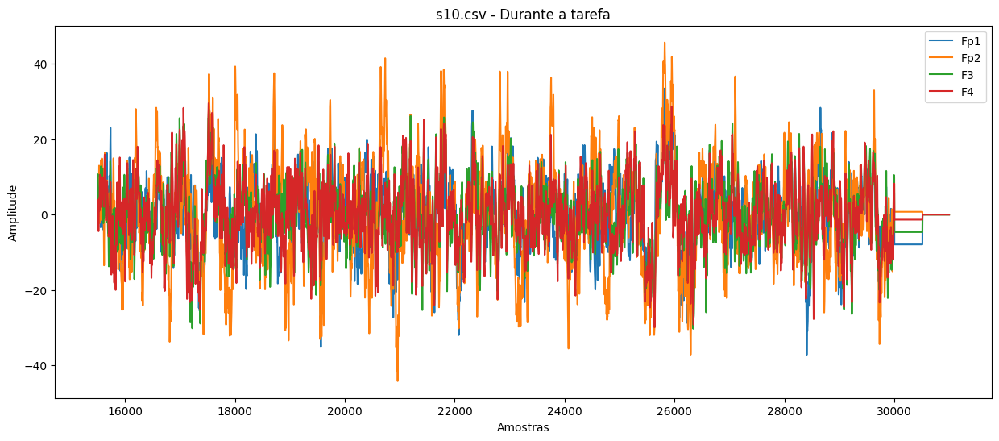

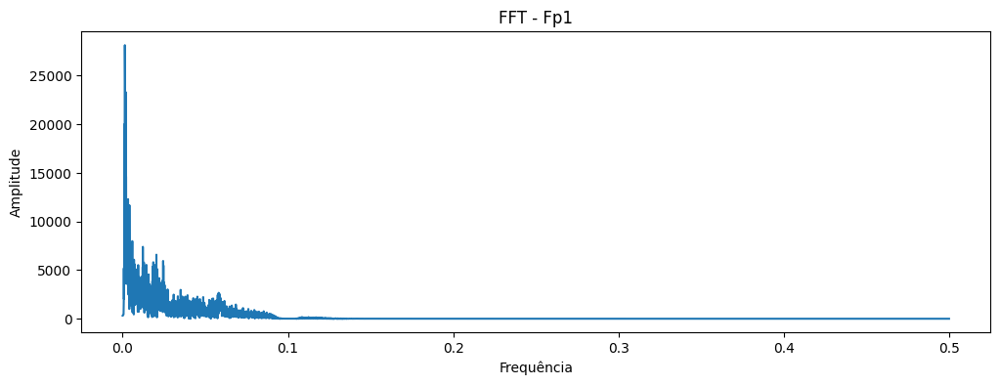

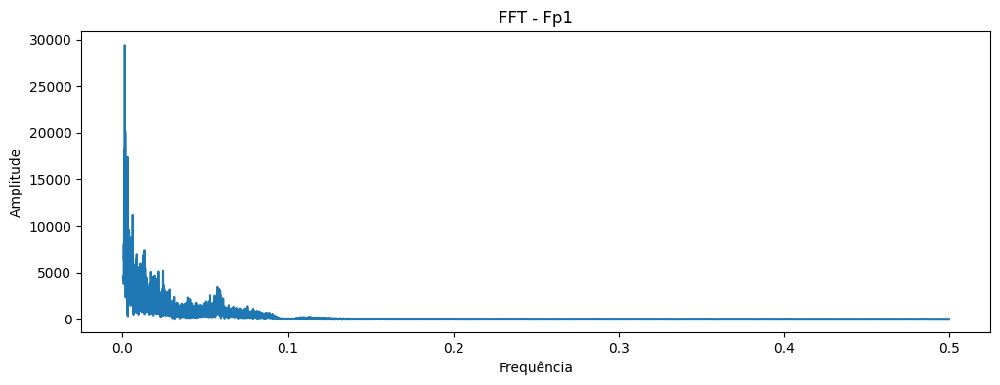

### Arquivo: s11.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,0.052361,5.542511,-22.302,18.066
Fp2,-0.000404,6.143459,-28.329,40.244
F3,0.036639,6.533987,-27.890,30.166
F4,0.016451,6.576088,-21.227,22.493
F7,0.024613,5.147151,-21.095,18.576
F8,0.023272,5.735378,-19.824,20.601
T3,0.000249,5.426478,-20.287,20.999
T4,-0.010205,8.083161,-48.174,53.908
C3,0.065515,5.853897,-23.312,25.104
C4,0.042644,5.727995,-20.670,22.618



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,-0.162476,8.291124,-47.124,37.003
Fp2,0.207533,6.929422,-27.840,31.610
F3,0.043305,6.743706,-27.510,27.973
F4,0.028325,6.154917,-21.379,22.038
F7,0.204558,5.918816,-19.788,31.863
F8,0.032010,6.777470,-24.416,24.875
T3,0.028127,5.519164,-22.087,25.535
T4,0.103313,5.493824,-20.159,27.751
C3,-0.001048,6.448385,-26.773,29.477
C4,0.077387,6.157154,-24.979,31.867


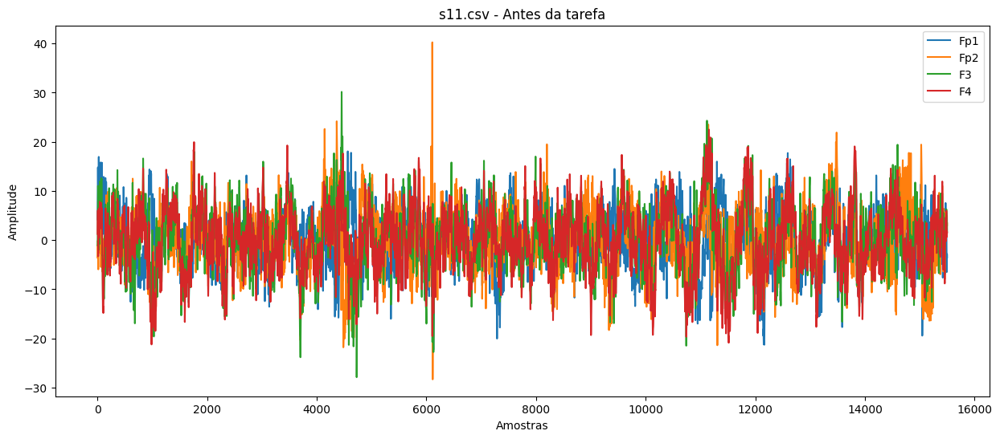

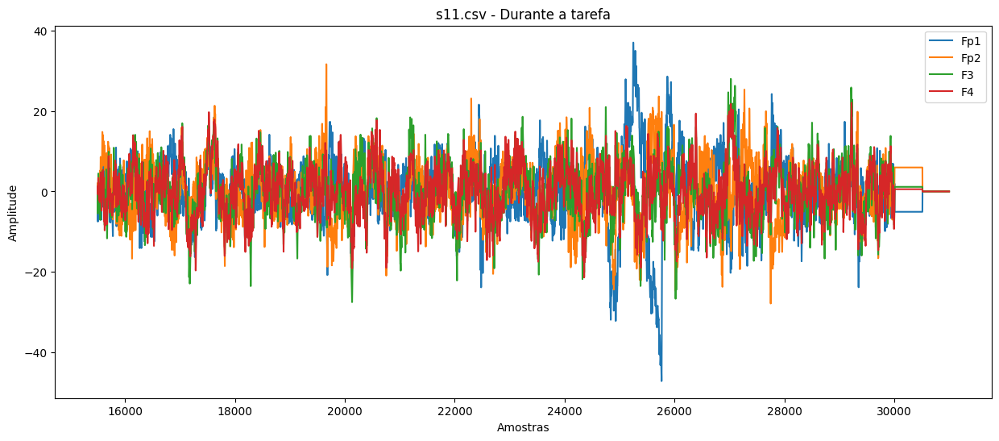

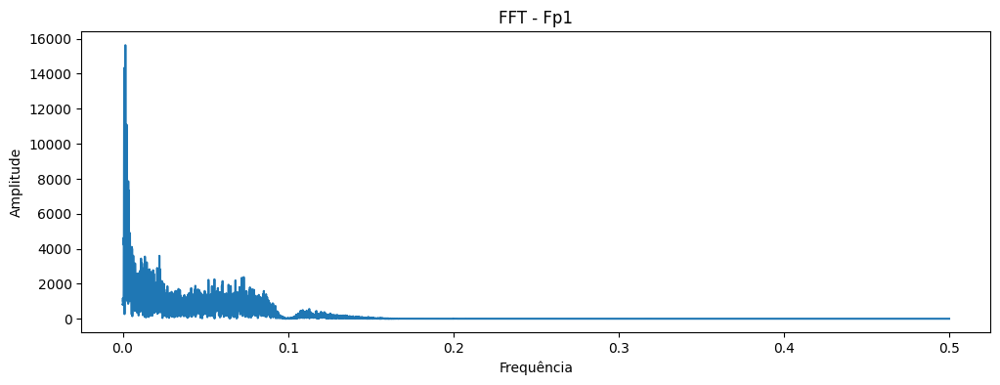

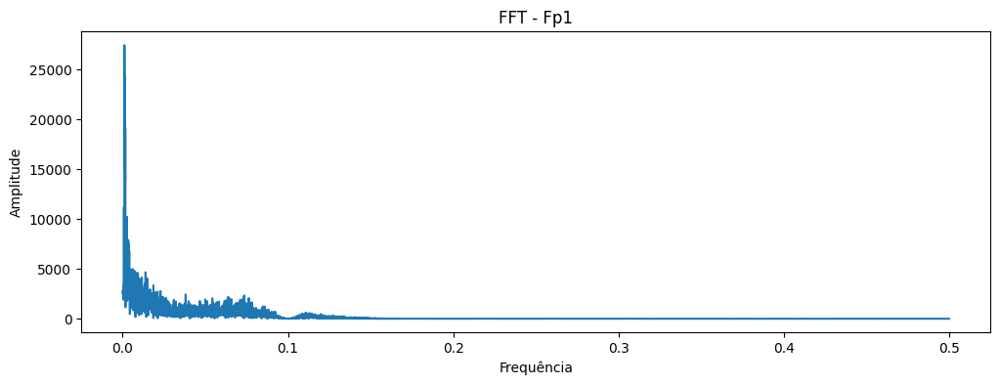

### Arquivo: s12.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,0.065922,8.826140,-29.559,33.477
Fp2,-0.017106,8.786480,-27.337,30.797
F3,0.041568,8.944161,-32.314,41.304
F4,0.072300,8.803989,-35.674,33.475
F7,0.011987,7.037386,-23.998,26.075
F8,0.053644,9.983315,-31.118,35.208
T3,0.080538,8.104952,-27.956,30.420
T4,-0.043801,15.032937,-53.722,51.540
C3,0.072292,10.117695,-34.840,46.529
C4,0.069957,12.644058,-46.451,47.687



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,0.040441,8.250745,-26.274,29.674
Fp2,-0.007569,8.120926,-31.924,28.514
F3,0.173707,8.957739,-31.632,36.514
F4,-0.015195,8.777864,-29.643,33.806
F7,0.046806,6.425459,-22.347,21.797
F8,0.040316,9.776349,-33.247,36.786
T3,0.038740,7.823966,-29.186,32.521
T4,-0.029910,14.249871,-54.297,53.306
C3,0.231223,9.610173,-33.759,48.407
C4,0.035809,11.721669,-41.966,51.967


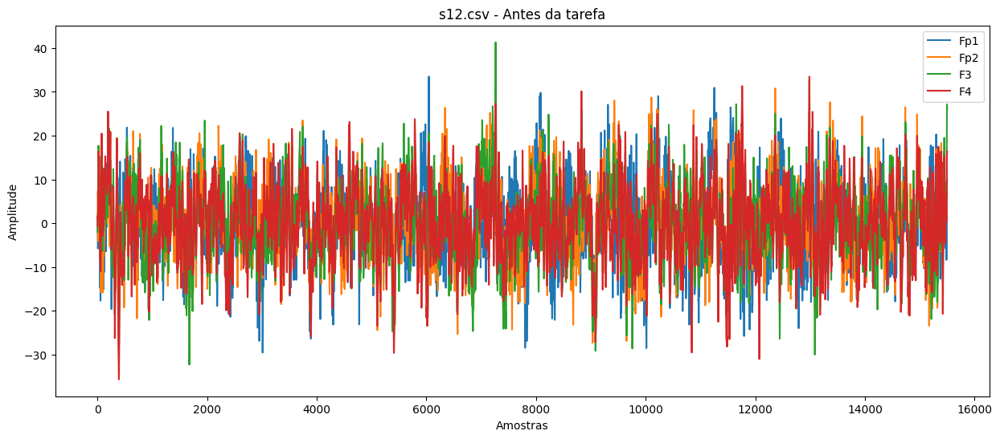

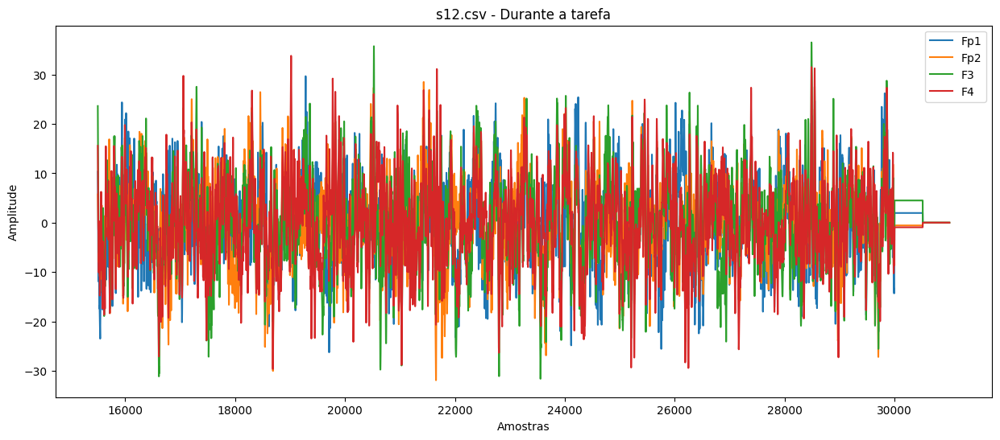

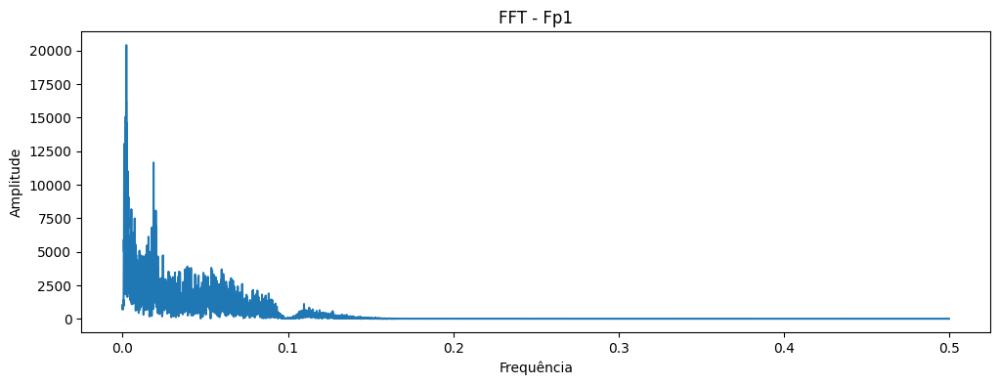

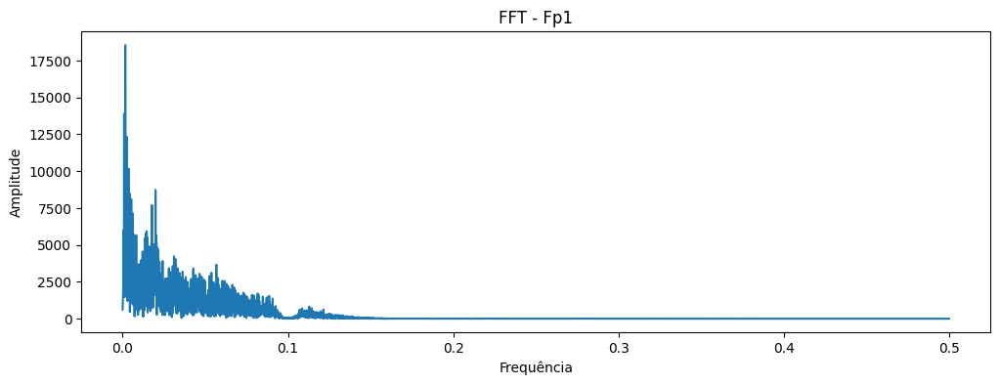

### Arquivo: s13.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,0.107168,14.970211,-77.482,47.799
Fp2,0.061796,11.306413,-58.592,30.356
F3,0.087847,10.184967,-40.727,32.540
F4,0.069661,10.357191,-42.058,30.090
F7,0.024312,8.985517,-30.121,29.137
F8,-0.000098,11.527513,-53.478,34.370
T3,0.003046,8.077933,-29.728,26.439
T4,-0.010527,10.241870,-33.594,35.669
C3,0.045696,8.555881,-28.419,30.655
C4,0.035591,9.023651,-31.948,29.630



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,-0.546527,14.391045,-59.995,43.911
Fp2,-0.588415,10.367674,-39.327,31.041
F3,-0.312129,10.630474,-45.540,28.675
F4,-0.328304,9.288394,-43.394,28.872
F7,-0.047956,9.495420,-36.097,33.258
F8,-0.340363,10.732130,-44.644,29.465
T3,-0.052488,7.488069,-32.682,27.808
T4,-0.015878,10.414771,-35.313,32.783
C3,-0.123585,8.320478,-40.863,33.386
C4,-0.087722,8.427966,-29.702,28.129


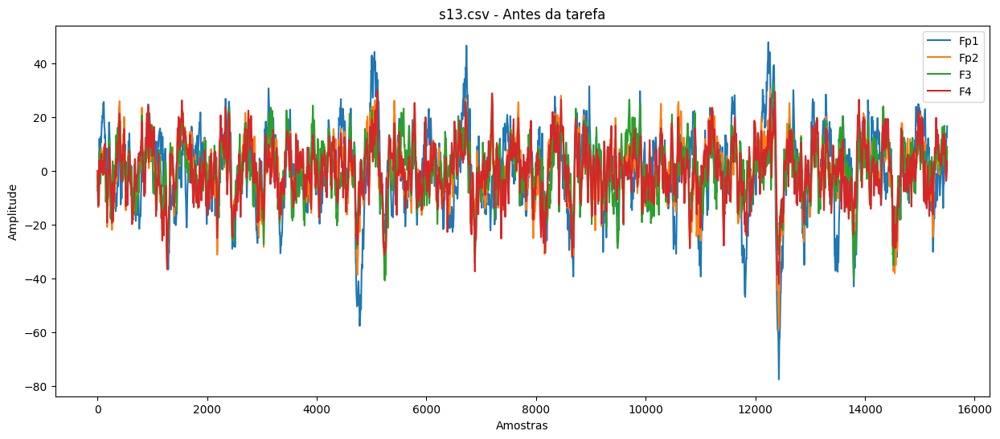

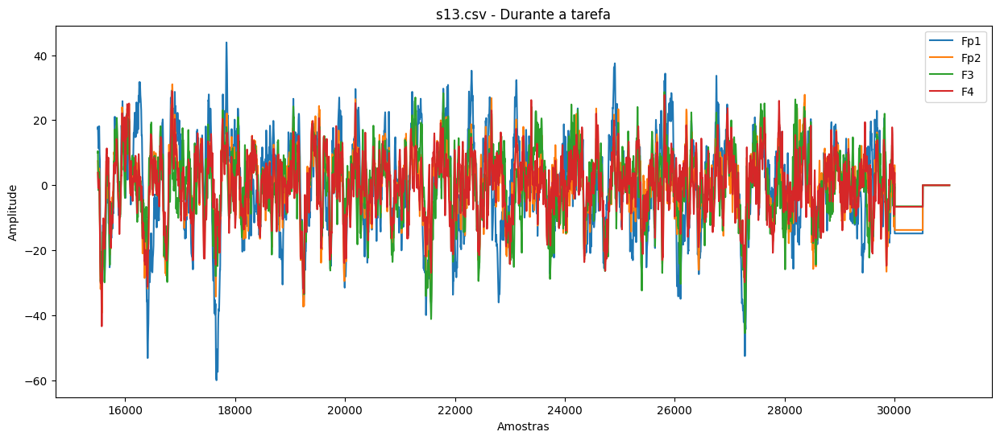

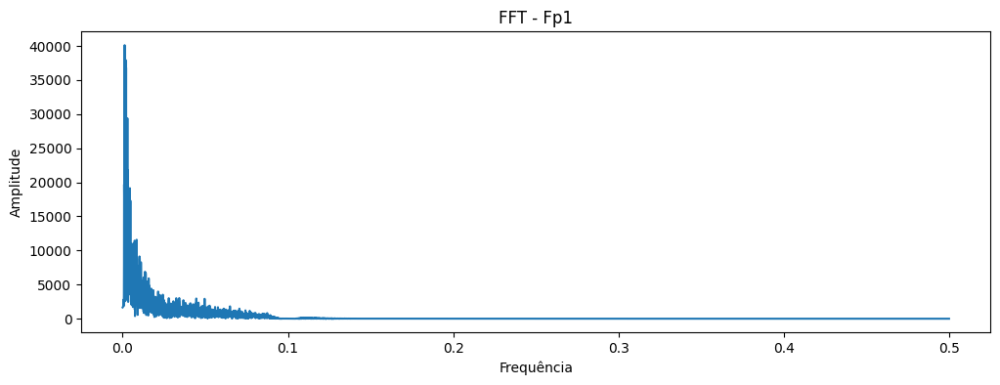

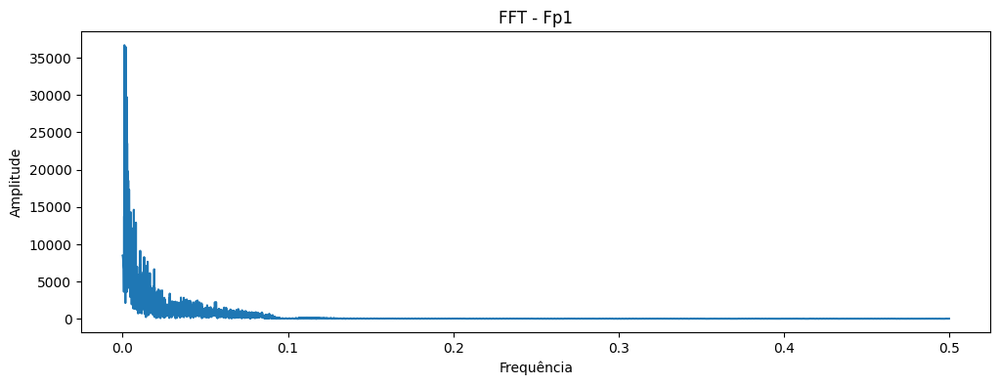

### Arquivo: s14.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,0.195432,20.178956,-78.724,78.388
Fp2,-0.066613,25.914967,-111.100,106.870
F3,-0.052623,13.966822,-53.507,45.631
F4,0.011281,14.474471,-58.630,45.090
F7,0.082196,31.209728,-223.370,154.240
F8,0.065216,16.956661,-90.491,59.073
T3,0.010876,9.951888,-41.655,41.682
T4,-0.034555,18.070728,-82.010,60.034
C3,-0.012445,11.802396,-47.234,37.862
C4,0.021742,11.982415,-55.765,43.734



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,-0.522130,21.616766,-86.597,66.092
Fp2,-0.537199,26.409262,-126.970,103.170
F3,-0.337823,13.206225,-61.974,47.515
F4,-0.351637,14.021070,-57.187,49.172
F7,-1.291901,14.029926,-59.073,40.391
F8,-0.576144,15.218424,-63.737,50.389
T3,-0.060835,9.152244,-41.743,27.464
T4,-0.504510,15.865799,-57.609,48.603
C3,-0.298805,11.877748,-53.371,41.324
C4,-0.371687,12.749990,-54.260,42.506


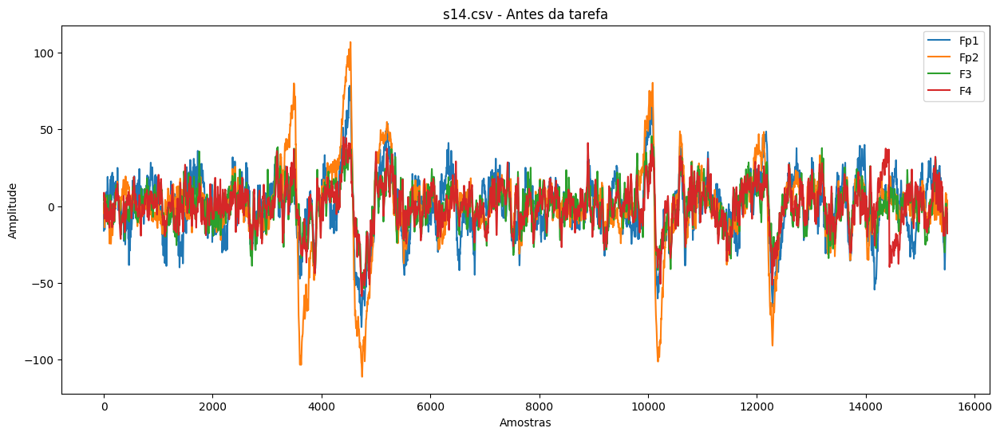

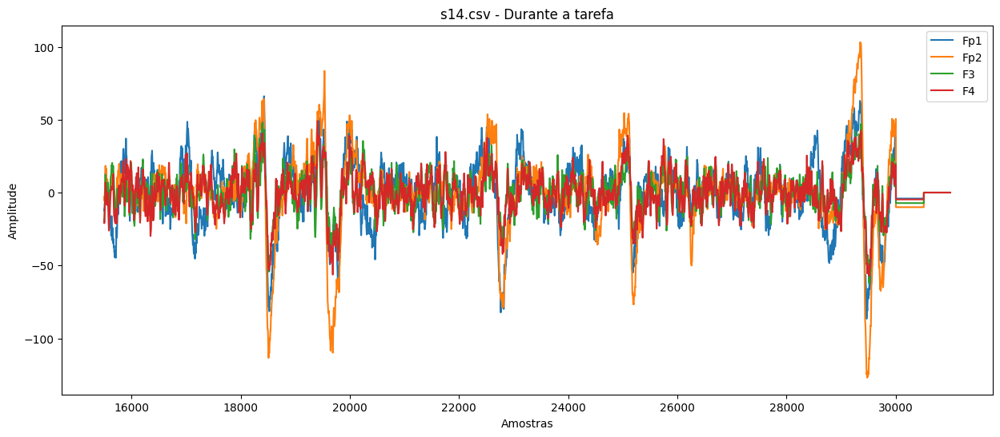

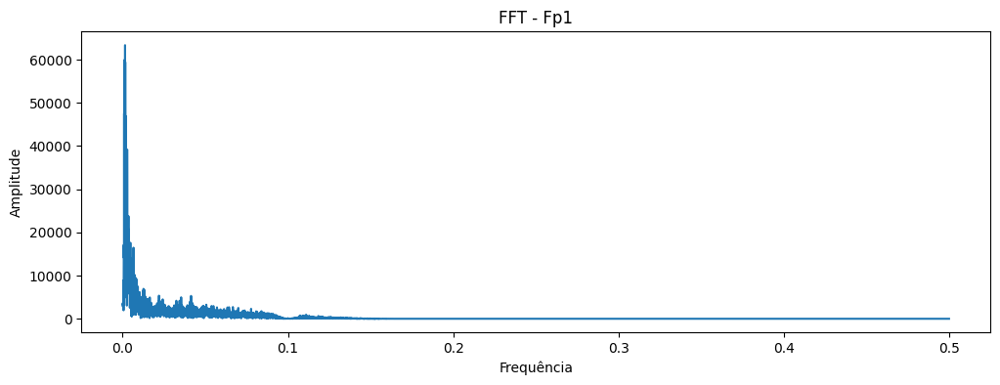

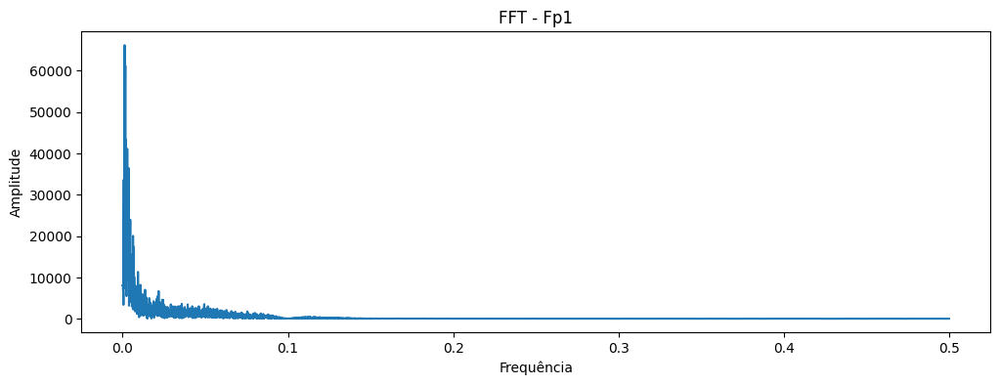

### Arquivo: s15.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,0.000087,8.405508,-31.702,35.580
Fp2,-0.272994,20.839166,-83.820,69.467
F3,-0.059641,11.543050,-37.798,52.834
F4,-0.056625,11.953328,-37.941,43.980
F7,0.038088,19.591012,-97.271,67.767
F8,0.050402,9.603306,-35.936,38.429
T3,-0.051980,8.557573,-38.736,42.547
T4,0.039527,11.082548,-31.982,77.587
C3,-0.086475,12.471280,-41.080,48.475
C4,-0.045441,10.060638,-34.273,41.897



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,-0.004568,8.207098,-35.251,29.360
Fp2,0.042455,22.592189,-72.845,73.011
F3,-0.069529,12.358654,-54.087,40.467
F4,-0.033161,11.954286,-46.767,41.755
F7,-0.667037,17.695402,-62.815,55.036
F8,-0.006990,9.389502,-32.973,32.000
T3,0.048494,7.984469,-32.749,33.746
T4,0.577428,10.230784,-41.183,64.679
C3,0.002136,11.112218,-42.839,48.030
C4,0.102576,10.547977,-34.072,41.312


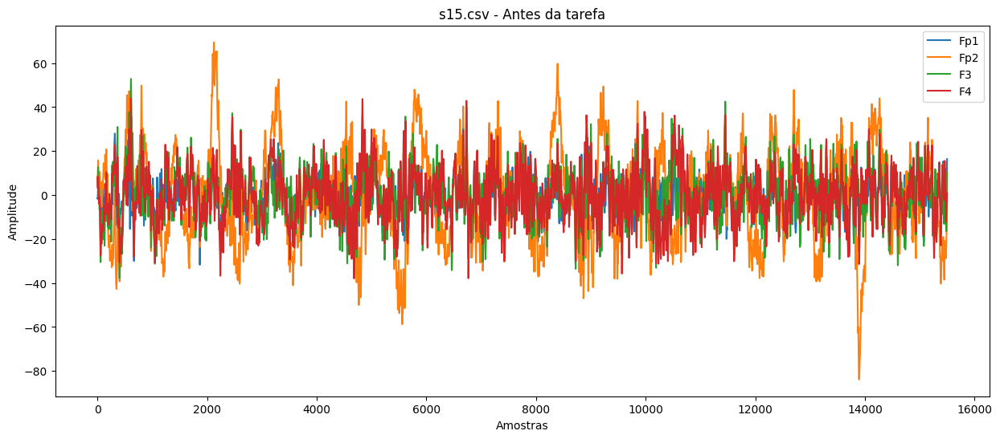

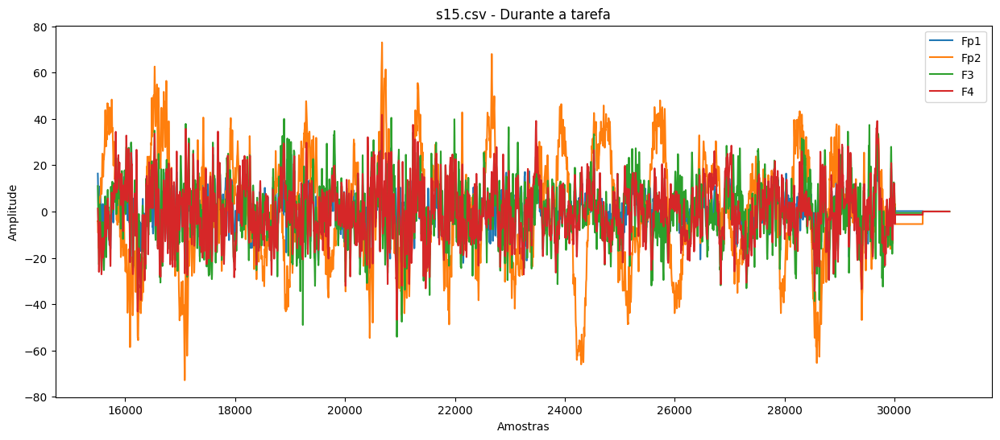

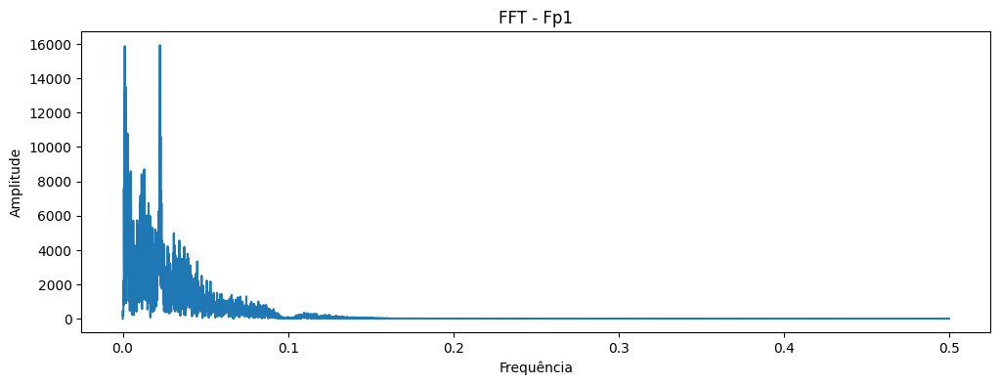

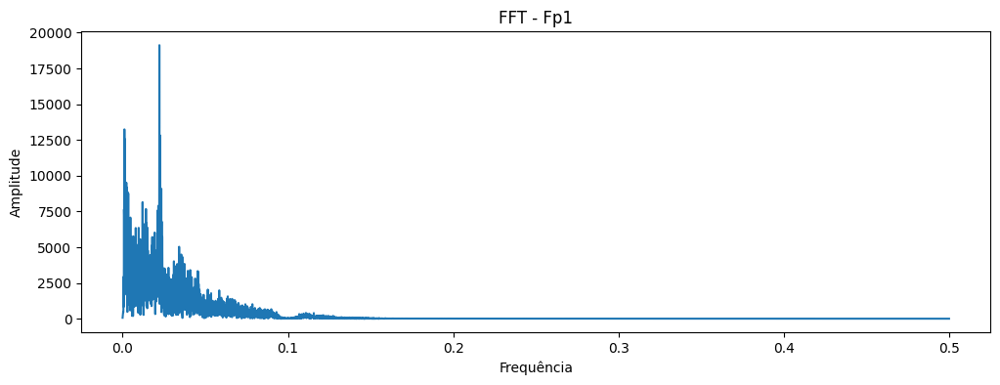

### Arquivo: s16.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,0.016574,5.885958,-23.324,30.551
Fp2,-0.027308,9.320000,-40.050,37.169
F3,-0.019024,7.768662,-30.695,30.273
F4,0.035640,8.532650,-44.029,34.192
F7,-0.025070,6.062630,-30.032,20.844
F8,0.052855,9.054342,-45.326,30.977
T3,-0.075050,8.146197,-42.682,27.537
T4,-0.001322,8.199359,-48.635,38.829
C3,-0.027060,7.731997,-31.418,29.056
C4,0.008905,8.290872,-37.132,31.604



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,0.019284,5.859715,-28.254,30.335
Fp2,0.026549,8.712554,-32.212,41.783
F3,-0.018717,7.350219,-26.599,31.865
F4,-0.211365,7.874656,-26.715,28.326
F7,-0.088666,5.941390,-32.202,27.583
F8,-0.328808,8.285302,-42.199,30.540
T3,-0.176751,7.799572,-34.103,29.838
T4,-0.198709,7.839856,-32.367,28.100
C3,0.100989,7.814333,-25.508,39.099
C4,-0.134782,7.725367,-29.701,31.943


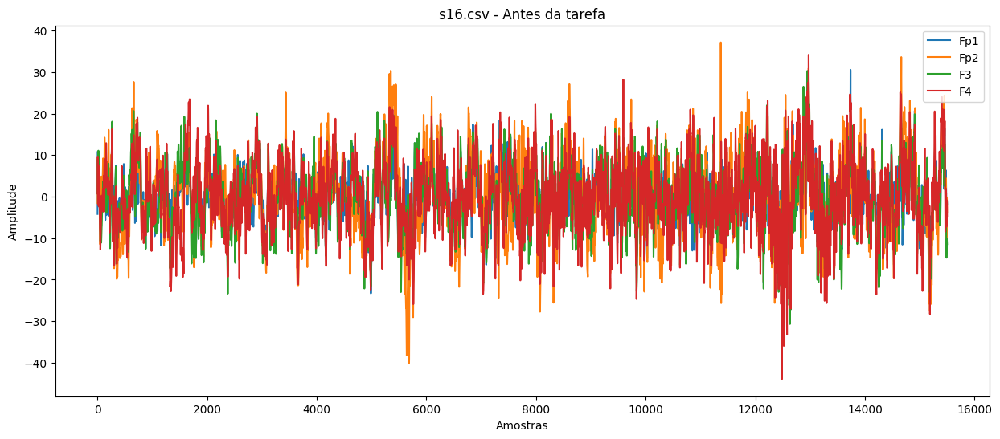

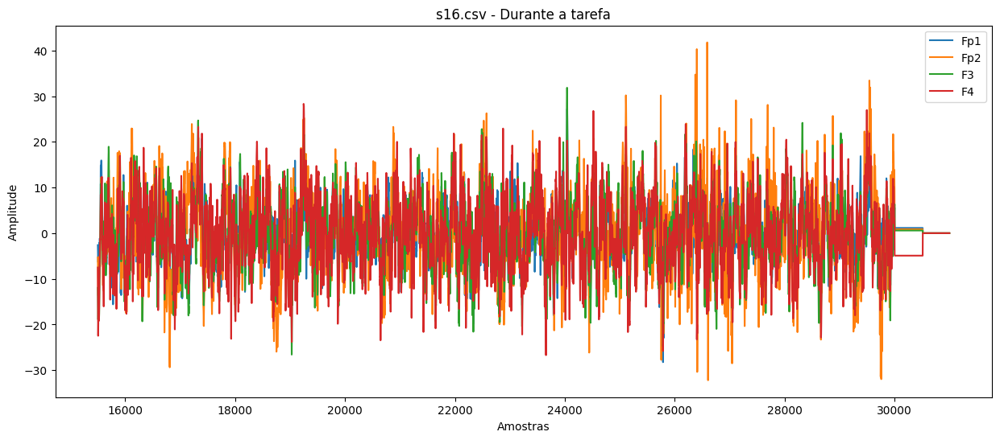

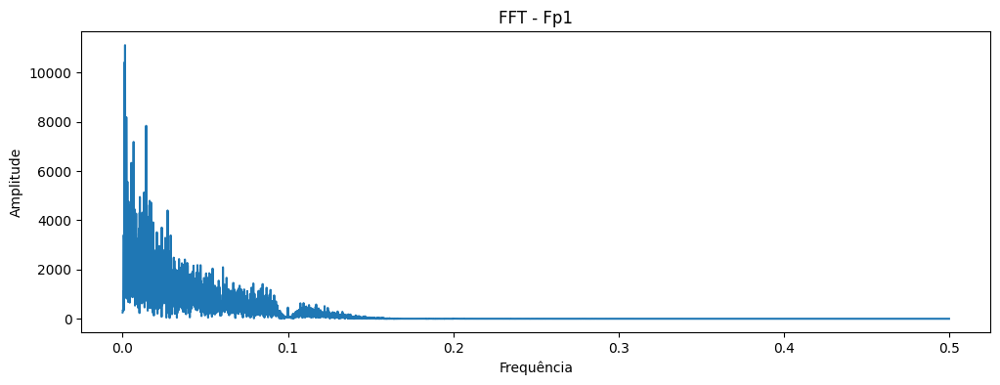

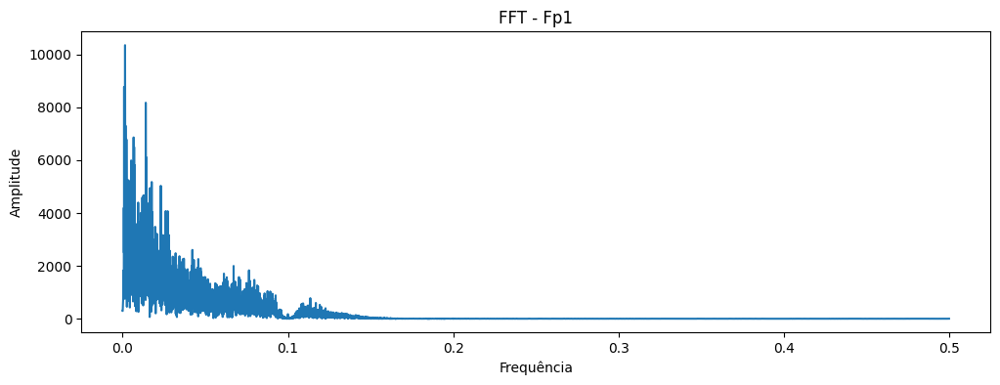

### Arquivo: s17.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,-0.031043,12.766916,-56.874,36.970
Fp2,-0.026077,15.543567,-70.318,45.268
F3,-0.037542,10.762321,-43.870,30.813
F4,-0.036318,11.003779,-43.586,29.442
F7,-0.047362,9.794797,-43.864,29.190
F8,-0.041567,11.502341,-49.142,51.382
T3,0.008783,7.296096,-25.868,21.349
T4,-0.005771,9.575550,-31.807,28.528
C3,0.010604,9.447377,-36.439,27.983
C4,-0.010681,9.196683,-32.640,27.499



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,-0.463451,13.400420,-62.739,40.619
Fp2,-0.508898,16.559360,-72.152,48.282
F3,-0.347670,11.235831,-47.897,31.929
F4,-0.281296,11.795186,-45.814,36.758
F7,-0.263160,10.054557,-42.699,31.138
F8,-0.231079,12.922846,-58.724,49.620
T3,-0.008827,7.638873,-28.378,30.546
T4,0.079036,9.591776,-33.615,38.053
C3,-0.087764,9.284946,-31.741,35.323
C4,-0.056788,9.282182,-30.454,32.192


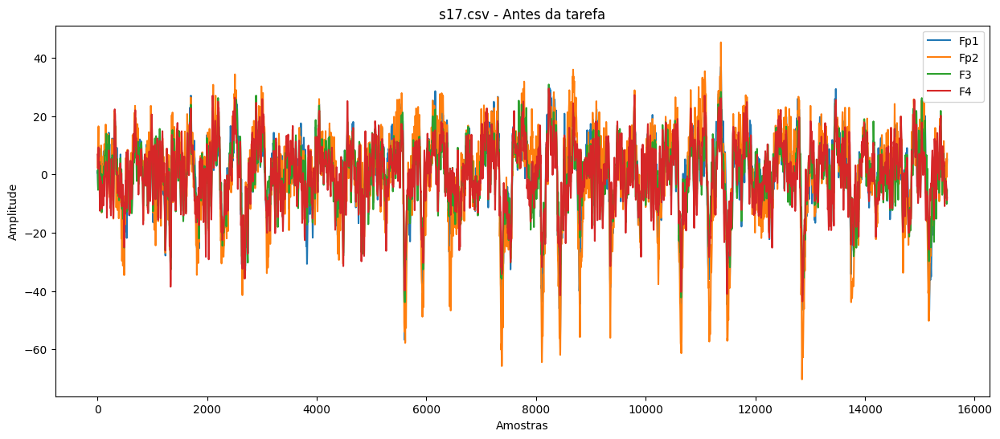

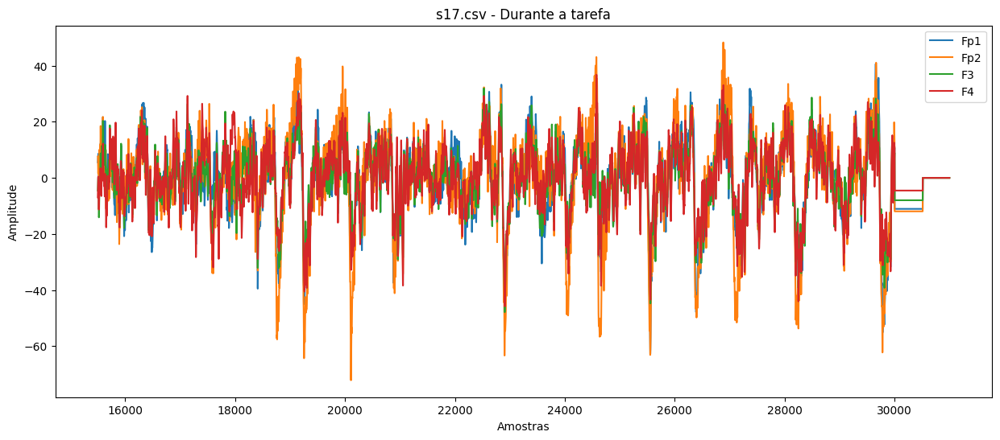

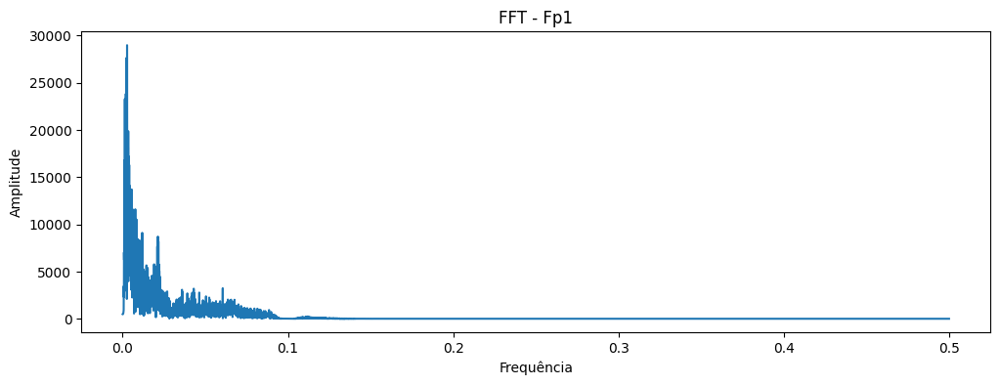

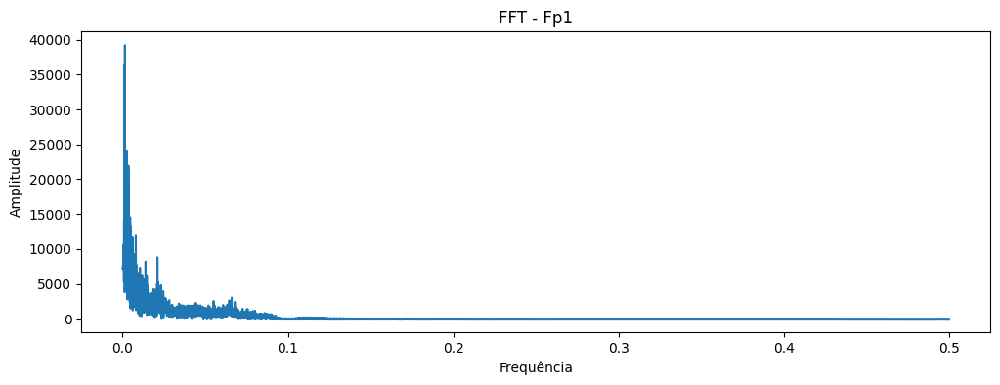

### Arquivo: s18.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,0.005864,5.058995,-26.508,22.655
Fp2,-0.018787,4.652438,-19.616,19.011
F3,-0.066636,6.379740,-22.349,24.748
F4,-0.018935,7.738211,-25.983,27.652
F7,-0.024730,4.794866,-15.043,17.678
F8,-0.016900,6.139624,-25.274,19.955
T3,-0.051228,5.056659,-19.349,17.692
T4,0.006965,6.523963,-28.358,22.561
C3,-0.029944,7.822887,-31.264,27.763
C4,-0.036359,7.172721,-28.958,28.118



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,-0.065184,4.502268,-17.912,17.980
Fp2,-0.012620,4.524713,-17.562,16.918
F3,0.010682,5.981738,-24.194,21.230
F4,-0.166974,7.638355,-35.289,28.312
F7,0.006620,4.506058,-32.877,32.302
F8,0.016044,6.279484,-23.621,26.786
T3,-0.020154,4.974937,-18.564,17.014
T4,-0.027671,6.642141,-23.278,27.039
C3,-0.056913,7.688295,-29.193,28.954
C4,-0.045946,6.356018,-23.772,22.283


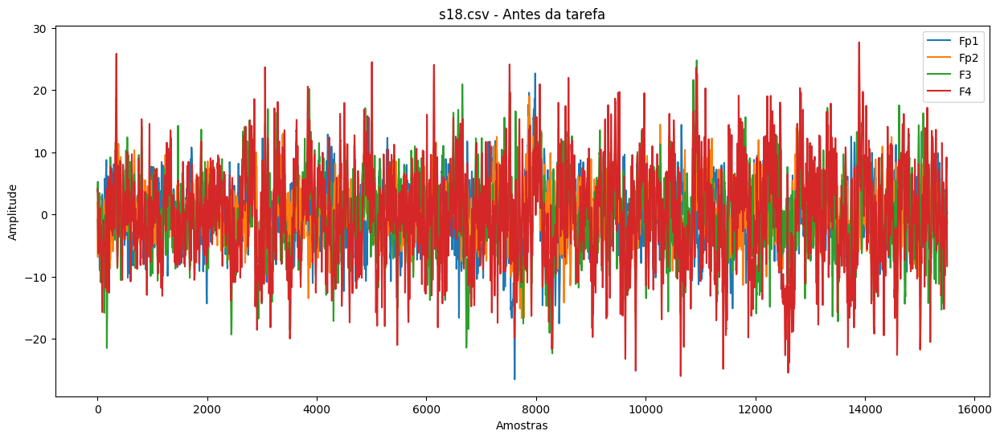

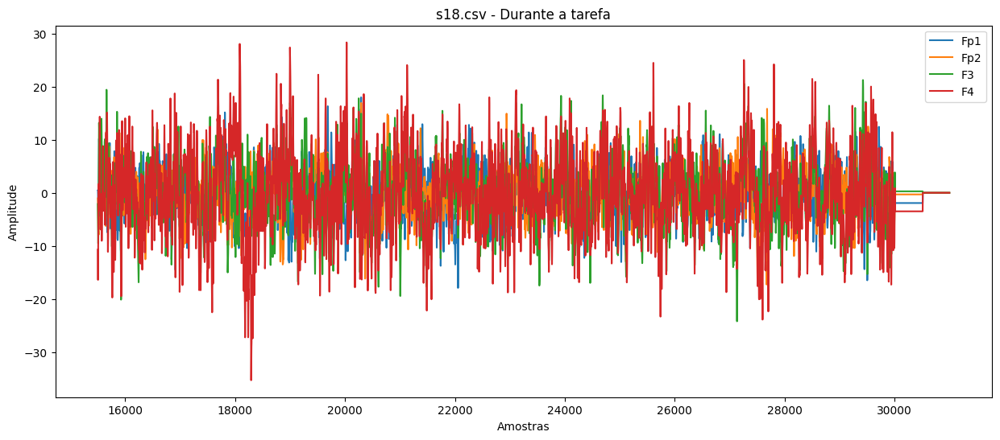

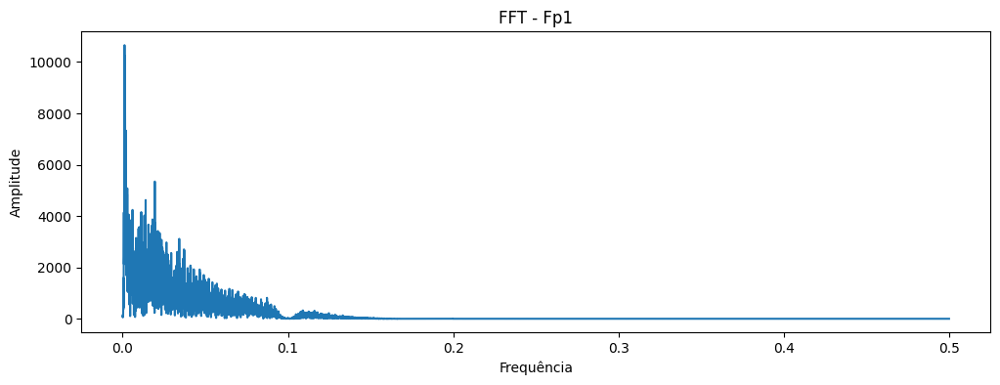

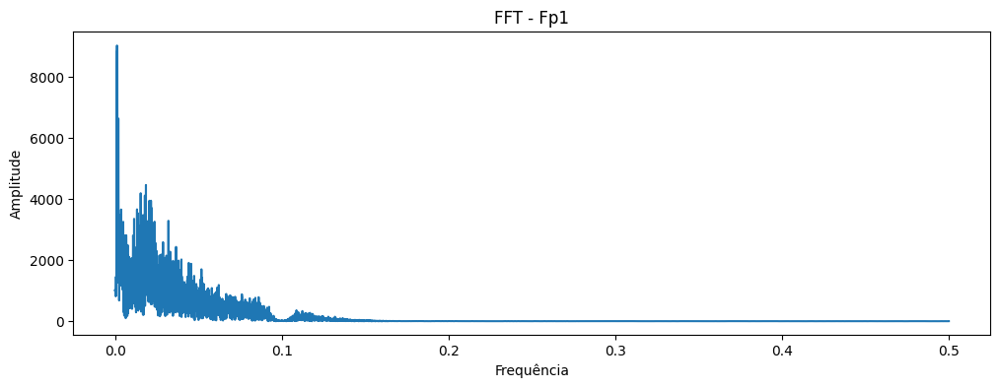

### Arquivo: s19.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,-0.024832,5.221879,-19.161,19.965
Fp2,-0.052095,5.676954,-24.105,23.026
F3,-0.038411,7.206542,-24.971,31.062
F4,-0.081362,7.606889,-26.186,27.504
F7,0.068613,7.741082,-30.036,25.326
F8,-0.113468,10.014526,-44.113,33.823
T3,-0.079107,6.387807,-21.305,22.096
T4,0.115813,10.126721,-33.164,36.861
C3,0.001073,8.046379,-25.953,35.660
C4,-0.005660,7.900716,-29.930,28.778



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,-0.001992,5.371842,-22.838,22.962
Fp2,0.005384,6.084719,-21.320,23.806
F3,-0.066207,8.231009,-44.923,39.395
F4,0.058769,7.592604,-25.394,27.183
F7,-0.223650,8.736814,-44.356,32.531
F8,-0.160996,8.980138,-30.609,32.089
T3,0.042171,6.670912,-24.464,25.599
T4,-0.099579,9.229591,-40.819,33.328
C3,0.200299,7.919633,-24.688,28.215
C4,-0.020353,7.576509,-26.065,28.587


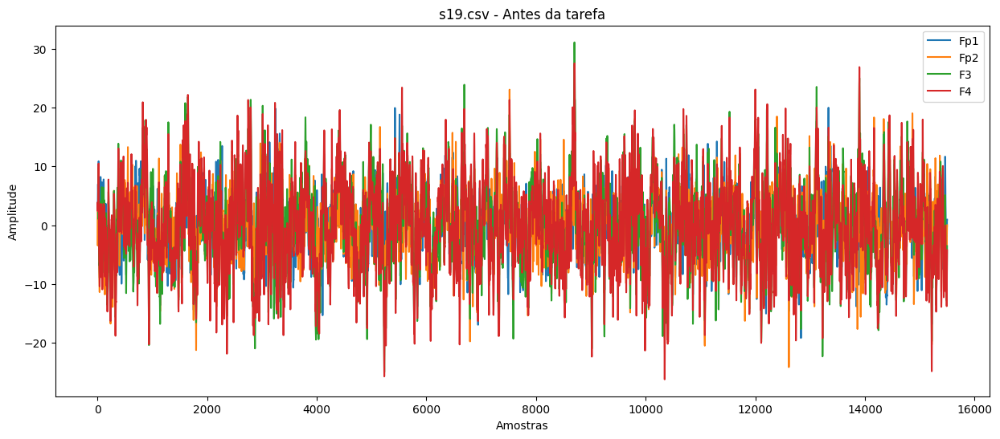

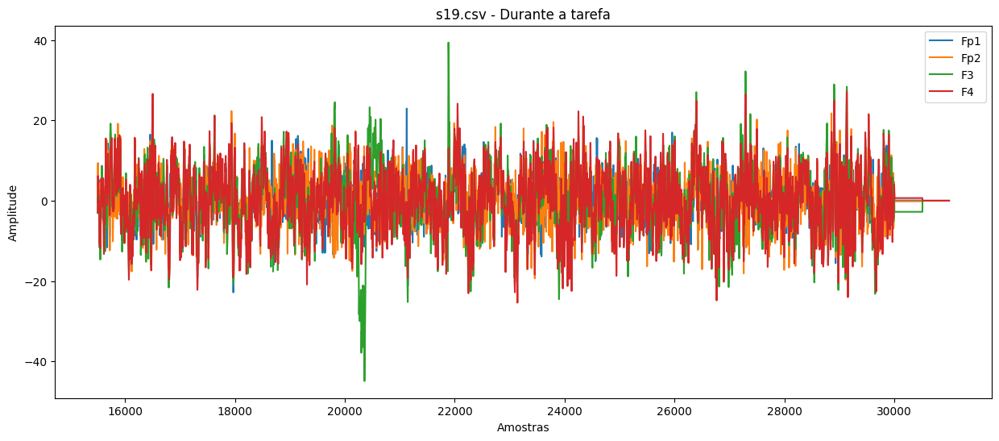

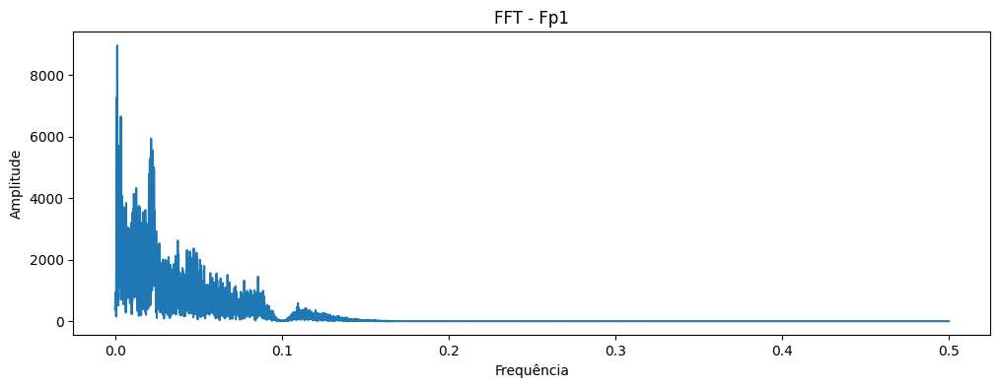

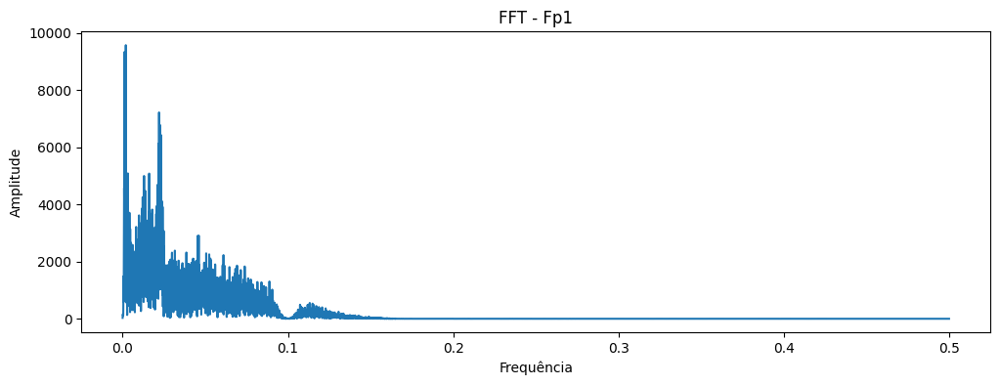

### Arquivo: s20.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,-0.054449,12.084517,-45.285,45.017
Fp2,-0.210804,17.626201,-59.204,54.450
F3,-0.072581,11.570426,-39.305,43.306
F4,-0.027998,12.057678,-43.690,42.935
F7,-0.076883,9.917831,-32.070,38.761
F8,0.033647,11.396088,-42.571,40.404
T3,-0.097419,16.079592,-51.696,59.786
T4,-0.082829,11.955746,-53.536,38.618
C3,-0.020918,10.460824,-39.275,33.179
C4,0.004619,10.544532,-37.932,35.006



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,-0.125877,10.464110,-33.923,43.894
Fp2,0.011949,14.293764,-44.643,40.820
F3,-0.043469,10.138250,-42.712,38.104
F4,0.092753,10.998999,-32.277,42.689
F7,0.110686,8.569906,-32.025,29.151
F8,-0.094750,9.680873,-34.870,33.379
T3,-0.012188,15.377243,-44.025,55.831
T4,-0.250734,10.530444,-43.681,32.615
C3,-0.109416,10.989915,-39.020,37.300
C4,-0.119165,9.878598,-38.028,31.954


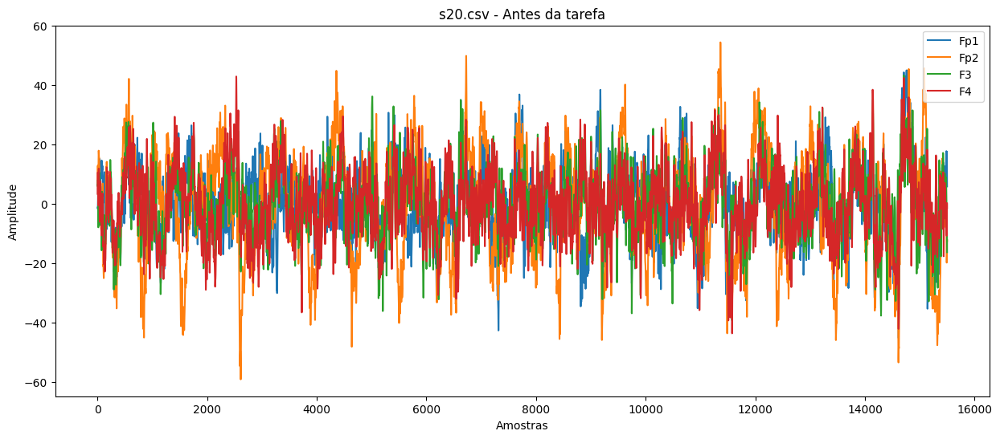

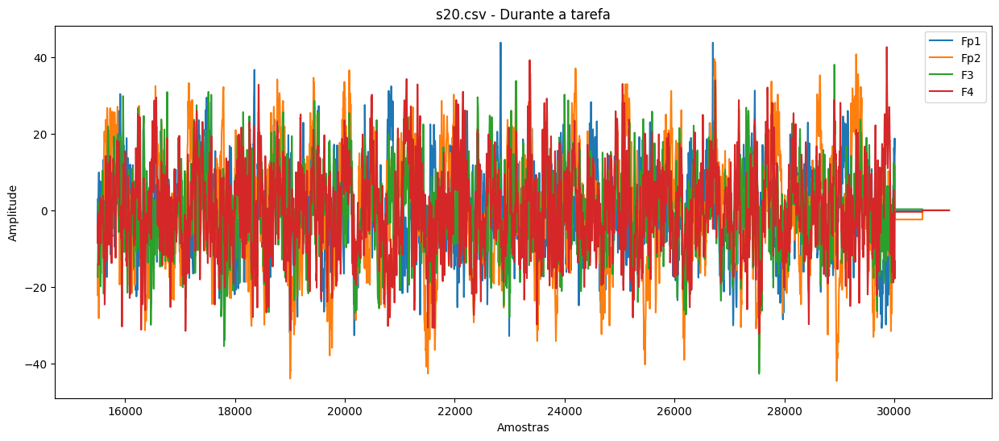

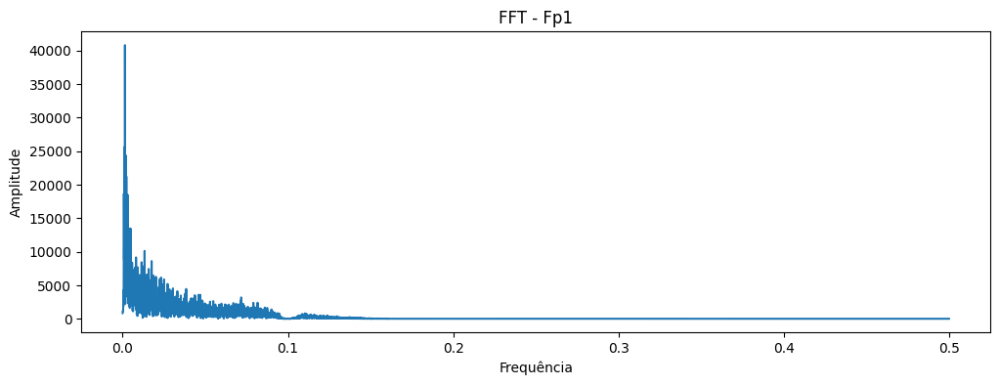

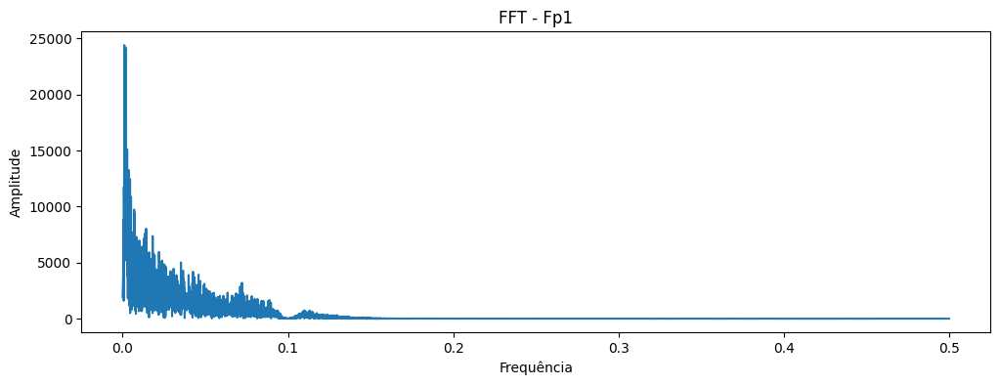

### Arquivo: s21.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,0.104249,9.752413,-48.455,32.642
Fp2,0.069736,13.009276,-56.996,39.022
F3,0.038959,7.237140,-25.581,24.179
F4,0.042167,7.588249,-27.392,25.902
F7,0.048579,8.211673,-37.426,26.789
F8,0.030192,8.486397,-32.569,29.296
T3,0.036735,5.664343,-23.368,20.274
T4,0.021827,7.689687,-24.846,26.170
C3,0.048864,7.316918,-27.382,30.023
C4,0.081684,8.043520,-27.854,32.216



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,-0.463457,10.732477,-55.127,30.534
Fp2,-0.501561,13.834960,-68.755,45.888
F3,-0.106784,7.712532,-32.352,29.238
F4,0.032917,8.037737,-30.765,33.203
F7,-0.188093,8.288066,-36.101,27.084
F8,-0.039647,9.369354,-35.631,34.751
T3,-0.064312,5.376084,-20.240,21.243
T4,-0.016702,7.412965,-27.128,27.346
C3,-0.078235,7.387636,-31.721,27.884
C4,0.008980,8.179029,-31.001,36.512


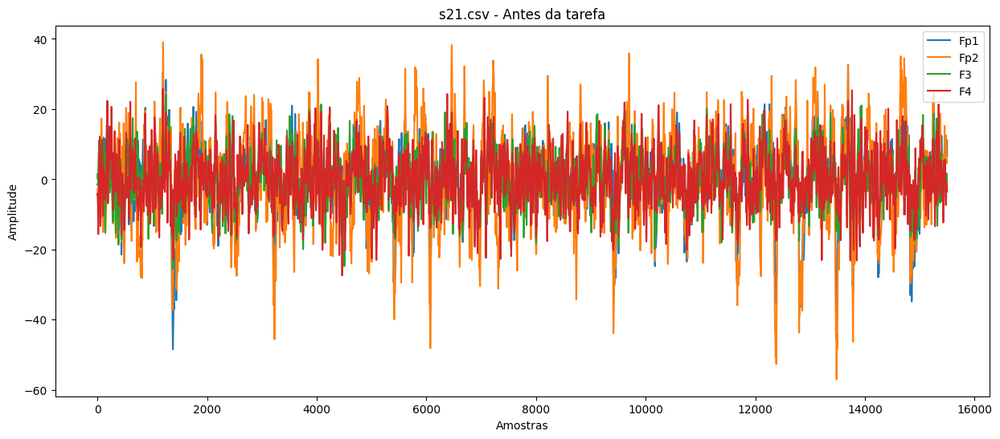

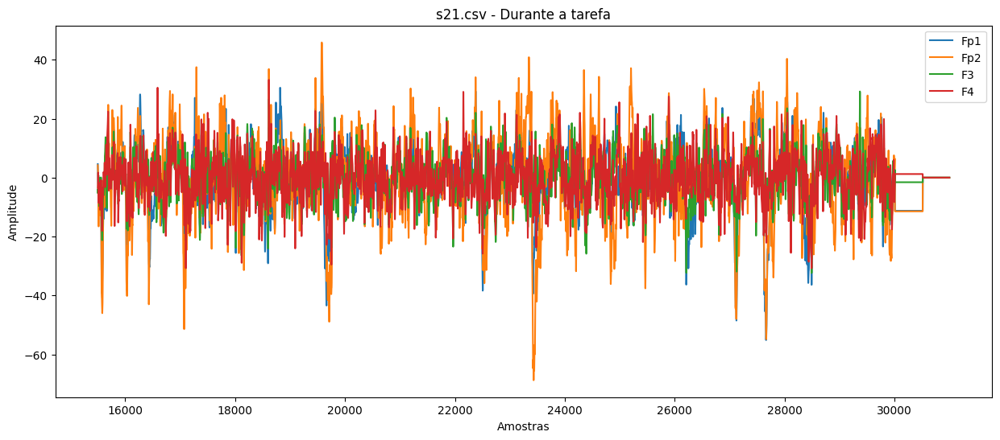

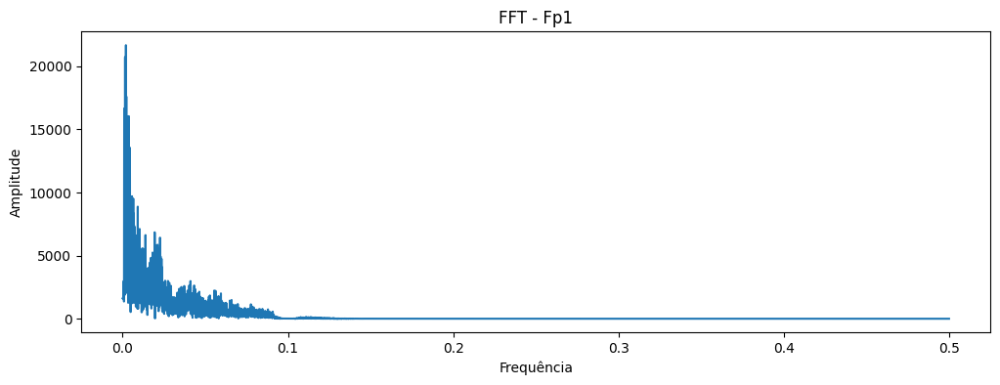

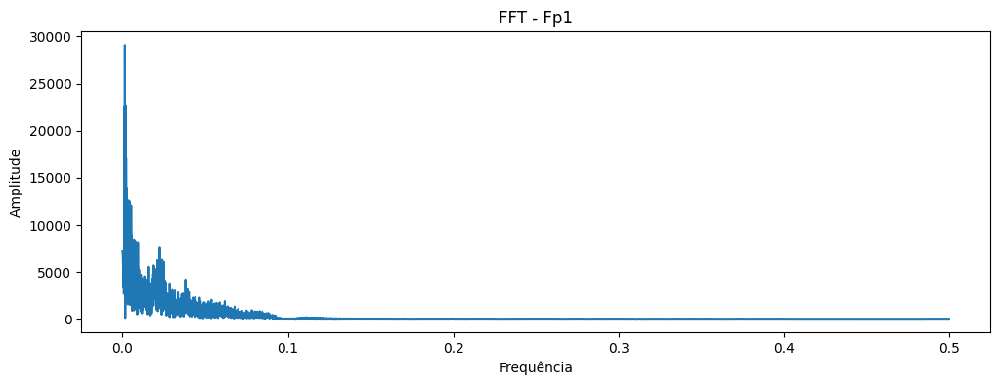

### Arquivo: s22.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,0.065053,12.794072,-54.658,44.911
Fp2,-0.027650,13.288557,-75.954,79.961
F3,-0.009871,10.980181,-40.660,42.199
F4,0.030165,13.453457,-48.210,43.464
F7,0.026790,10.346558,-46.355,37.937
F8,-0.009831,11.078822,-63.606,61.997
T3,0.019201,7.729526,-31.701,26.891
T4,0.047387,13.235010,-49.685,45.922
C3,-0.042130,10.027610,-38.676,39.559
C4,-0.013905,10.357044,-39.983,43.597



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,-0.720155,18.050463,-107.190,64.992
Fp2,-0.480550,16.231954,-111.800,55.380
F3,-0.156054,11.579672,-52.065,36.545
F4,-0.068745,12.651299,-53.937,45.327
F7,-0.352257,11.937086,-60.726,39.801
F8,0.062587,10.967478,-63.029,35.530
T3,-0.083131,7.975873,-34.462,22.923
T4,-0.017524,11.992857,-47.286,44.761
C3,0.030507,9.425456,-40.846,32.815
C4,0.056204,9.877388,-43.377,42.687


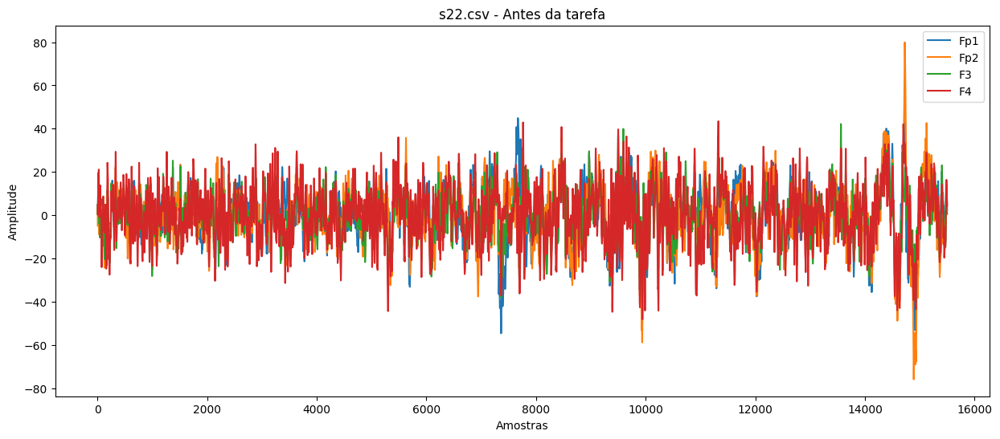

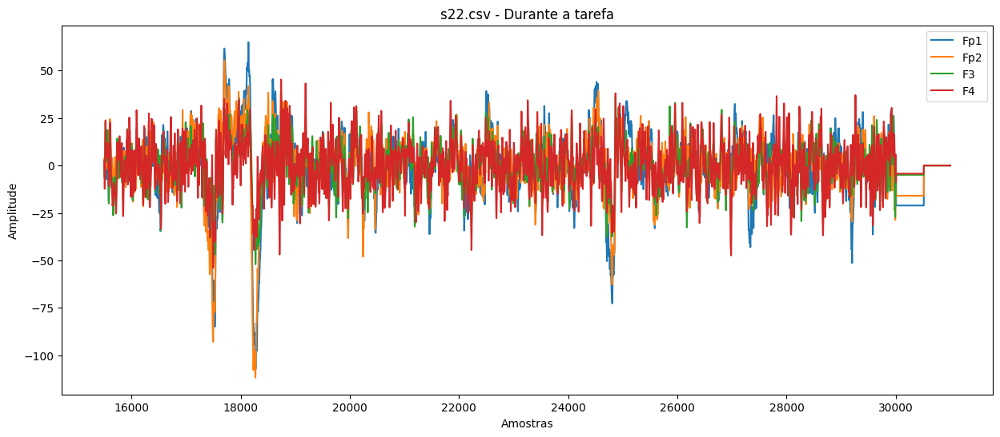

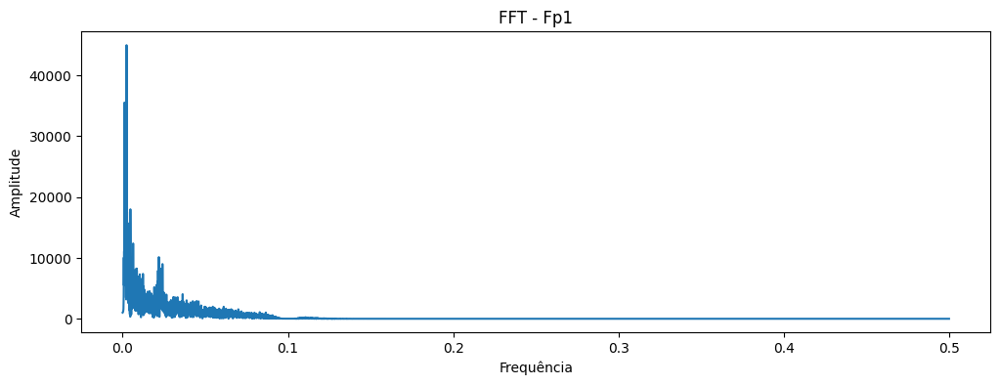

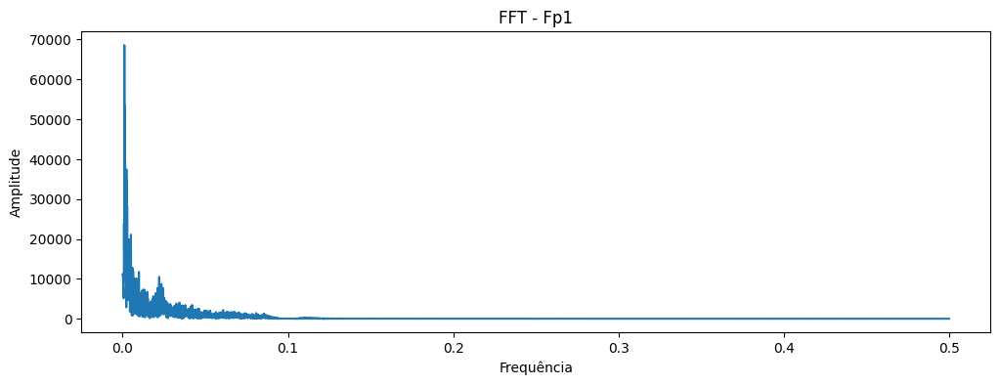

### Arquivo: s23.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,0.007777,12.285534,-49.275,37.915
Fp2,0.028042,12.942431,-52.184,44.740
F3,0.025373,11.281396,-37.480,40.702
F4,0.041262,10.621462,-34.723,42.558
F7,-0.021102,10.604873,-46.391,35.067
F8,0.020955,9.788467,-35.270,28.149
T3,0.010055,9.137524,-33.328,41.958
T4,0.016279,7.992632,-31.556,27.212
C3,-0.030979,10.728099,-38.951,41.299
C4,0.003603,9.263517,-39.247,30.124



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,-0.220983,12.174149,-53.729,35.620
Fp2,-0.183735,14.466692,-61.434,52.436
F3,0.065649,10.096748,-39.507,34.238
F4,0.129145,10.056959,-37.800,36.139
F7,-0.028910,10.657471,-47.867,43.513
F8,-0.142732,10.074625,-40.295,31.406
T3,-0.223188,11.951545,-75.604,59.461
T4,0.027643,8.063238,-29.336,31.247
C3,0.076100,10.229559,-34.092,40.083
C4,0.104576,9.841173,-34.958,42.087


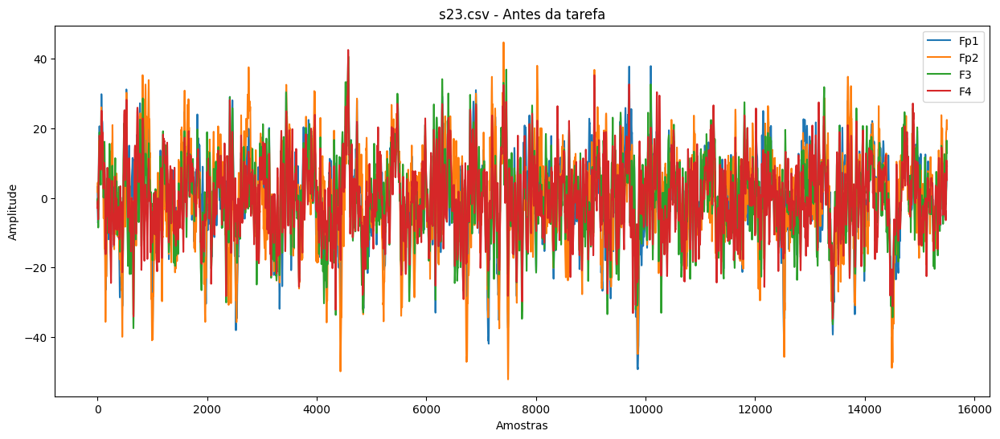

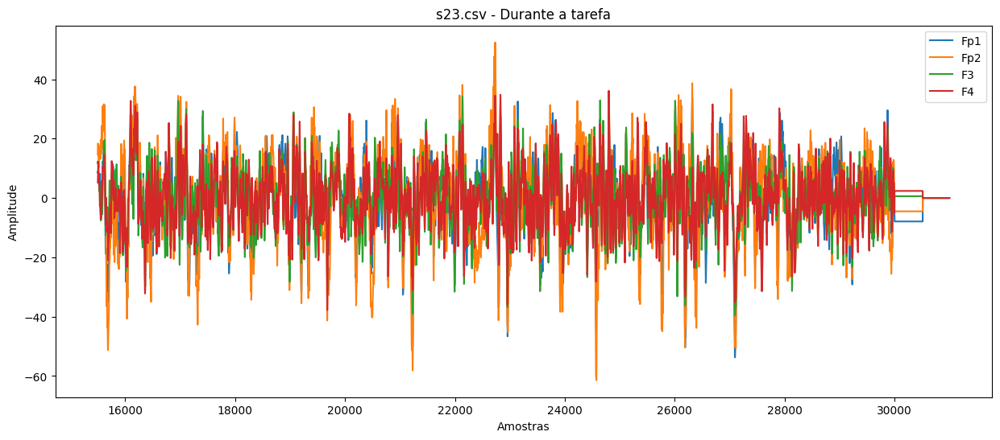

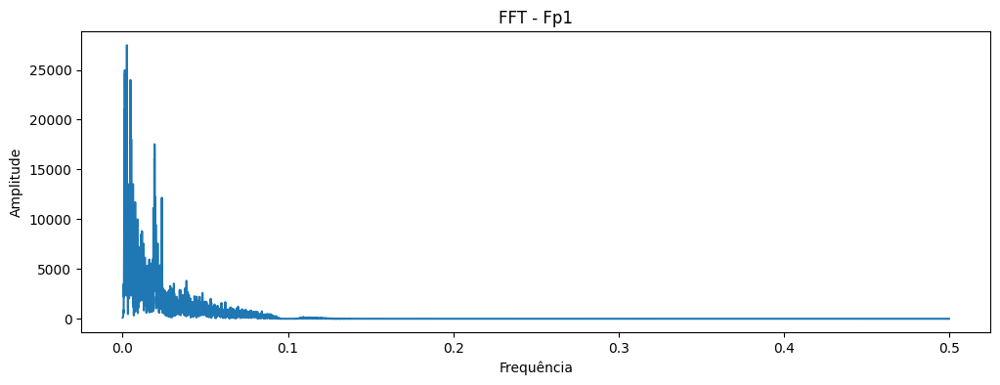

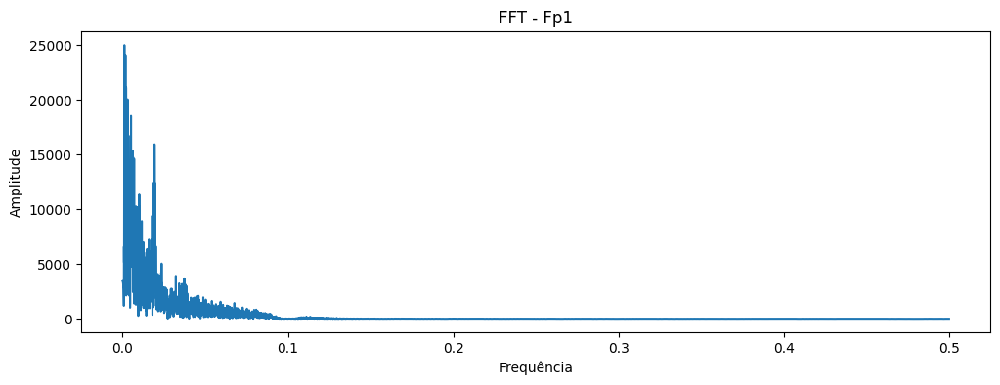

### Arquivo: s24.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,-0.044667,11.008836,-42.707,89.191
Fp2,-0.056970,8.385321,-28.381,31.033
F3,-0.043721,7.711642,-25.260,30.224
F4,-0.058118,8.104035,-28.634,28.842
F7,0.061892,9.285966,-38.421,29.134
F8,0.024569,11.493314,-68.603,40.775
T3,-0.007502,7.557400,-33.928,26.738
T4,0.098906,11.340937,-46.972,35.782
C3,-0.085465,9.401153,-37.857,49.619
C4,-0.043941,8.330552,-26.722,27.930



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,0.684117,13.711810,-49.833,38.571
Fp2,0.017881,7.984159,-32.134,26.485
F3,-0.171368,7.312717,-39.186,27.860
F4,-0.006258,7.268303,-26.763,29.222
F7,-0.269153,8.188942,-33.685,28.400
F8,-0.386538,12.299836,-41.092,49.452
T3,-0.183516,6.483660,-27.661,21.552
T4,-0.710223,13.256396,-78.626,32.996
C3,0.185558,7.496783,-25.235,28.696
C4,0.053134,7.732507,-27.248,32.414


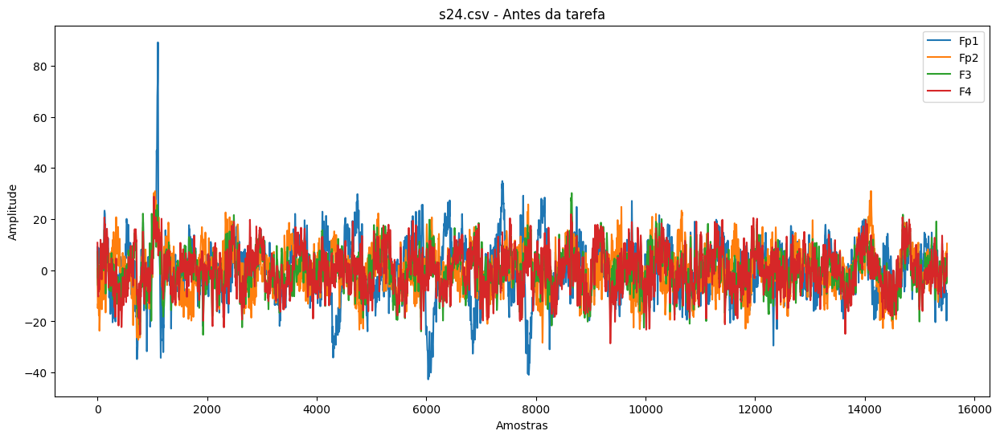

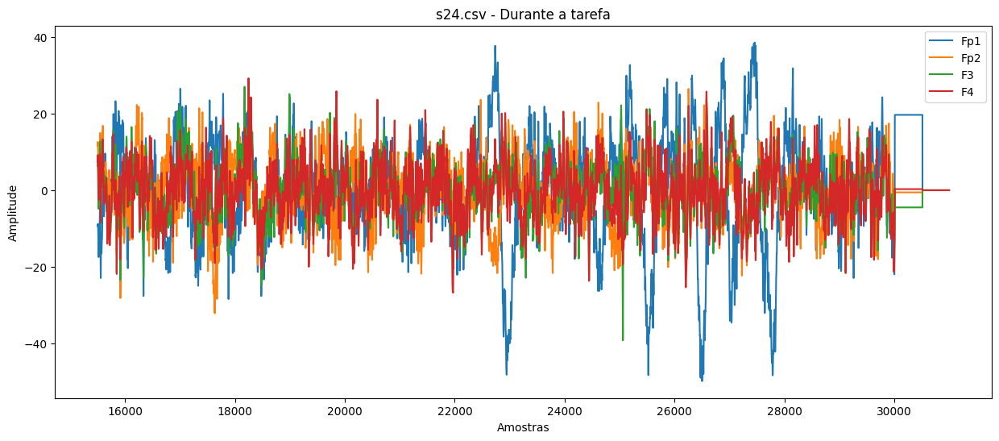

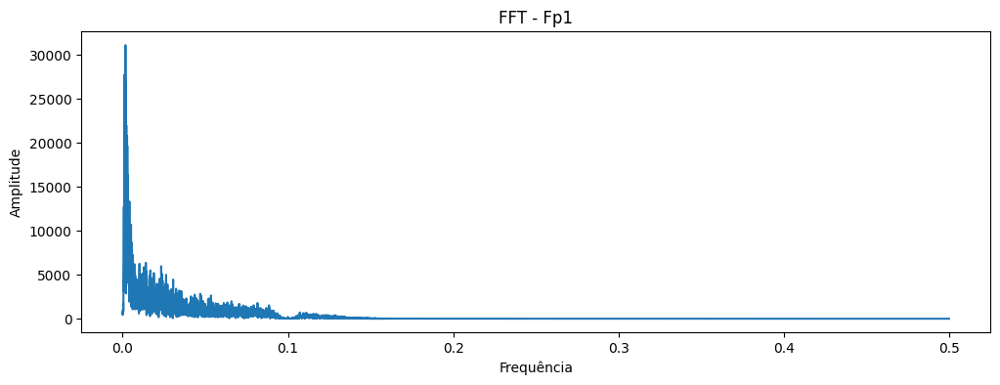

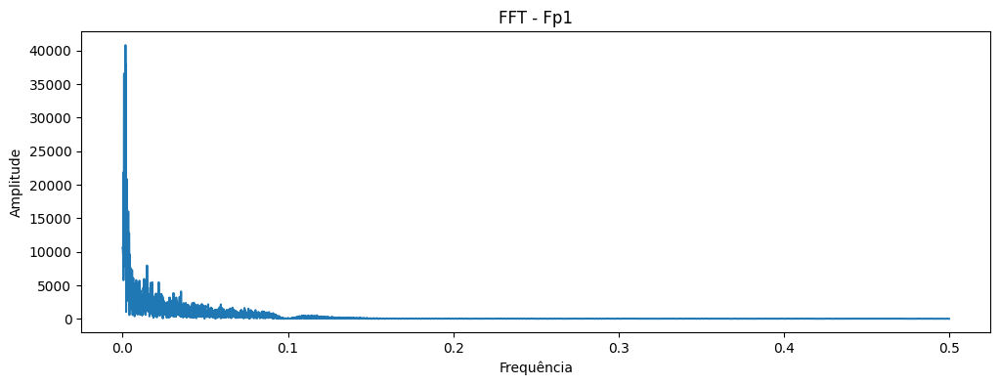

### Arquivo: s25.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,-0.098312,18.040796,-90.268,39.436
Fp2,-0.118410,22.268820,-99.284,55.589
F3,-0.045013,11.121191,-43.886,36.647
F4,-0.078093,11.612037,-45.052,35.330
F7,-0.040668,11.047510,-38.648,45.071
F8,-0.101519,10.757168,-35.766,32.388
T3,0.043703,9.539817,-31.904,36.448
T4,-0.033387,9.508880,-35.307,30.260
C3,-0.003624,11.928676,-42.271,42.921
C4,-0.122464,13.671030,-46.278,47.455



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,-0.757813,19.616058,-93.791,43.723
Fp2,-0.648228,21.862686,-106.260,62.511
F3,-0.076898,12.349650,-46.326,39.699
F4,-0.051711,13.119018,-48.116,41.819
F7,-0.128605,11.495946,-66.025,55.357
F8,-0.353989,13.090034,-71.831,46.152
T3,-0.240442,10.497342,-49.793,33.853
T4,0.465953,12.230138,-63.339,90.404
C3,-0.092625,13.984336,-53.983,47.593
C4,0.285031,15.566067,-47.164,60.071


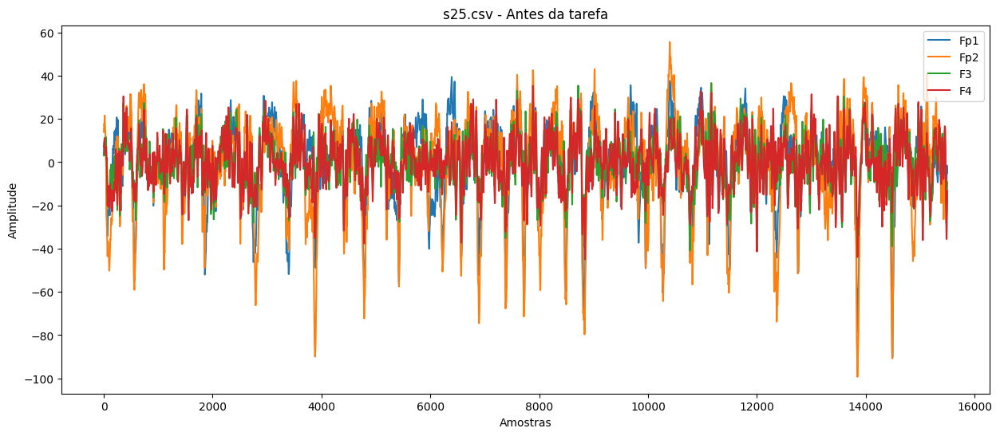

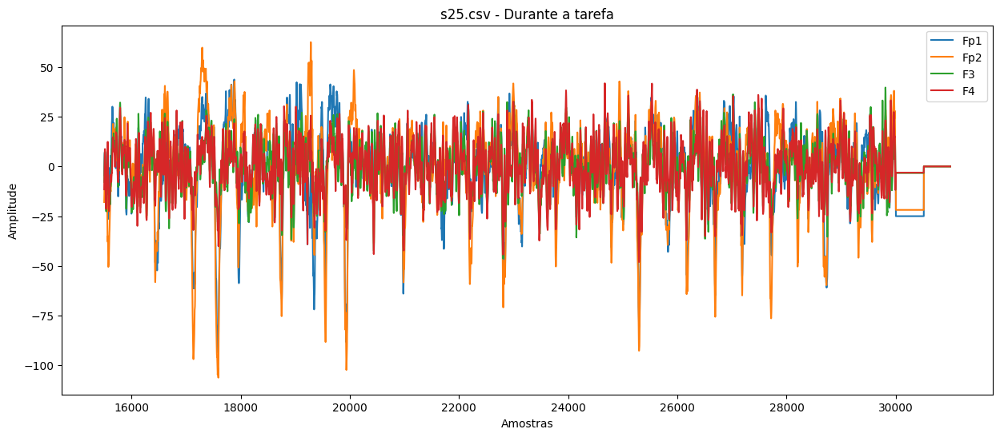

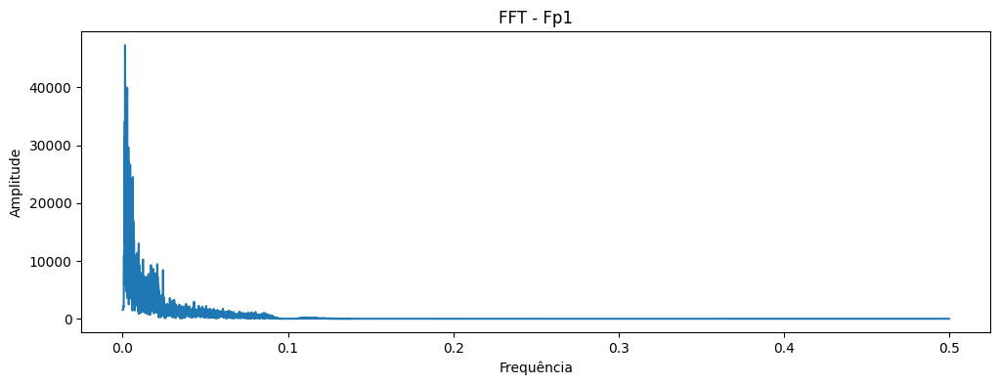

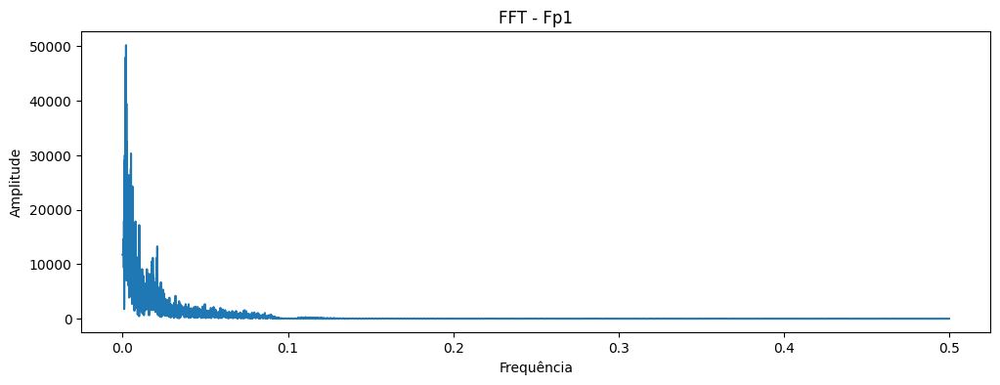

### Arquivo: s26.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,-0.090874,11.955976,-90.550,38.030
Fp2,-0.071678,15.369591,-157.720,58.145
F3,-0.109477,8.415679,-54.719,28.332
F4,-0.039725,9.165747,-71.418,45.564
F7,-0.130206,10.178361,-64.142,56.047
F8,-0.013988,12.409114,-124.190,52.828
T3,-0.061114,5.984271,-20.599,23.269
T4,-0.027872,6.263767,-34.973,23.863
C3,-0.126527,8.350775,-28.186,23.953
C4,-0.083297,8.163692,-33.964,26.192



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,-0.783186,11.543260,-45.646,34.387
Fp2,-1.500090,15.971825,-99.985,51.498
F3,-0.217398,8.235669,-29.413,34.984
F4,-0.385964,9.487036,-51.309,39.339
F7,0.346096,13.154557,-76.120,88.853
F8,-1.133523,14.027958,-90.975,52.858
T3,0.165786,6.758586,-20.978,27.641
T4,0.136350,7.455211,-38.005,45.101
C3,0.107467,8.335994,-25.435,30.634
C4,-0.059608,8.731810,-26.943,30.758


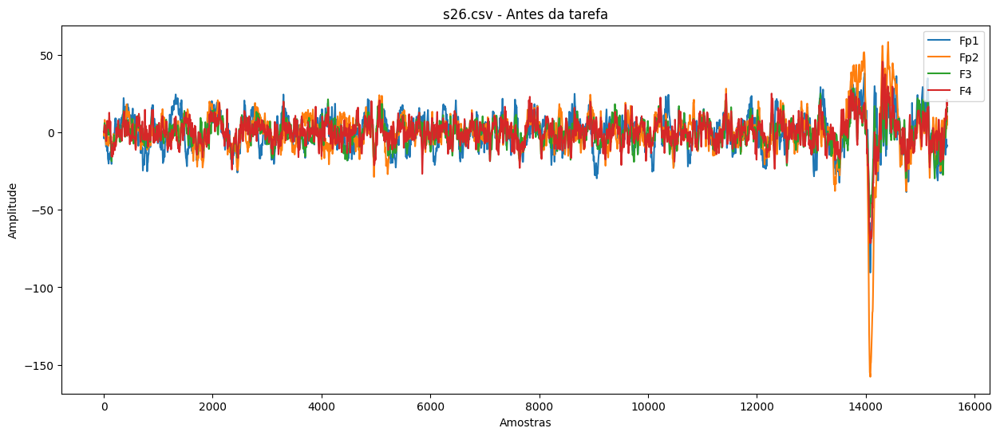

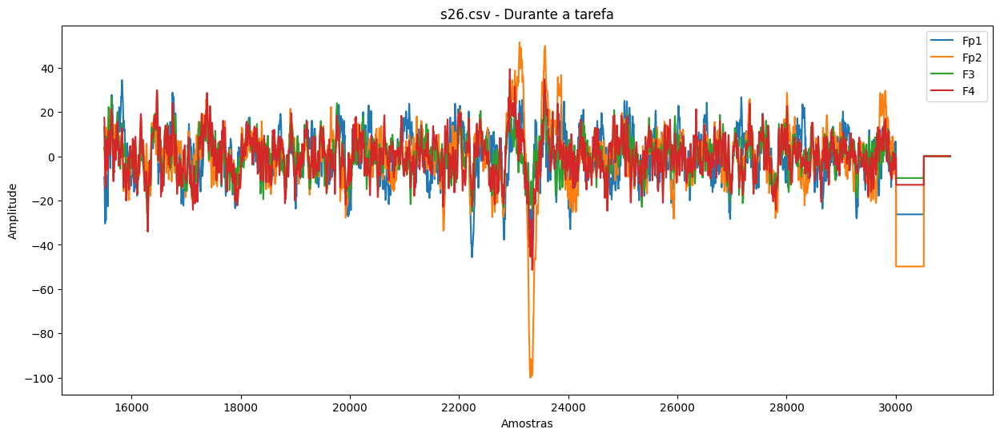

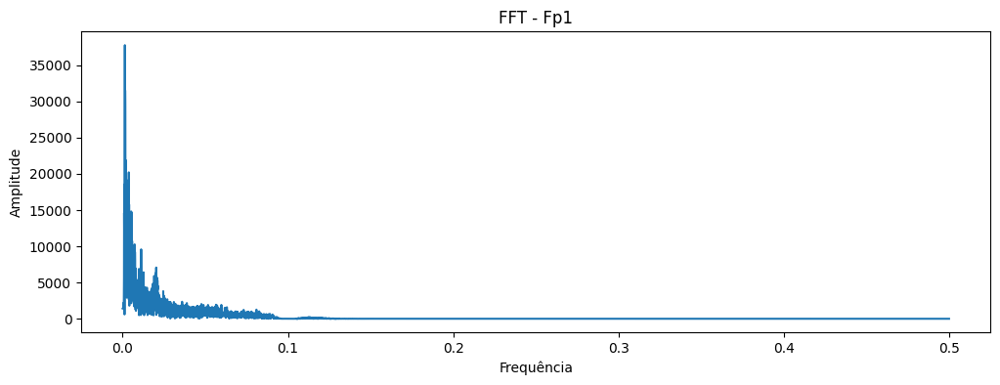

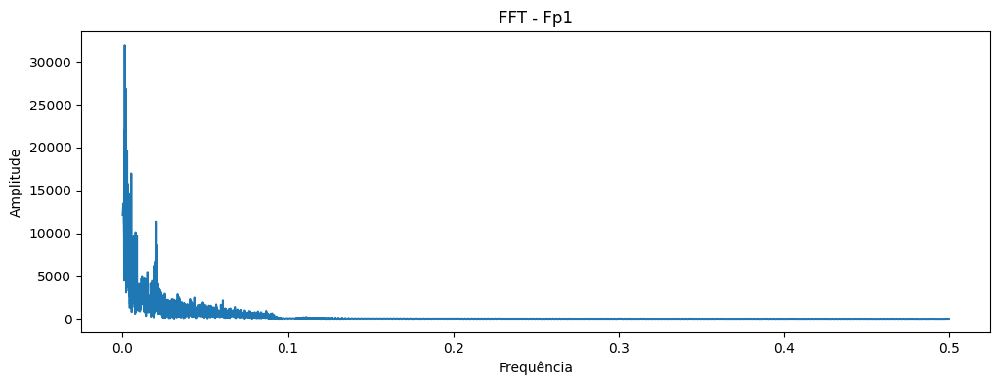

### Arquivo: s27.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,0.138829,9.111082,-41.265,34.169
Fp2,0.040028,8.051233,-28.259,33.152
F3,0.111821,8.611520,-34.615,36.667
F4,0.061708,8.374890,-31.067,29.738
F7,0.156409,7.631280,-34.366,27.400
F8,0.006164,6.852405,-27.246,22.696
T3,0.082940,6.226307,-24.250,20.435
T4,0.043049,6.664129,-21.861,22.439
C3,0.073947,7.559920,-29.784,23.878
C4,0.035231,7.562365,-25.915,25.181



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,-0.230757,10.742086,-44.480,35.532
Fp2,-0.098916,8.754503,-38.008,32.784
F3,-0.191734,9.730530,-47.628,38.854
F4,-0.116115,9.910574,-48.040,39.023
F7,0.002503,8.674272,-70.314,78.572
F8,-0.068337,9.257844,-58.447,46.337
T3,-0.308877,7.403092,-48.805,31.857
T4,-0.266925,8.246235,-55.300,35.747
C3,0.311320,8.718880,-39.677,57.894
C4,-0.038072,8.337926,-39.348,34.506


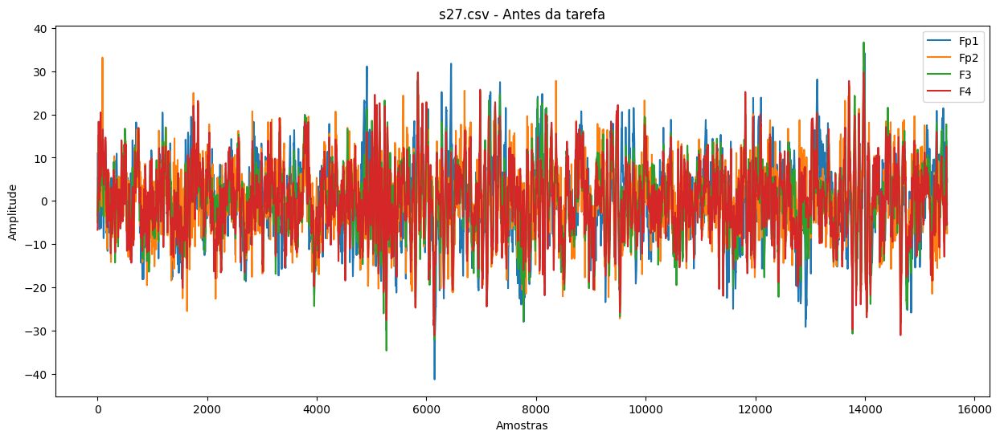

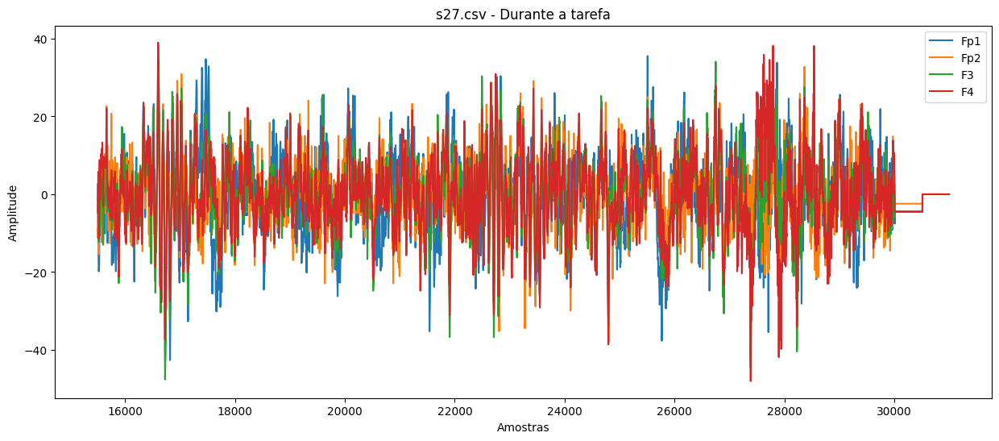

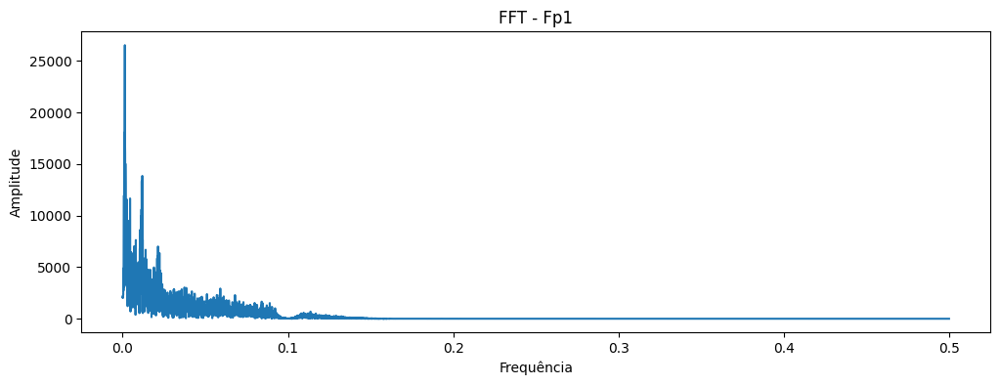

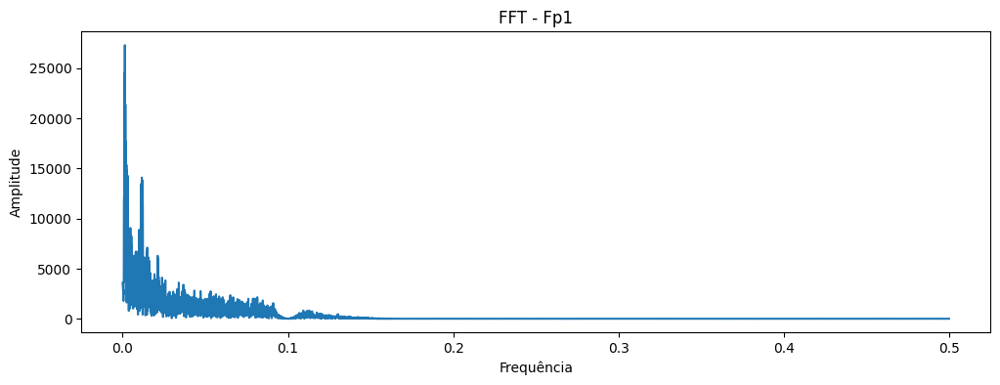

### Arquivo: s28.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,0.020058,14.658755,-53.170,60.131
Fp2,-0.062340,15.088466,-63.989,50.320
F3,0.034805,9.367294,-33.205,30.234
F4,0.054917,10.193690,-39.612,34.375
F7,-0.024603,8.153066,-31.351,30.997
F8,0.103579,11.375598,-39.472,58.854
T3,0.000240,7.789164,-39.574,29.140
T4,0.037435,8.927446,-41.276,32.099
C3,0.002143,8.963639,-39.267,28.266
C4,0.007711,9.257711,-38.758,31.588



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,-0.052097,14.044383,-59.973,48.259
Fp2,-0.239775,16.853619,-63.284,56.602
F3,0.032480,9.446153,-35.614,39.878
F4,-0.047539,10.229234,-37.388,39.105
F7,0.033497,8.403995,-33.226,35.376
F8,0.125212,11.946653,-48.923,41.116
T3,0.076263,8.665522,-39.643,38.958
T4,-0.226396,7.334770,-26.810,29.138
C3,-0.014410,8.749188,-36.409,41.040
C4,-0.107967,8.425353,-33.968,35.974


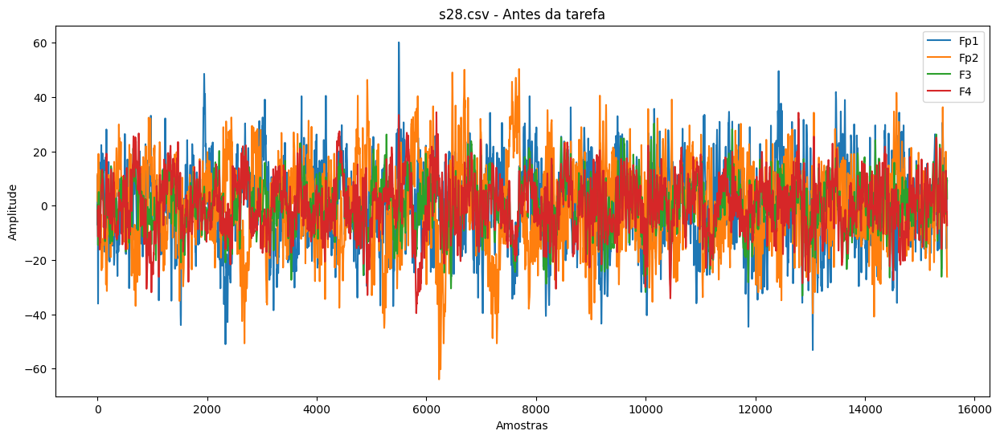

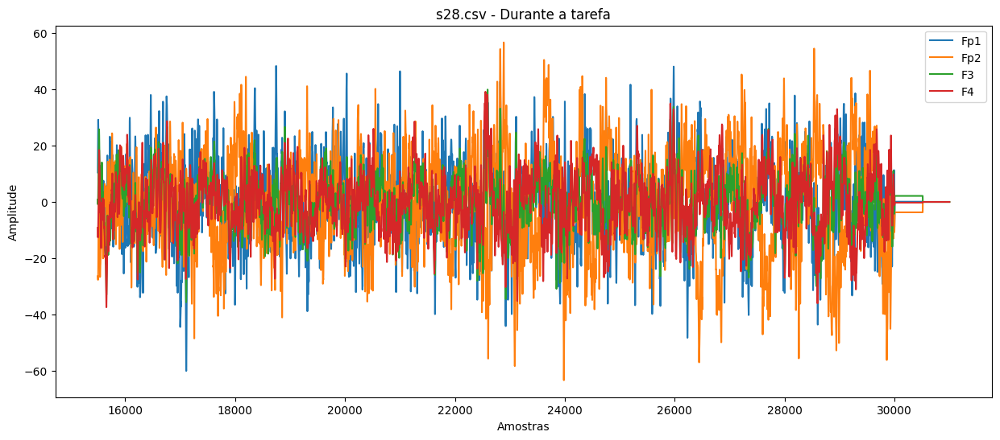

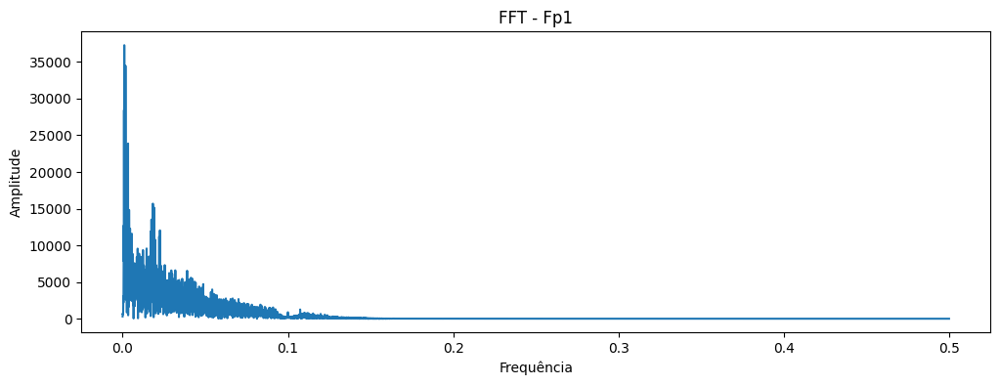

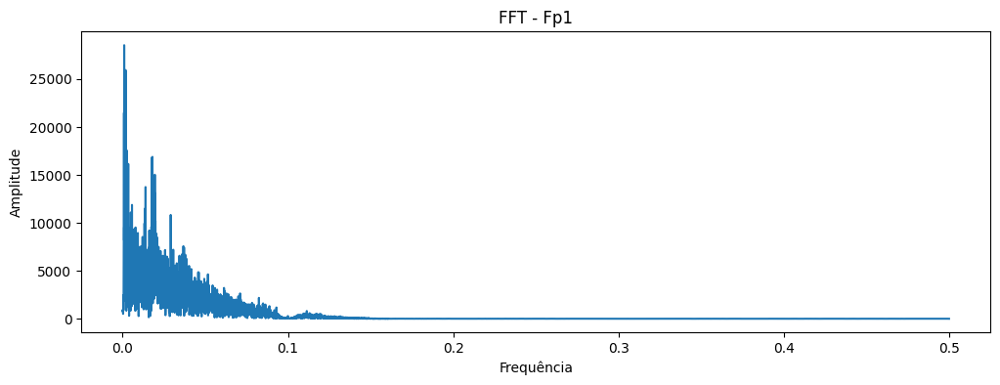

### Arquivo: s29.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,-0.011137,10.290377,-38.578,32.594
Fp2,0.029553,9.380891,-38.231,32.472
F3,-0.016433,10.657054,-41.290,35.265
F4,0.024415,9.778019,-33.278,38.103
F7,-0.008176,10.042669,-61.686,38.679
F8,0.060172,9.461739,-38.473,29.131
T3,0.042765,9.594523,-42.797,31.582
T4,0.008299,8.372138,-30.226,29.348
C3,0.010109,11.468363,-47.655,49.286
C4,0.015396,11.227268,-43.008,39.871



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,-0.194833,10.283503,-38.220,31.248
Fp2,-0.261060,10.362397,-49.347,40.952
F3,-0.233028,10.989484,-48.552,38.450
F4,-0.201470,9.836150,-43.191,36.907
F7,-0.448747,8.664876,-35.104,32.533
F8,-0.060486,10.280758,-42.388,42.976
T3,-0.200140,9.874645,-41.724,35.667
T4,0.181493,8.619534,-31.862,42.741
C3,0.002216,10.787461,-44.123,43.170
C4,-0.062868,11.428053,-52.014,51.037


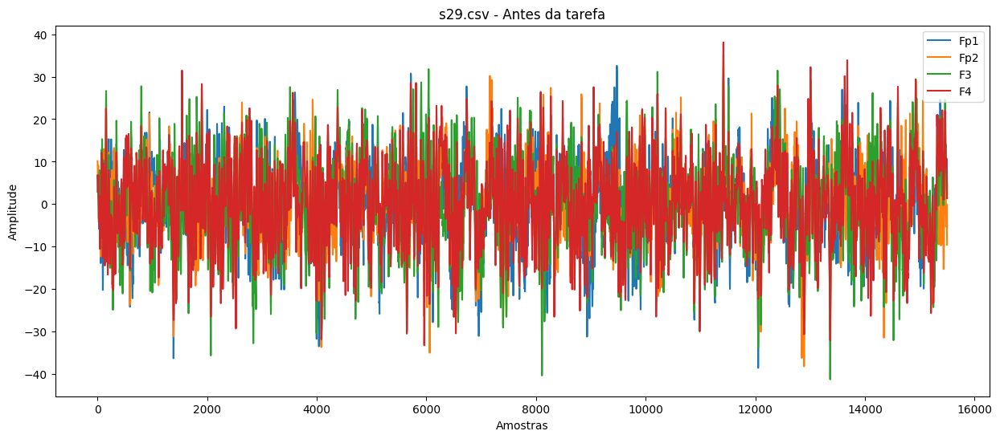

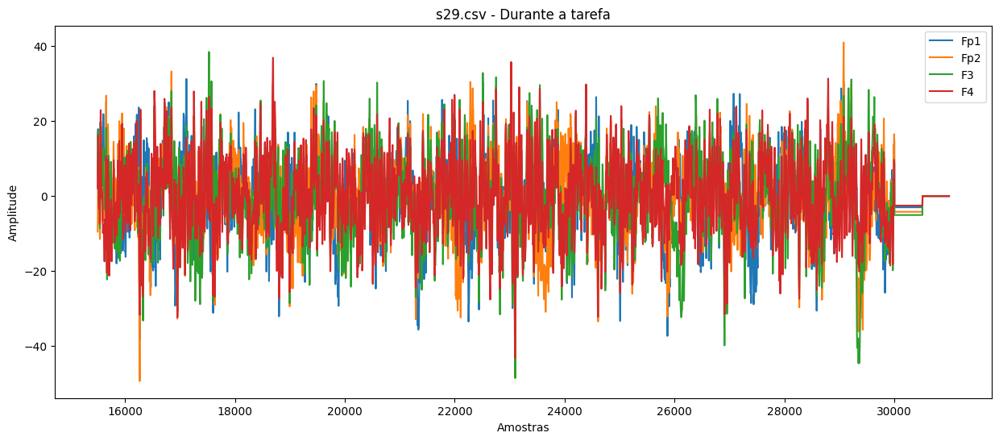

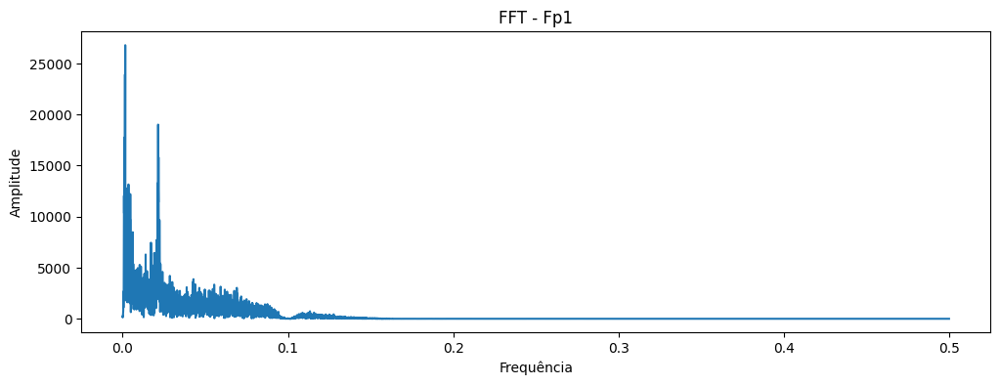

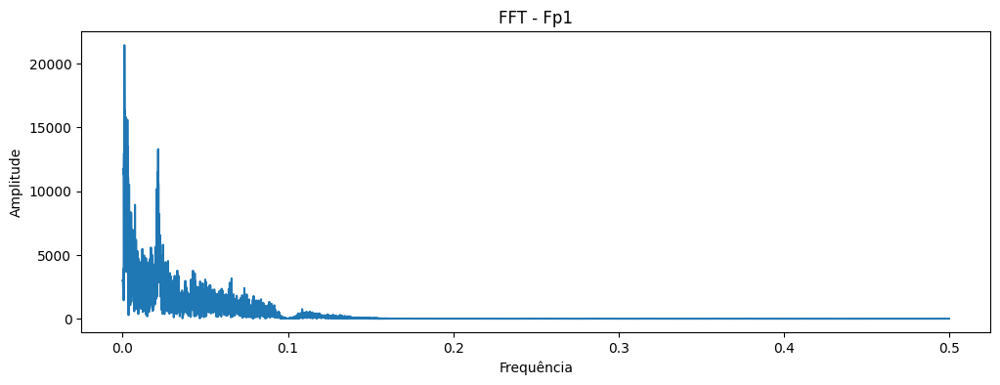

### Arquivo: s30.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,0.009684,14.248957,-40.399,42.965
Fp2,0.052624,13.362286,-52.063,37.987
F3,0.010769,10.138798,-31.547,33.638
F4,0.079155,9.776935,-35.546,30.992
F7,-0.046367,11.687559,-36.429,36.612
F8,0.102826,11.952851,-61.884,35.849
T3,0.007287,10.078229,-37.591,43.177
T4,0.047324,6.388341,-23.528,23.019
C3,0.043309,10.021404,-32.519,38.410
C4,0.066413,11.728699,-45.693,34.409



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,0.159372,11.739116,-40.489,36.196
Fp2,-0.140373,10.814299,-38.956,31.049
F3,0.126687,8.808984,-31.172,28.520
F4,-0.032691,8.264030,-30.926,31.664
F7,0.136375,10.402227,-32.558,30.895
F8,-0.449987,11.628458,-36.994,34.591
T3,0.192940,9.529624,-33.078,46.145
T4,-0.016720,5.955197,-22.022,22.971
C3,0.106849,9.657933,-36.111,35.856
C4,-0.223566,11.727540,-51.052,40.971


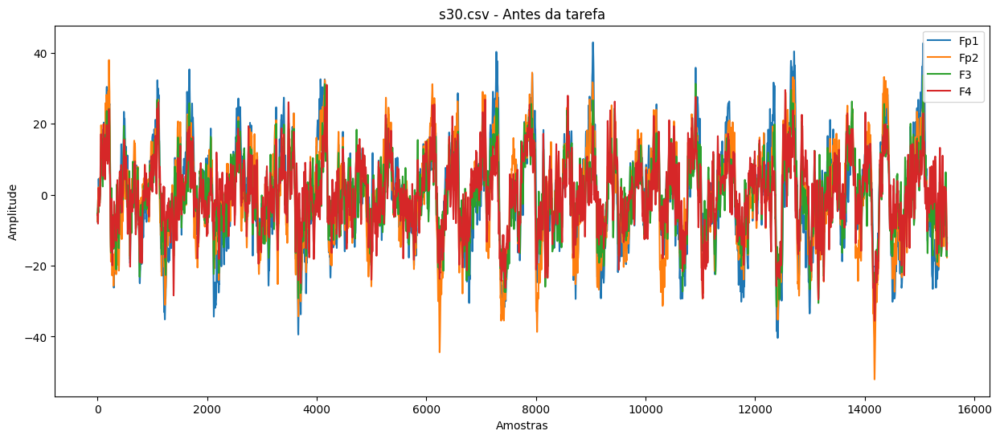

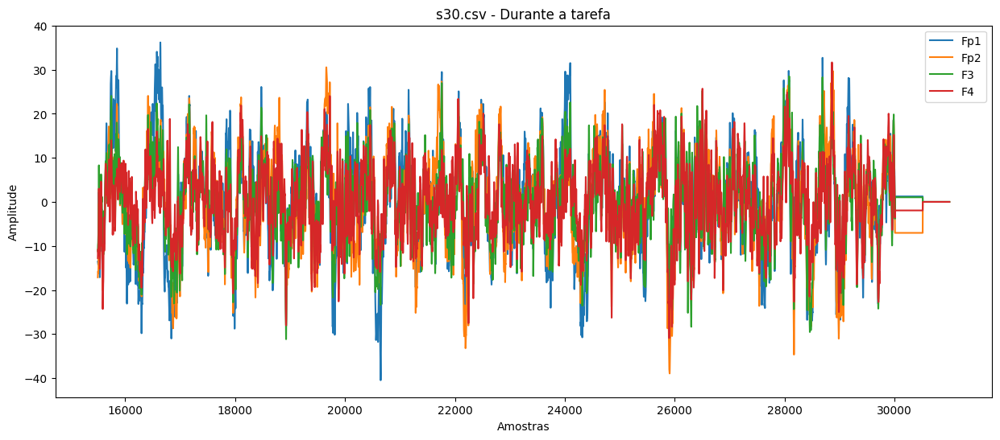

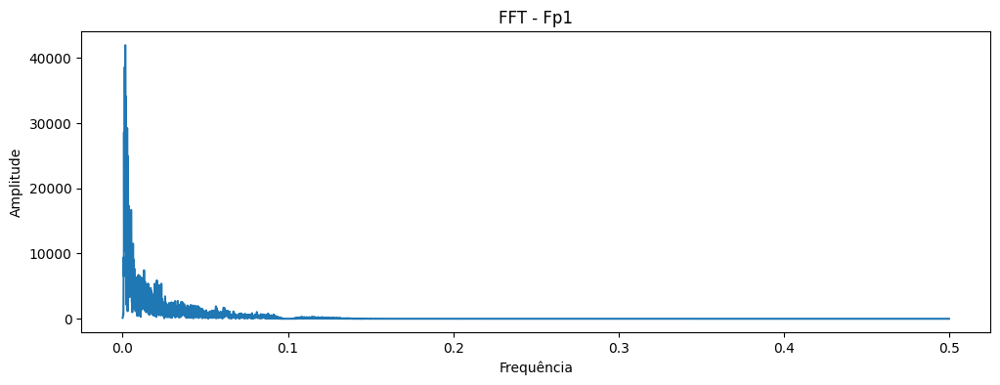

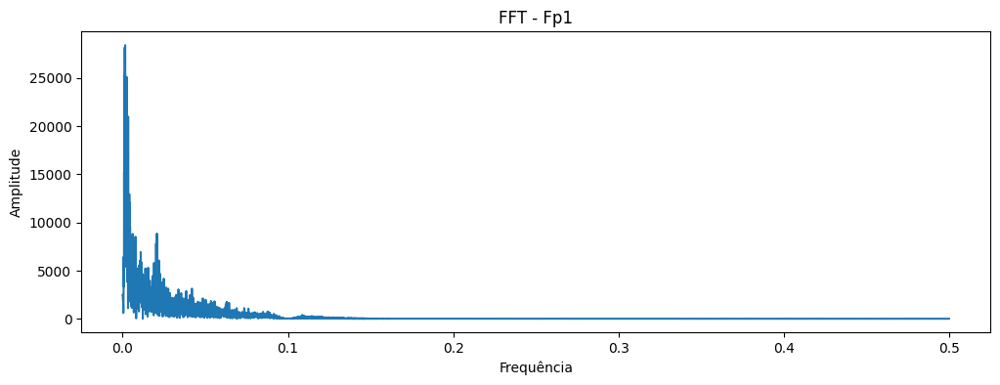

### Arquivo: s31.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,0.000971,7.642743,-37.383,37.654
Fp2,0.020289,10.134771,-40.042,37.443
F3,0.040248,7.616404,-26.051,28.905
F4,0.024315,8.586989,-31.855,28.156
F7,0.036266,7.134098,-27.987,31.944
F8,0.036264,8.757277,-40.220,30.994
T3,0.019694,5.252376,-16.957,16.108
T4,-0.003929,8.638239,-25.771,28.965
C3,-0.010568,8.537470,-33.540,26.025
C4,0.062768,11.343031,-38.137,34.699



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,0.802578,8.048319,-43.419,90.294
Fp2,-0.152302,11.035931,-73.515,59.970
F3,-0.156104,8.308270,-68.544,58.818
F4,0.383529,9.291701,-48.611,70.184
F7,-0.471091,8.328902,-79.960,51.133
F8,-0.202134,9.536264,-75.013,63.417
T3,0.097551,5.987649,-32.302,37.797
T4,-0.083112,11.930548,-103.110,96.774
C3,-0.589863,9.984831,-73.463,37.560
C4,-0.333807,11.745058,-60.125,46.988


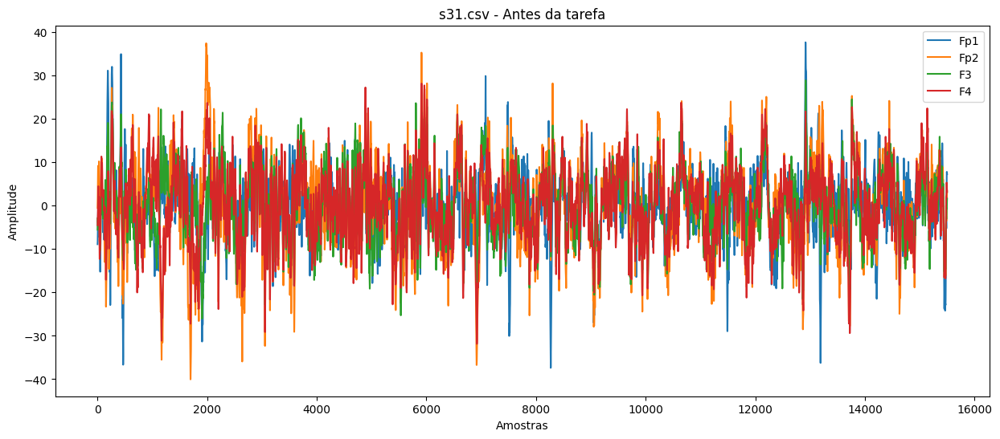

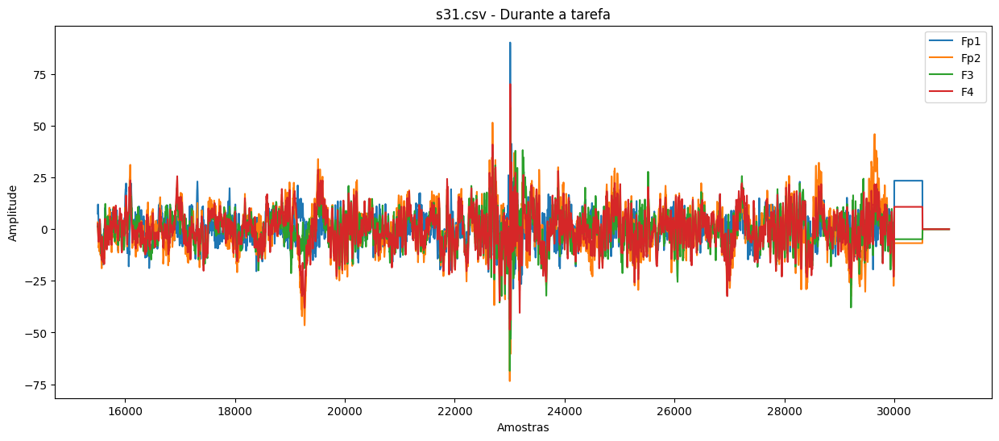

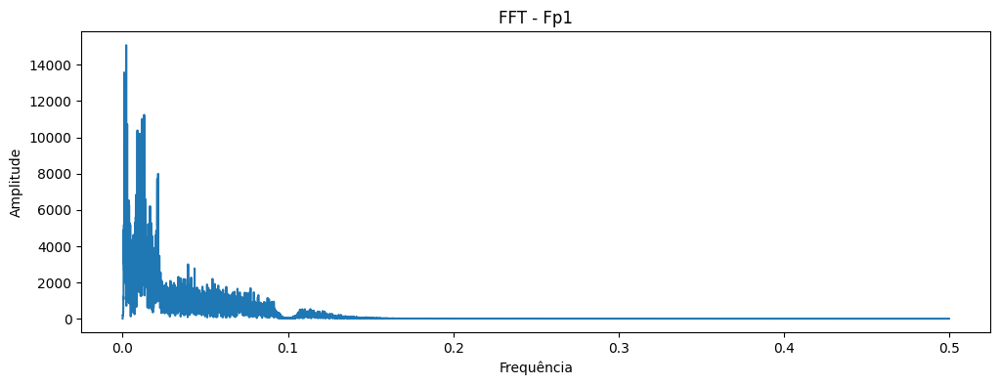

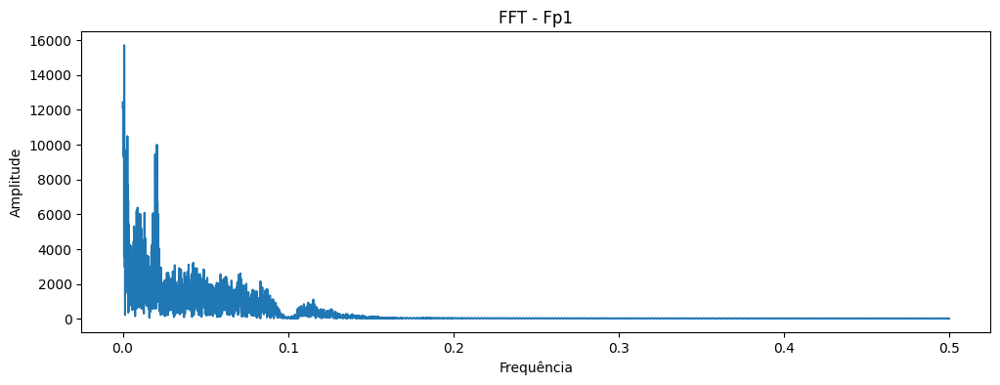

### Arquivo: s32.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,-0.109150,12.078277,-63.208,41.701
Fp2,-0.084133,10.586147,-46.528,41.938
F3,-0.028635,9.279260,-72.870,33.155
F4,-0.012334,9.889970,-31.639,36.468
F7,-0.023229,6.533876,-26.782,44.992
F8,-0.060801,9.331663,-29.562,32.935
T3,0.003931,7.523716,-31.076,50.773
T4,0.043113,9.727649,-32.941,38.385
C3,-0.021791,10.679939,-57.171,40.217
C4,-0.010845,11.095606,-45.857,36.703



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,-0.366152,11.389894,-40.176,40.040
Fp2,-0.082074,8.894443,-32.881,36.880
F3,-0.691518,9.137751,-28.500,29.382
F4,0.013556,9.343240,-31.986,33.913
F7,0.260452,6.120223,-22.991,21.216
F8,0.021791,9.322456,-34.012,29.384
T3,0.253022,6.995146,-26.492,26.063
T4,-0.010527,9.053922,-37.852,35.654
C3,-0.334464,9.728323,-35.057,37.585
C4,-0.118605,10.105726,-34.826,42.564


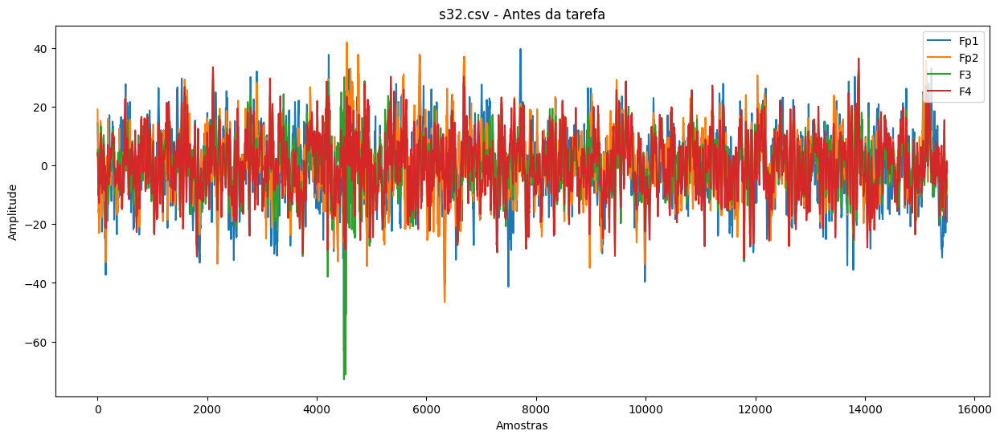

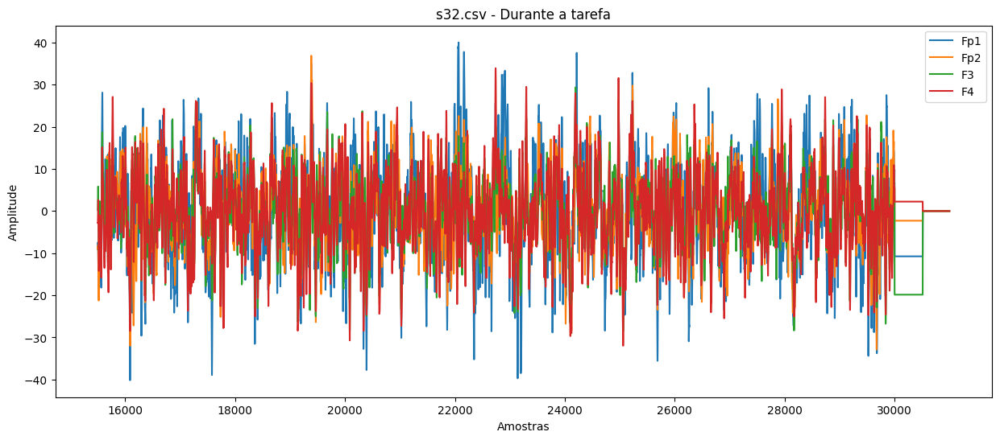

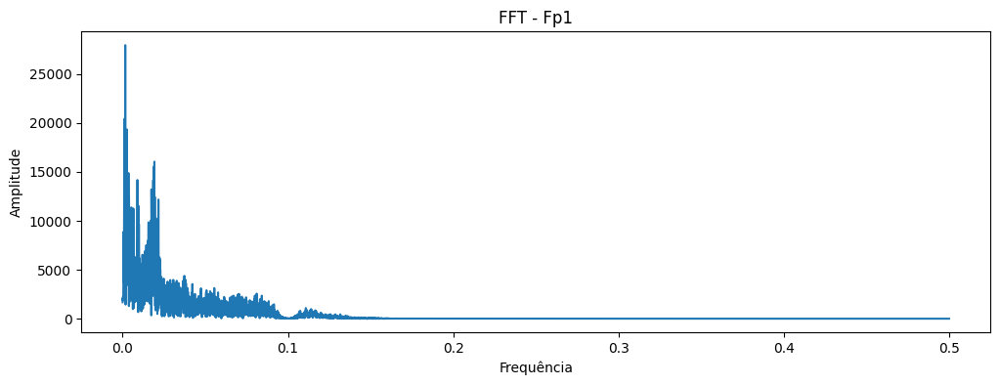

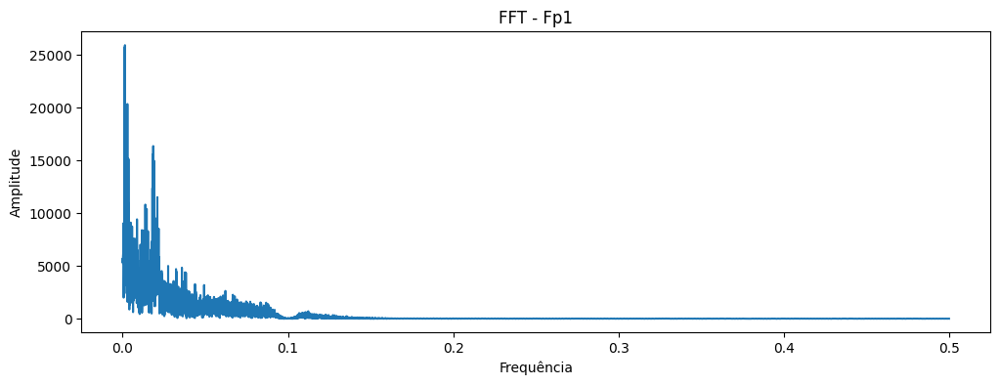

### Arquivo: s33.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,0.004664,7.907305,-30.445,25.569
Fp2,0.056602,8.569356,-34.963,26.642
F3,0.046107,8.259971,-30.285,25.348
F4,0.078142,8.570326,-34.272,28.133
F7,0.054831,9.165979,-39.429,37.985
F8,0.050041,9.162194,-34.811,30.110
T3,0.060552,6.508583,-26.741,27.627
T4,0.054469,7.354417,-28.724,25.685
C3,0.092407,8.113764,-29.402,27.679
C4,0.076943,8.590698,-30.089,29.509



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,0.105336,8.516502,-25.632,36.818
Fp2,-0.038436,8.695521,-34.168,36.136
F3,-0.032100,8.372319,-33.947,32.317
F4,0.011008,8.363560,-29.715,36.943
F7,0.018559,9.748166,-31.611,42.076
F8,-0.061629,9.657307,-35.752,34.916
T3,0.036016,6.620988,-23.841,24.487
T4,0.100568,7.092391,-26.801,37.917
C3,-0.039898,7.690189,-28.419,26.934
C4,0.059614,8.035407,-27.459,36.425


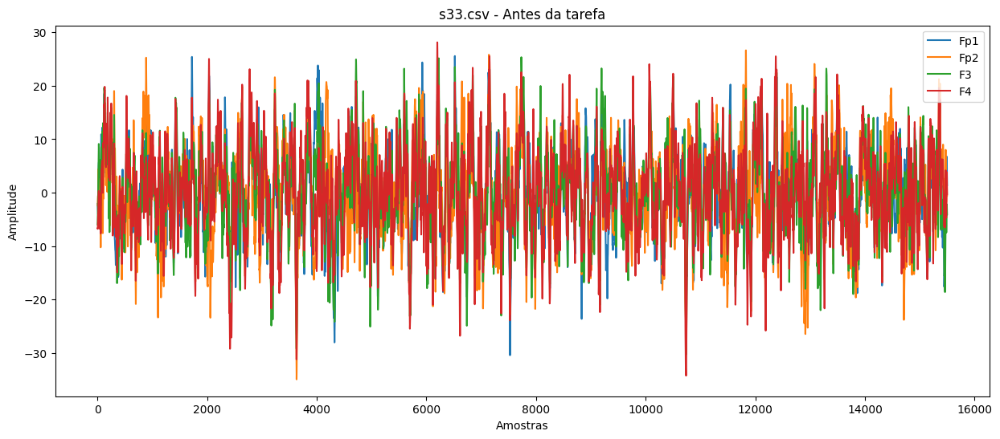

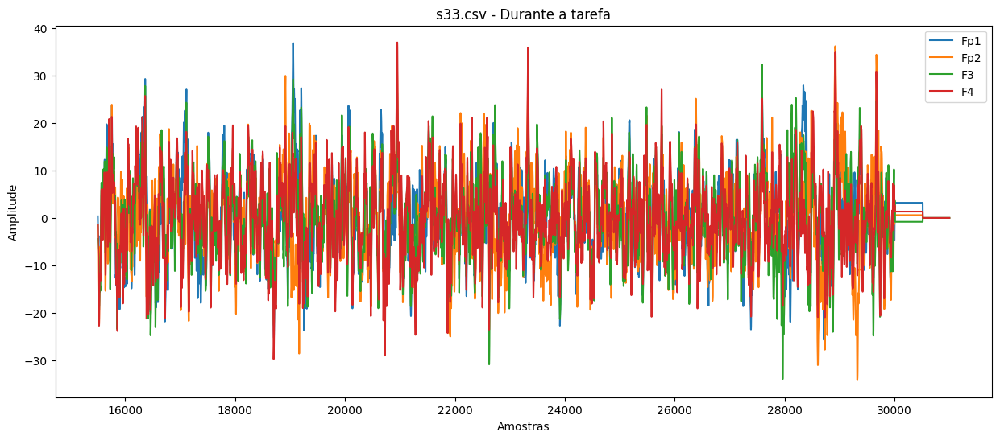

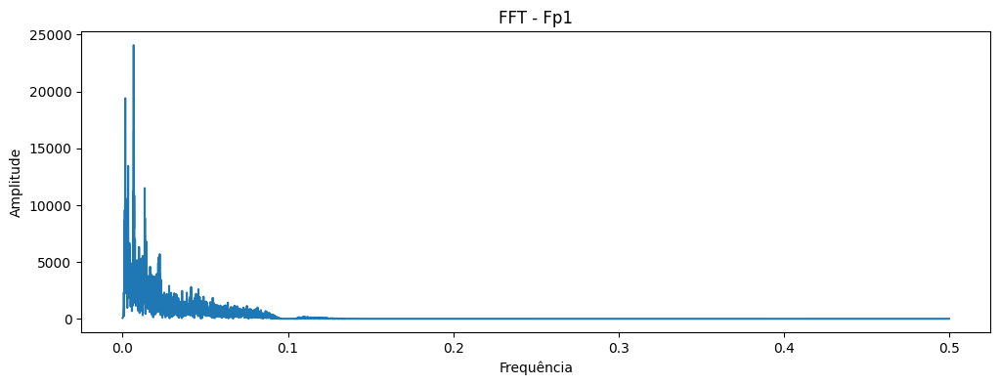

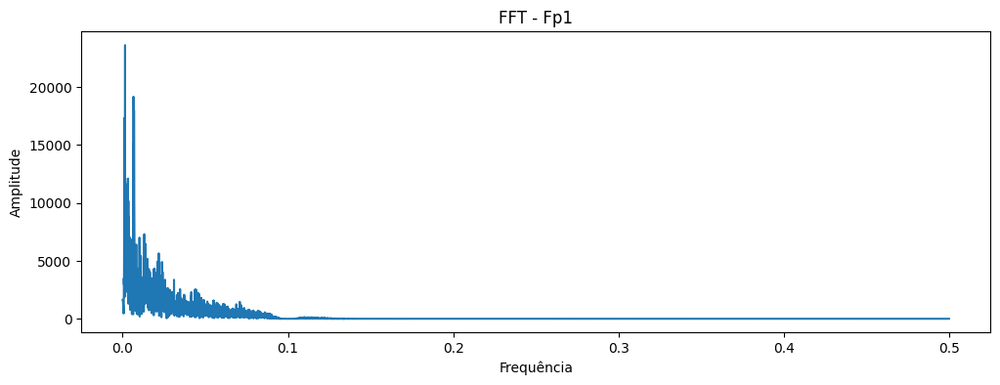

### Arquivo: s34.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,-0.115758,11.872747,-39.603,40.443
Fp2,0.022282,9.858245,-36.182,48.513
F3,-0.120624,10.287250,-38.601,54.251
F4,-0.112199,9.092604,-30.665,52.968
F7,-0.110490,7.805243,-29.010,37.634
F8,0.002757,15.300132,-61.753,52.479
T3,-0.031052,10.000901,-33.061,36.883
T4,-0.036884,7.788944,-31.376,34.581
C3,-0.083453,9.893610,-38.691,43.037
C4,-0.066007,9.707815,-36.682,39.752



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,0.121999,10.108918,-39.823,34.281
Fp2,0.174554,8.857284,-33.242,36.317
F3,0.222281,10.663448,-47.816,40.206
F4,0.198254,9.450971,-48.938,35.550
F7,0.127481,7.413660,-33.506,28.160
F8,-0.190804,12.844811,-45.472,40.799
T3,0.012000,9.779924,-40.674,39.457
T4,0.070763,8.030533,-33.168,27.953
C3,0.037571,9.609301,-44.375,34.419
C4,-0.050234,9.685546,-47.568,38.964


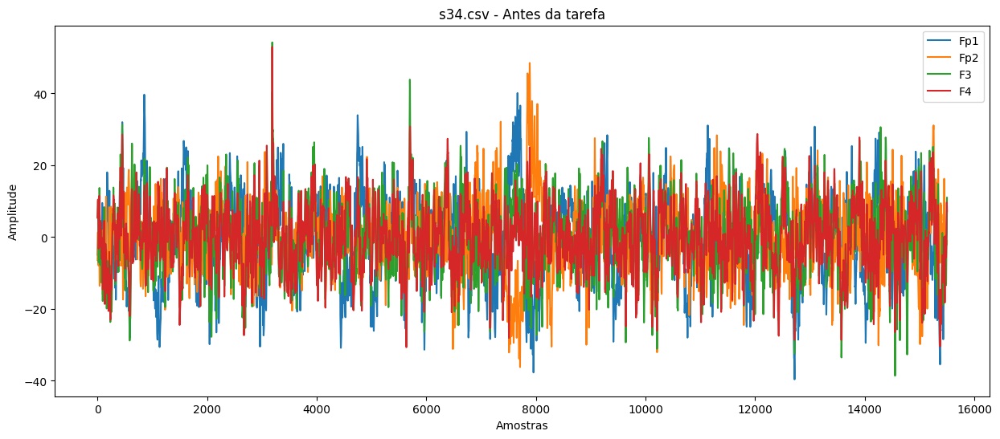

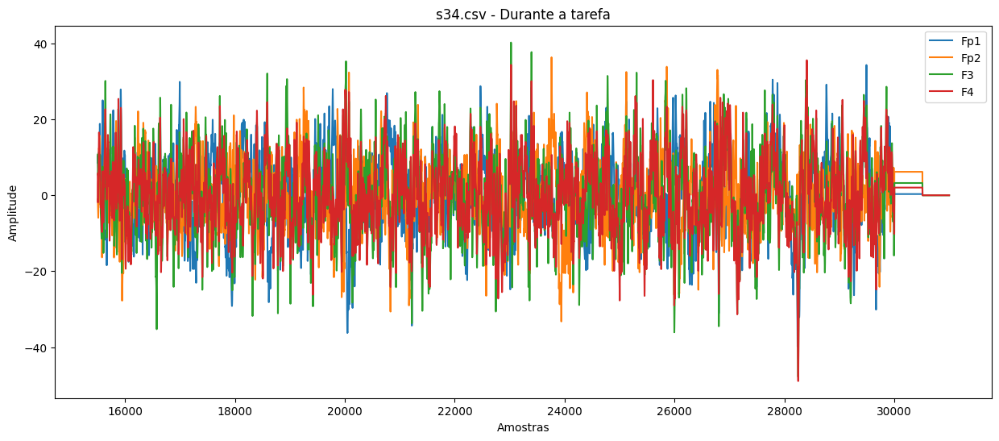

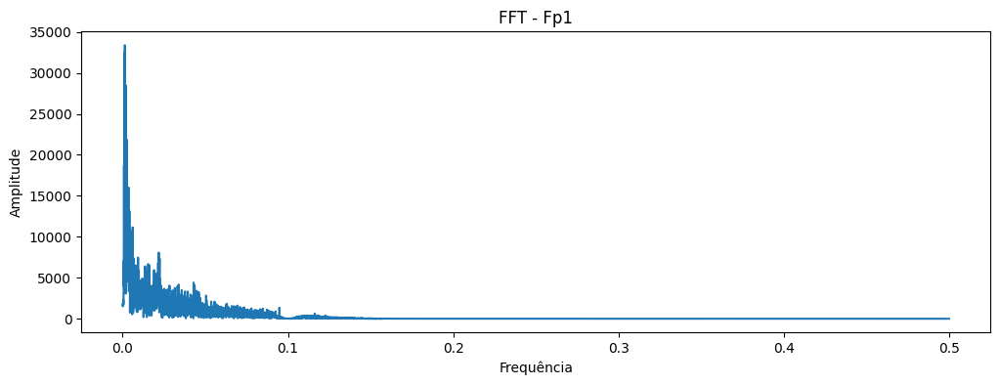

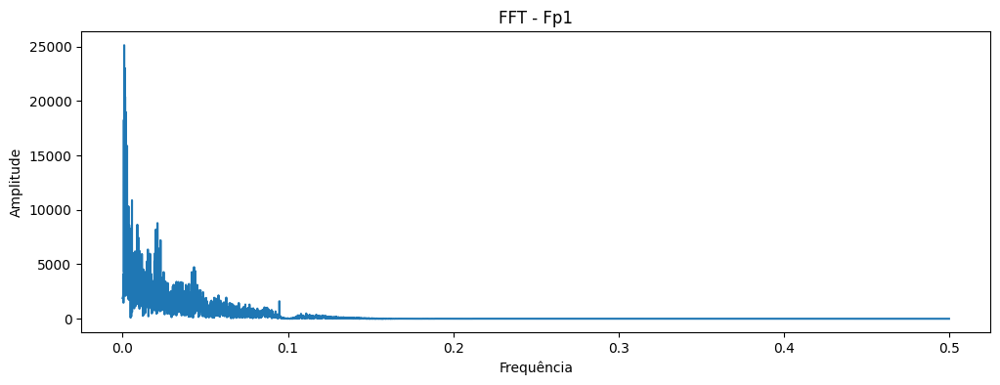

### Arquivo: s35.csv ###
### Estatísticas - Antes da tarefa ###


,mean,std,min,max
Fp1,0.143834,10.696078,-35.984,35.966
Fp2,0.036797,7.973301,-43.265,27.949
F3,0.080119,7.972257,-28.771,30.939
F4,0.016599,9.311947,-44.617,34.283
F7,-0.059454,8.803590,-32.610,35.843
F8,0.029712,8.396933,-34.444,27.076
T3,-0.007271,8.459721,-33.611,31.108
T4,-0.040513,8.885321,-32.259,25.687
C3,0.015810,8.731103,-35.132,29.759
C4,0.027936,8.481647,-34.645,29.361



### Estatísticas - Durante a tarefa ###


,mean,std,min,max
Fp1,-0.208641,11.993236,-51.382,48.324
Fp2,-0.162199,9.206705,-36.249,38.766
F3,-0.051179,9.133995,-34.844,38.220
F4,-0.085346,10.473757,-40.777,43.335
F7,-0.077292,9.411550,-46.691,42.407
F8,-0.044124,9.125516,-40.570,43.029
T3,-0.013330,9.835061,-36.804,35.418
T4,-0.053442,9.894286,-40.367,41.954
C3,-0.149259,8.550332,-33.690,28.349
C4,-0.100434,9.295175,-34.851,33.292


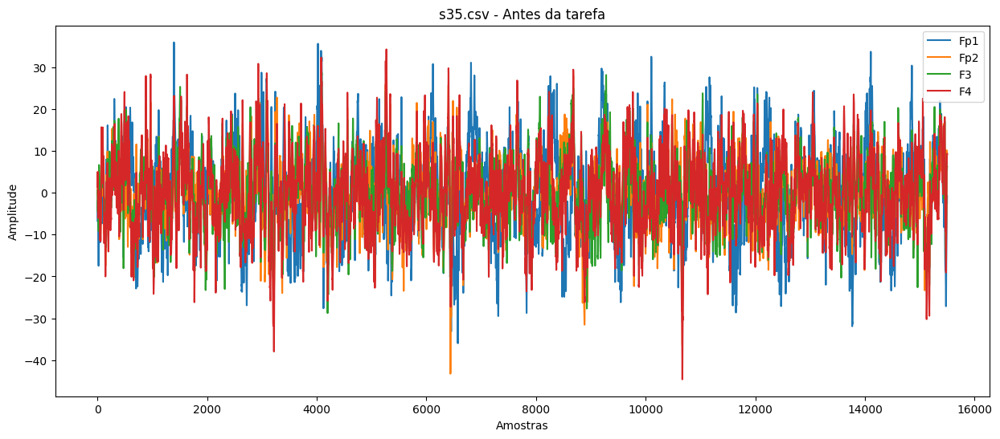

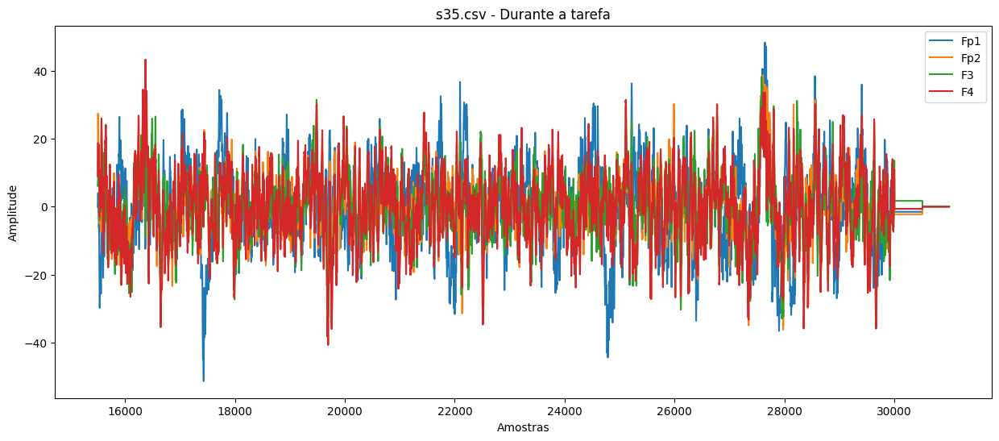

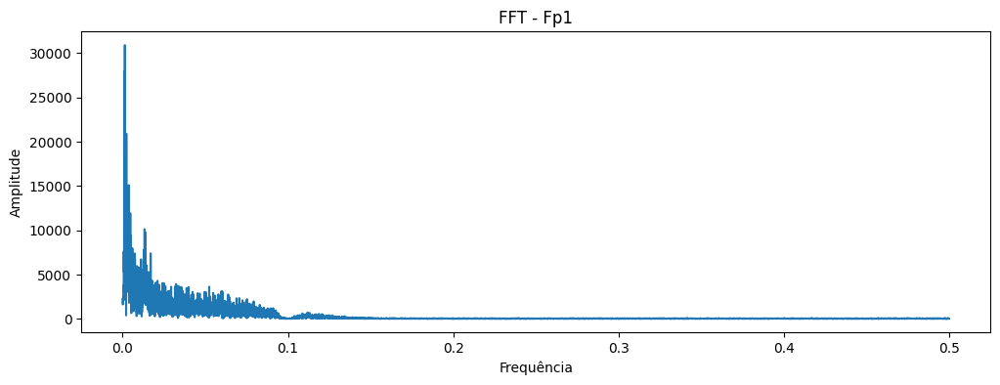

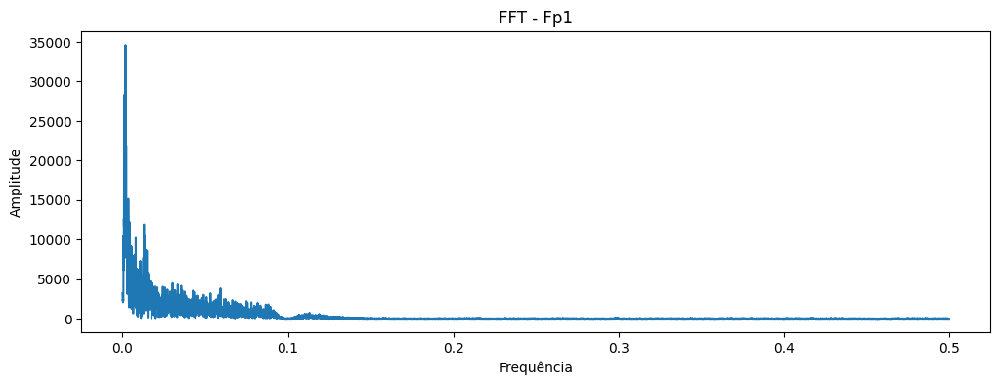

In [6]:
for file in csv_files:
    df = eeg_data[file]
    before, during = split_before_after(df)
    
    # Estatísticas
    stats_before = compute_stats(before)
    stats_during = compute_stats(during)
    
    print(f"### Arquivo: {file} ###")
    print("### Estatísticas - Antes da tarefa ###")
    display(stats_before)
    print("\n### Estatísticas - Durante a tarefa ###")
    display(stats_during)
    
    # Plots de sinais (primeiros 4 canais)
    plot_eeg_signals(before, channels=['Fp1','Fp2','F3','F4'],
                     title=f"{file} - Antes da tarefa", save_path=f"plots/sinais/{file}_before.png")
    plot_eeg_signals(during, channels=['Fp1','Fp2','F3','F4'],
                     title=f"{file} - Durante a tarefa", save_path=f"plots/sinais/{file}_during.png")
    
    # Plots FFT do canal Fp1
    plot_fft(before, 'Fp1', save_path=f"plots/fft/{file}_fft_before.png")
    plot_fft(during, 'Fp1', save_path=f"plots/fft/{file}_fft_during.png")

# Considerações Finais

Nesta análise de EEG, foi possível observar diferenças nos sinais cerebrais **antes** e **durante** a execução da tarefa de aritmética mental.  

Principais pontos observados:

- Estatísticas descritivas indicam mudanças na média e desvio padrão dos canais durante a tarefa.
- Os gráficos de sinais mostram variações de amplitude que refletem atividade cerebral diferente.
- A Transformada Rápida de Fourier (FFT) do canal Fp1 evidencia mudanças no espectro de frequência, que podem estar associadas à carga cognitiva da tarefa.
- O notebook está estruturado para facilitar a análise de todos os sujeitos do dataset, e todos os gráficos foram salvos para futura apresentação ou portfólio.

**Próximos passos possíveis:**
- Analisar correlações entre canais.
- Testar filtragem de frequência (ex.: bandas alfa, beta, theta).
- Aplicar métodos de machine learning para classificação de estados mentais.
- Comparar resultados entre diferentes sujeitos ou tarefas.

Este notebook fornece uma base sólida para futuros estudos em EEG, Ciência de Dados e Neurociência, sendo um ótimo material para **portfólio profissional**.
